In [1]:

import numpy as np, pandas as pd, seaborn as sns, tensorflow as tf
from bayes_opt import BayesianOptimization
from bayes_opt.event import Events
from bayes_opt.util import UtilityFunction
import datetime, gc, copy, os
import matplotlib.pyplot as plt
from uncertainties import unumpy
from warnings import filterwarnings
import traceback, json

from lstm_model import *
from data_preparation import *
from hypeparameter_sweep import *
from graphing_results import *
from wandb_launch import *


2024-10-31 20:21:26.189272: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-10-31 20:21:26.211020: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-10-31 20:21:26.217569: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-10-31 20:21:26.234848: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-10-31 20:21:27.316449: W tensorflow/comp

In [2]:

wandb_login()

sns.set_theme()
filterwarnings("ignore")
tf.keras.backend.clear_session()
gc.collect()
set_seed(42)
os.makedirs(RESULT_FOLDER, exist_ok=True)

GLOBAL_SETTINGS = {     
                        'disable_wandb'         :   False,

                        'extra_features_enabled':   False,
                        'include_GWL_as_feature':   True,  #Target = False
                        'prediction_length'     :   8,
                        'k_nearest_wells'       :   0,
                        'val_size'              :   0.1,
                        'test_size'             :   0.1,
                        'seeds_per_config'      :   1,     #3
                        'seeds_for_best_config' :   4,     #7
                        'predict_repetitions'   :   100,   #100 # set this parameter to 1
                                                                # if model doesn't uses "MCDroput" layer

                        # 'num_outputs'           :   1,
                        'learning_rate'         :   1e-3,  #1e-3
                        'clip_norm'             :   1,     #1
                        'epochs'                :   100,     #100
                        'no_of_dense_layers'    :   3,     #4

                        'state_management'      :   True,   #True
                        'optimize_state_managment': True,
                        'dense_activation_layer':   'relu', #relu

                        'early_stopping_monitor':   'val_loss',
                        'early_stopping_mode'   :   'min',
                        'early_stopping_patience':  15,

                        'reducelr_monitor'      :   'val_loss',
                        'reducelr_mode'         :   'min',
                        'reducelr_factor'       :   (0.1 ** (1/3)),
                        'reducelr_patience'     :   5,
                        'reducelr_minlr'        :   1e-7
                }

#constrained optimization technique, so you must specify the minimum and maximum values that can be probed for each parameter
OPTIMIZATION_BOUNDS =   {
                                'seq_length'          : (5, 52),   #(5, 52)
                                'batch_size'          : (16, 256),  #(16, 256)

                                'no_of_lstm_layers'   : (2, 5),    #(2, 5)
                                'lstm_hidden_units'   : (16, 512)   #(64, 1024)

                                # 'lstm1_units': (20, 256),
                                # 'lstm2_units': (20, 256),
                                # 'dense_size': (20, 256)
                        }

if GLOBAL_SETTINGS['optimize_state_managment'] == True:
        OPTIMIZATION_BOUNDS.update({
                                        'bidirectional'         : (-0.5, 1.5),
                                        'use_state_layernorms'  : (-0.5, 2.5)
                                        # ,'state_management'      : (-0.5, 1.5)
                                })
else:
        GLOBAL_SETTINGS.update({
                                'bidirectional'         :   True,  #True
                                'use_state_layernorms'  :   2      #2
                        })

start_pharse = PREFIX_DENSE_SIZE_PARAM
end_phrase = POSTFIX_PHRASE_DENSE_SIZE_PARAM
for i in range(1, GLOBAL_SETTINGS['no_of_dense_layers'] + 1):
        OPTIMIZATION_BOUNDS.update({f'{start_pharse}{i}{end_phrase}': (16, 256)})  #(16, 512)

BAYES_CONFIG = {
                        'phase1': { #Random exploration
                                'steps': 20, #10
                                'xi': 0.5
                        },

                        'phase2': { #Bayes exploration
                                'steps': 10, #5
                                'xi': 0.8
                        },

                        'phase3': { #Bayes exploitation
                                'steps': 10, #5
                                'xi': 0.02
                        }
                }       #  Prefer exploitation (xi=0.0) / Prefer exploration (xi=1.0)

wandb: Appending key for api.wandb.ai to your netrc file: /home/ishan/.netrc


In [3]:

# This will automatically use the GPU for all operations, if available
physical_devices = tf.config.list_physical_devices('GPU')
print(physical_devices)
if physical_devices:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
    tf.config.set_visible_devices(physical_devices[0], 'GPU')


[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


(target_well_no:110) BayesOpt-Iteration 1 - ini-Ensemblemember 1


wandb: Using wandb-core as the SDK backend. Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: orphic-vis. Use `wandb login --relogin` to force relogin
wandb: WARNING Path /home/ishan/Projects/Groundwater Project/Phase 1 work/well_results_B_results/well_110_ST_33340002/optSt_True/prdL_8/exFts_False_GWLinc_True____2024_10_31__20_21_31__205486/wandb__/wandb/ wasn't writable, using system temp directory.


2024-10-31 20:21:33.608047: I tensorflow/core/common_runtime/gpu/gpu_device.cc:2021] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15430 MB memory:  -> device: 0, name: Quadro P5000, pci bus id: 0000:9b:00.0, compute capability: 6.1
2024-10-31 20:21:43.168985: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:531] Loaded cuDNN version 8907


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step
total elapsed time = 0:00:37.247271
(target_well_no = 110) elapsed time = 0:00:37.242031
(target_well_no:110) BayesOpt-Iteration 2 - ini-Ensemblemember 1


epoch/MAE,█▅▄▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/MSE,█▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▆▇▇▇▇▇▇▇▇██████████████████████████
epoch/RMSE,█▅▄▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇███
epoch/learning_rate,██████████████████████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,█▄▃▃▃▃▃▂▂▂▂▂▂▂▂▁▁▂▂▁▂▁▃▂▁▂▂▂▂▂▂▂▂▂▂▂▃
epoch/val_MSE,█▄▃▂▂▂▂▂▂▂▂▁▁▁▂▁▁▂▁▁▁▁▂▂▁▁▂▂▂▂▂▂▂▂▂▂▃
epoch/val_NSE,▁▆▆▇▇▇▇▇▇▇▇███▇██▇████▇▇██▇▇▇▇▇▇▇▇▇▇▆
epoch/val_RMSE,█▄▃▂▃▂▂▂▂▂▂▁▂▁▂▁▁▂▂▁▂▁▂▃▁▂▂▂▂▂▂▂▂▃▃▃▃


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 110ms/step
total elapsed time = 0:01:09.490832
(target_well_no = 110) elapsed time = 0:01:09.485584
(target_well_no:110) BayesOpt-Iteration 3 - ini-Ensemblemember 1


epoch/MAE,█▄▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/MSE,█▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▇▇▇▇▇████████████████████████
epoch/RMSE,█▄▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▇▇▇▇███
epoch/learning_rate,███████████▄▄▄▄▄▄▄▄▄▂▂▂▂▂▁▁▁▁▁▁
epoch/loss,█▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,█▄▃▂▂▂▁▂▂▃▃▂▂▂▁▁▂▁▂▁▂▂▂▂▂▂▁▁▃▂▂
epoch/val_MSE,█▅▃▂▂▂▁▂▂▂▃▂▂▂▂▁▂▁▂▁▂▂▂▂▃▂▂▂▃▂▃
epoch/val_NSE,▁▄▆▇▇██▇▇▇▆▇▇▇▇█▇█▇█▇▇▇▇▆▇▇▇▆▇▆
epoch/val_RMSE,█▅▃▃▂▂▁▂▂▃▃▂▂▂▂▁▂▁▂▁▂▂▂▂▃▂▂▂▃▂▃


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step
total elapsed time = 0:01:52.679723
(target_well_no = 110) elapsed time = 0:01:52.674485
(target_well_no:110) BayesOpt-Iteration 4 - ini-Ensemblemember 1


epoch/MAE,█▅▄▃▃▃▂▂▁▁▁▁▁▁▁▁▁
epoch/MSE,█▄▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▅▆▇▇▇███████████
epoch/RMSE,█▅▄▃▃▂▂▂▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▄▄▅▅▅▆▆▇▇██
epoch/learning_rate,██████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▄▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▆▁▄▃▆▄███▇▆▆▇█▇██
epoch/val_MSE,▆▁▄▃▅▅▇██▇▇▇██▇██
epoch/val_NSE,▄█▅▆▄▄▂▁▁▂▂▂▁▁▂▁▁
epoch/val_RMSE,▆▁▄▃▅▆▇██▇▇▇█████


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step
total elapsed time = 0:02:45.546018
(target_well_no = 110) elapsed time = 0:02:45.540695
(target_well_no:110) BayesOpt-Iteration 5 - ini-Ensemblemember 1


epoch/MAE,█▆▄▃▃▂▂▂▁▁▁▁▁▁▁▁▁
epoch/MSE,█▅▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▄▆▇▇▇███████████
epoch/RMSE,█▆▄▃▃▂▂▂▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▄▄▅▅▅▆▆▇▇██
epoch/learning_rate,██████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▅▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▅▂▆█▇▄▂▁▄▃▃▄▃▄▄▄▃
epoch/val_MSE,▅▁▅█▇▄▄▃▆▅▅▇▅▇▆▆▇
epoch/val_NSE,▄█▄▁▂▅▅▆▃▄▄▂▄▂▃▃▂
epoch/val_RMSE,▅▁▅█▇▄▄▃▇▅▅▇▅▇▇▆▇


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step
total elapsed time = 0:03:20.604508
(target_well_no = 110) elapsed time = 0:03:20.599228
(target_well_no:110) BayesOpt-Iteration 6 - ini-Ensemblemember 1


epoch/MAE,█▄▄▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁
epoch/MSE,█▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▇▇▇▇▇█████████████
epoch/RMSE,█▄▄▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
epoch/learning_rate,█████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,█▄▄▃▂▄▅▆▅▁▃▄▃▄▅▅▆▆▆▅
epoch/val_MSE,█▄▃▂▁▃▄▆▄▁▃▄▄▅▆▆▆▆▆▆
epoch/val_NSE,▁▅▆▇█▆▅▃▅█▆▅▅▄▃▃▂▂▂▃
epoch/val_RMSE,█▄▃▂▁▃▄▆▄▁▃▄▄▅▆▆▇▆▆▆


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step
total elapsed time = 0:04:00.292394
(target_well_no = 110) elapsed time = 0:04:00.287001
(target_well_no:110) BayesOpt-Iteration 7 - ini-Ensemblemember 1


epoch/MAE,█▅▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/MSE,█▄▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▅▆▇▇▇▇▇▇▇███████████████████████
epoch/RMSE,█▅▄▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▁▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇███
epoch/learning_rate,██████████████████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▄▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,█▅▅▃▃▂▂▂▂▂▂▂▂▁▁▁▂▁▁▁▂▁▁▁▁▁▁▂▁▁▁▁▁
epoch/val_MSE,█▅▄▂▂▂▂▂▂▂▂▂▂▁▁▁▂▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_NSE,▁▄▅▇▇▇▇▇▇▇▇▇▇███▇███▇████████████
epoch/val_RMSE,█▅▅▃▃▂▂▃▂▂▂▂▂▁▁▁▂▁▁▁▂▁▁▁▁▁▁▂▁▂▁▁▂


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step
total elapsed time = 0:04:22.713393
(target_well_no = 110) elapsed time = 0:04:22.708123
(target_well_no:110) BayesOpt-Iteration 8 - ini-Ensemblemember 1


epoch/MAE,█▄▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
epoch/MSE,█▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▇▇▇▇▇▇█████████████
epoch/RMSE,█▄▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▂▃▃▃▄▄▅▅▅▆▆▆▇▇▇██
epoch/learning_rate,██████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▇▇█▃▃▁▄▃▃▁▂▂▂▃▂▃▃▅▃▂▄
epoch/val_MSE,▇▆█▂▁▁▄▃▃▃▄▃▃▄▄▆▅▆▆▅▆
epoch/val_NSE,▂▃▁▇██▅▅▆▆▅▅▆▅▄▃▄▂▃▄▂
epoch/val_RMSE,▇▆█▃▁▁▄▄▃▃▄▄▃▄▄▆▅▇▆▅▆


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step
total elapsed time = 0:04:53.592050
(target_well_no = 110) elapsed time = 0:04:53.586785
(target_well_no:110) BayesOpt-Iteration 9 - ini-Ensemblemember 1


epoch/MAE,█▅▄▃▂▂▂▂▁▁▁▁▁▁▁▁
epoch/MSE,█▃▂▂▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▇▇████████████
epoch/RMSE,█▅▄▃▂▂▂▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▄▄▅▅▆▆▇▇██
epoch/learning_rate,█████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▂▂▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▁▃▄▃▆▇▆█▇▇▆▇▆▇▆▇
epoch/val_MSE,▁▂▃▃▆█▆█▇▇▆▆▆▆▆▇
epoch/val_NSE,█▆▆▆▃▁▃▁▂▂▃▃▃▃▃▂
epoch/val_RMSE,▁▃▄▄▆█▆█▇▇▇▇▆▆▆▇


6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 207ms/step
total elapsed time = 0:05:51.549515
(target_well_no = 110) elapsed time = 0:05:51.544255
(target_well_no:110) BayesOpt-Iteration 10 - ini-Ensemblemember 1


epoch/MAE,█▅▄▃▃▃▂▂▁▁▁▁▁▁▁▁
epoch/MSE,█▄▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▅▇▇▇▇██████████
epoch/RMSE,█▅▄▃▃▂▂▂▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▄▄▅▅▆▆▇▇██
epoch/learning_rate,█████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▄▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▁▂▃▅▅▆▆▇▆▇█▇▇▇▇▇
epoch/val_MSE,▁▁▂▅▅▅▆▇▆▇█▇▇▇▇▇
epoch/val_NSE,██▇▄▄▄▃▂▃▂▁▂▂▂▂▂
epoch/val_RMSE,▁▂▂▅▅▅▆▇▆▇█▇▇▇▇▇


6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 195ms/step
total elapsed time = 0:06:42.200328
(target_well_no = 110) elapsed time = 0:06:42.194992
(target_well_no:110) BayesOpt-Iteration 11 - ini-Ensemblemember 1


epoch/MAE,█▄▃▃▃▂▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
epoch/MSE,█▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▇▇▇▇▇▇▇▇███████████████
epoch/RMSE,█▄▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▂▃▃▃▃▄▄▄▅▅▅▆▆▆▆▇▇▇██
epoch/learning_rate,█████████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▄▇▅▇▃█▅▆▁▇▆▄█▇▅▇▆▇▇▇▆▇▇▇
epoch/val_MSE,▄▇▄▆▃▇▅▅▁▇▅▄█▇▅▆▆▇▇█▇██▇
epoch/val_NSE,▅▂▅▃▆▂▄▄█▃▄▅▁▂▄▃▃▂▂▁▂▁▁▂
epoch/val_RMSE,▄▇▅▆▃█▅▅▁▇▆▅█▇▅▇▆▇▇█▇██▇


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step
total elapsed time = 0:07:37.529666
(target_well_no = 110) elapsed time = 0:07:37.524353
(target_well_no:110) BayesOpt-Iteration 12 - ini-Ensemblemember 1


epoch/MAE,█▅▄▄▄▃▃▂▂▂▂▁▁▁▁▁▁▁▁
epoch/MSE,█▄▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▅▆▆▇▇▇▇▇██████████
epoch/RMSE,█▅▄▄▃▃▃▂▂▂▂▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▃▄▄▅▅▅▆▆▆▇▇██
epoch/learning_rate,████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▄▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▃▅▂▁▁▁▂▃▅▆█▆▇▇▇████
epoch/val_MSE,▃▄▂▁▁▂▃▄▅▆█▆▇▇▇████
epoch/val_NSE,▆▅▆██▇▆▅▄▃▁▃▂▂▂▁▁▁▁
epoch/val_RMSE,▃▄▃▁▁▂▃▄▅▆█▆▇▇▇████


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step
total elapsed time = 0:08:06.365251
(target_well_no = 110) elapsed time = 0:08:06.359952
(target_well_no:110) BayesOpt-Iteration 13 - ini-Ensemblemember 1


epoch/MAE,█▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▂▂▂▁▁▁▁
epoch/MSE,█▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▇▇▇▇▇▇▇▇████████████████████
epoch/RMSE,█▄▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▂▁▁▁▁
epoch/epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
epoch/learning_rate,███████████████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,█▅▅▅▃▄▂▃▂▂▁▂▂▁▁▃▂▂▂▁▂▂▃▄▄▁▂▁▁▁
epoch/val_MSE,█▅▄▄▂▃▂▂▁▂▁▂▂▁▁▃▂▂▃▂▂▃▄▄▅▁▂▂▂▂
epoch/val_NSE,▁▄▅▅▇▆▇▇█▇█▇▇██▆▇▇▆▇▇▆▅▅▄█▇▇▇▇
epoch/val_RMSE,█▅▅▅▃▃▂▃▂▂▁▃▂▁▁▃▂▃▃▂▂▄▄▄▅▂▂▂▂▂


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 116ms/step
total elapsed time = 0:08:44.058236
(target_well_no = 110) elapsed time = 0:08:44.053100
(target_well_no:110) BayesOpt-Iteration 14 - ini-Ensemblemember 1


epoch/MAE,█▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/MSE,█▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▇▇▇▇▇██████████████
epoch/RMSE,█▄▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▂▃▃▃▄▄▅▅▅▆▆▆▇▇▇██
epoch/learning_rate,██████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▆▂▂▂▂▁▂▃▂▄▄▄▄█▄▅▅▃▄▃▂
epoch/val_MSE,▅▁▁▁▁▁▂▂▂▄▄▄▄█▅▅▅▄▄▄▃
epoch/val_NSE,▅█████▇▇▆▅▅▅▅▁▄▄▄▅▅▅▆
epoch/val_RMSE,▅▁▁▁▁▁▃▂▃▄▄▄▄█▅▆▅▄▅▄▃


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 107ms/step
total elapsed time = 0:09:14.072829
(target_well_no = 110) elapsed time = 0:09:14.067575
(target_well_no:110) BayesOpt-Iteration 15 - ini-Ensemblemember 1


epoch/MAE,█▆▅▄▄▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/MSE,█▅▄▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▄▅▆▆▆▇▇▇▇▇▇▇▇▇█████████████████████████
epoch/RMSE,█▆▅▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
epoch/learning_rate,██████████████████████▄▄▄▄▄▄▄▂▂▂▂▂▁▁▁▁▁▁
epoch/loss,█▅▄▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,█▆▅▄▃▃▃▃▃▃▂▂▂▂▁▂▂▁▁▁▁▁▁▂▁▁▂▂▂▂▁▂▁▁▁▁▁▂▁▁
epoch/val_MSE,█▆▄▄▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_NSE,▁▃▅▅▆▆▆▆▇▇▇▇▇▇█████████▇████████████████
epoch/val_RMSE,█▆▅▄▄▃▃▃▃▂▂▂▂▂▁▂▁▁▁▁▁▁▁▂▁▁▁▁▂▂▁▂▁▁▁▁▁▂▁▁


6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step
total elapsed time = 0:09:58.127479
(target_well_no = 110) elapsed time = 0:09:58.122218
(target_well_no:110) BayesOpt-Iteration 16 - ini-Ensemblemember 1


epoch/MAE,█▅▄▄▃▃▃▂▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁
epoch/MSE,█▄▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▂▂▂▂▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▅▆▆▇▇▇▇▇▇▇▇▇▇▇███▇▇▇▇█████████
epoch/RMSE,█▄▄▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁
epoch/epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▇▇▇▇███
epoch/learning_rate,████████████████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▄▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▂▂▂▂▁▁▁▁▁▁▁▁▁
epoch/val_MAE,█▆▅▄▄▃▃▃▃▄▃▂▂▁▁▁▂▃▄▂▄▃▃▃▂▃▂▂▂▂▁
epoch/val_MSE,█▅▅▃▃▃▂▃▃▃▂▂▂▂▁▁▂▃▄▂▄▂▃▃▃▃▁▂▂▂▂
epoch/val_NSE,▁▄▄▆▆▆▇▆▆▆▇▇▇▇██▇▆▅▇▅▇▆▆▆▆▇▇▇▇▇
epoch/val_RMSE,█▅▅▃▃▃▂▃▃▃▃▂▂▂▂▁▂▄▄▂▄▃▃▃▃▃▂▂▃▂▂


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step
total elapsed time = 0:10:27.525391
(target_well_no = 110) elapsed time = 0:10:27.520098
(target_well_no:110) BayesOpt-Iteration 17 - ini-Ensemblemember 1


epoch/MAE,█▅▄▃▃▃▃▃▃▂▂▂▁▁▁▁▁▁▁▁
epoch/MSE,█▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▆▇▇▇▇▇▇▇██████████
epoch/RMSE,█▄▃▃▃▃▃▃▂▂▂▂▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
epoch/learning_rate,█████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,█▅▃▁▁▁▂▄▂▃▂▃▃▂▃▂▄▄▄▄
epoch/val_MSE,█▅▄▁▁▂▁▄▃▄▄▄▅▅▅▄▆▆▆▇
epoch/val_NSE,▁▄▅██▇▇▅▆▅▅▄▄▄▃▄▂▃▃▁
epoch/val_RMSE,█▅▄▁▁▂▂▄▃▄▄▄▅▅▆▅▆▆▆▇


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step
total elapsed time = 0:11:25.687244
(target_well_no = 110) elapsed time = 0:11:25.681967
(target_well_no:110) BayesOpt-Iteration 18 - ini-Ensemblemember 1


epoch/MAE,█▅▄▄▄▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
epoch/MSE,█▄▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▅▆▆▆▇▇▇▇▇▇▇██████████████
epoch/RMSE,█▅▄▄▄▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▂▂▃▃▃▄▄▄▄▅▅▅▅▆▆▆▇▇▇▇██
epoch/learning_rate,███████████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▄▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,█▇▄▅▆▆▇▃▅▅▁▆▃▆▃▄▄▆▇▅█▇▆▇▇▇
epoch/val_MSE,█▇▃▅▅▅▆▂▅▅▁▅▄▆▃▄▅▅▇▅█▇▆▇▇█
epoch/val_NSE,▁▂▆▄▄▄▃▇▄▄█▄▅▃▆▅▄▃▂▄▁▂▃▂▂▁
epoch/val_RMSE,█▇▃▅▅▅▇▂▅▅▁▆▄▆▄▅▅▆▇▅█▇▆▇▇█


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 110ms/step
total elapsed time = 0:12:02.542616
(target_well_no = 110) elapsed time = 0:12:02.537347
(target_well_no:110) BayesOpt-Iteration 19 - ini-Ensemblemember 1


epoch/MAE,█▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁
epoch/MSE,█▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▆▇▇▇▇▇█████████
epoch/RMSE,█▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▄▄▅▅▅▆▆▇▇██
epoch/learning_rate,██████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁
epoch/val_MAE,█▂▄▁▁▂▅▂▄▄▄▄▅▄▄▅▄
epoch/val_MSE,█▁▄▁▁▂▅▂▄▅▅▅▆▅▅▅▅
epoch/val_NSE,▁█▅██▇▄▆▅▄▃▃▃▄▄▃▄
epoch/val_RMSE,█▁▄▁▁▂▅▃▄▅▅▆▆▅▅▆▅


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step
total elapsed time = 0:12:37.643640
(target_well_no = 110) elapsed time = 0:12:37.638255
(target_well_no:110) BayesOpt-Iteration 20 - ini-Ensemblemember 1


epoch/MAE,█▅▄▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁
epoch/MSE,█▄▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▅▆▇▇▇▇▇████████████
epoch/RMSE,█▅▄▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
epoch/learning_rate,█████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▄▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,█▅▃▂▁▁▂▂▄▁▂▃▃▂▂▂▃▂▂▂
epoch/val_MSE,█▄▃▂▁▁▂▂▃▁▂▂▃▃▂▂▃▂▂▃
epoch/val_NSE,▁▅▆▇██▇▇▆█▇▆▆▆▆▆▆▇▆▆
epoch/val_RMSE,█▅▃▂▁▁▂▂▄▁▂▃▃▃▃▃▃▂▃▃


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 115ms/step
total elapsed time = 0:13:01.506677
(target_well_no = 110) elapsed time = 0:13:01.501397
Phase 1 :- random exploration ; of bayesian optimization on well 110, done. 


beststep 1, current step 21
(target_well_no:110) BayesOpt-Iteration 21 - ini-Ensemblemember 1


epoch/MAE,█▄▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
epoch/MSE,█▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▇▇▇▇▇████████████████
epoch/RMSE,█▄▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▂▃▃▃▄▄▄▅▅▅▅▆▆▆▇▇▇██
epoch/learning_rate,████████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,█▆▅▅▃▂▁▁▁▁▁▁▁▁▁▁▁▁▂▁▁▂▁
epoch/val_MSE,█▆▄▅▃▂▁▁▁▁▁▂▁▂▂▂▁▂▂▂▂▃▂
epoch/val_NSE,▁▃▅▄▆▇█████▇█▇▇▇▇▇▇▇▇▆▇
epoch/val_RMSE,█▆▅▅▃▂▁▁▁▁▁▂▂▂▂▂▂▂▂▂▂▃▂


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step
total elapsed time = 0:13:34.120364
(target_well_no = 110) elapsed time = 0:13:34.115113

beststep 1, current step 22
(target_well_no:110) BayesOpt-Iteration 22 - ini-Ensemblemember 1


epoch/MAE,█▄▃▃▃▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁
epoch/MSE,█▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▇▇▇█████████████████
epoch/RMSE,█▄▃▃▃▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▂▃▃▃▄▄▄▅▅▅▆▆▆▇▇▇██
epoch/learning_rate,███████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▃▂█▅▃▁▁▁▂▂▂▁▄▅▄▃▄▃▃▄▄▄
epoch/val_MSE,▄▂█▅▃▁▁▁▂▂▂▃▄▆▅▅▆▅▅▆▆▆
epoch/val_NSE,▆▇▁▄▆███▇▇▇▆▅▃▄▄▃▄▄▃▃▃
epoch/val_RMSE,▄▂█▅▃▁▁▁▂▃▂▃▄▆▅▅▆▅▅▆▆▆


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step
total elapsed time = 0:13:56.208749
(target_well_no = 110) elapsed time = 0:13:56.203491

beststep 1, current step 23
(target_well_no:110) BayesOpt-Iteration 23 - ini-Ensemblemember 1


epoch/MAE,█▄▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁
epoch/MSE,█▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▇▇▇█████████████
epoch/RMSE,█▄▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▄▄▅▅▅▆▆▇▇██
epoch/learning_rate,██████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▆▁▆▁▂▂▇▆██▇█▅▂▂▄▄
epoch/val_MSE,▂▁▅▁▂▃▇▆██▇█▅▂▂▄▄
epoch/val_NSE,▇█▄█▇▅▂▃▁▁▂▁▄▆▇▅▅
epoch/val_RMSE,▂▁▅▁▂▄▇▆██▇█▅▂▂▄▄


6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step
total elapsed time = 0:14:32.802176
(target_well_no = 110) elapsed time = 0:14:32.796786

beststep 1, current step 24
(target_well_no:110) BayesOpt-Iteration 24 - ini-Ensemblemember 1


epoch/MAE,█▅▄▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
epoch/MSE,█▄▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▅▆▇▇▇▇▇▇███████████████
epoch/RMSE,█▅▄▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▂▃▃▃▃▄▄▄▅▅▅▆▆▆▆▇▇▇██
epoch/learning_rate,█████████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▄▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,█▅▄▄▂▂▂▁▁▂▄▁▂▃▄▄▃▃▃▃▃▄▄▃
epoch/val_MSE,█▄▃▃▁▁▂▁▁▃▄▁▃▃▄▄▄▃▃▄▃▅▄▄
epoch/val_NSE,▁▅▆▆██▇██▆▅█▆▆▅▅▅▆▆▅▆▄▅▅
epoch/val_RMSE,█▄▃▃▁▂▂▁▁▃▅▁▃▃▄▄▄▃▃▄▄▅▄▄


6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 209ms/step
total elapsed time = 0:15:16.344810
(target_well_no = 110) elapsed time = 0:15:16.339681

beststep 1, current step 25
(target_well_no:110) BayesOpt-Iteration 25 - ini-Ensemblemember 1


epoch/MAE,█▄▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁
epoch/MSE,█▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▇▇▇▇▇████████████
epoch/RMSE,█▄▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▃▄▄▅▅▅▆▆▆▇▇██
epoch/learning_rate,████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▅▄▁▁▄▄▄▃▄▅▅▃▄█▆▆▇▇▆
epoch/val_MSE,▄▃▂▁▄▃▄▃▄▆▅▄▆█▇▇█▇█
epoch/val_NSE,▅▆▇█▅▆▅▆▅▃▄▅▃▁▂▂▁▂▁
epoch/val_RMSE,▄▃▂▁▄▃▄▃▅▆▅▄▆█▇▇█▇█


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 134ms/step
total elapsed time = 0:16:01.675778
(target_well_no = 110) elapsed time = 0:16:01.670472

beststep 1, current step 26
(target_well_no:110) BayesOpt-Iteration 26 - ini-Ensemblemember 1


epoch/MAE,█▄▄▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/MSE,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▇▇▇▇████████████████
epoch/RMSE,█▄▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▂▃▃▃▄▄▄▅▅▅▆▆▆▇▇▇██
epoch/learning_rate,███████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▇▇▆▆▃▆▁▂▄▄▆█▆▆▆▆▆▅▆▇▆▇
epoch/val_MSE,▆▆▅▅▃▅▁▂▃▄▆█▇▆▆▆▆▆▇▇▇█
epoch/val_NSE,▃▃▄▄▆▄█▇▆▅▃▁▂▃▃▃▃▃▂▂▂▁
epoch/val_RMSE,▆▆▅▅▃▅▁▂▃▄▆█▇▆▆▆▆▆▇▇▇█


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step
total elapsed time = 0:16:21.640772
(target_well_no = 110) elapsed time = 0:16:21.635593

beststep 1, current step 27
(target_well_no:110) BayesOpt-Iteration 27 - ini-Ensemblemember 1


epoch/MAE,█▄▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/MSE,█▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▇▇▇▇▇▇▇██████████████
epoch/RMSE,█▃▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▂▃▃▃▄▄▄▅▅▅▅▆▆▆▇▇▇██
epoch/learning_rate,████████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,█▆▅▄▃▂▁▁▂▂▂▁▂▂▂▂▂▂▂▂▂▃▂
epoch/val_MSE,█▆▄▄▂▁▁▁▁▂▁▂▂▂▂▂▂▂▂▃▂▃▃
epoch/val_NSE,▁▃▅▅▇████▇▇▇▇▇▇▆▇▇▇▆▇▆▆
epoch/val_RMSE,█▆▅▄▂▁▁▁▁▂▂▂▂▂▂▃▂▂▂▃▂▃▃


6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step
total elapsed time = 0:17:16.745603
(target_well_no = 110) elapsed time = 0:17:16.740325

beststep 27, current step 28
(target_well_no:110) BayesOpt-Iteration 28 - ini-Ensemblemember 1


epoch/MAE,█▅▄▄▄▄▃▃▃▃▂▂▂▂▂▂▂▁▁▁▁
epoch/MSE,█▃▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▆▆▆▇▇▇▇▇▇▇▇████████
epoch/RMSE,█▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▁▁▁▁
epoch/epoch,▁▁▂▂▂▃▃▃▄▄▅▅▅▆▆▆▇▇▇██
epoch/learning_rate,██████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁
epoch/val_MAE,█▇▆▂▄▁▂▁▁▂▂▃▄▄▄▄▃▂▂▂▂
epoch/val_MSE,██▅▃▃▁▂▁▂▄▂▅▆▅▆▆▄▄▄▃▄
epoch/val_NSE,▁▁▄▆▆█▇█▇▅▇▃▃▄▃▂▄▅▅▆▅
epoch/val_RMSE,██▅▃▃▁▂▁▂▄▂▅▆▅▆▆▅▄▄▃▄


6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 204ms/step
total elapsed time = 0:18:15.126131
(target_well_no = 110) elapsed time = 0:18:15.120930

beststep 27, current step 29
(target_well_no:110) BayesOpt-Iteration 29 - ini-Ensemblemember 1


epoch/MAE,█▄▄▄▃▃▃▂▂▂▂▂▁▁▁▁▁
epoch/MSE,█▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▆▆▇▇▇▇▇████████
epoch/RMSE,█▄▄▃▃▃▂▂▂▂▂▂▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▄▄▅▅▅▆▆▇▇██
epoch/learning_rate,██████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁
epoch/val_MAE,▄▂█▁▄▁▂▅▃▃▃▄▂▁▂▂▃
epoch/val_MSE,▃▁█▁▅▃▃▆▅▅▅▆▅▄▅▅▆
epoch/val_NSE,▆█▁█▄▆▅▂▄▄▃▃▄▅▄▄▃
epoch/val_RMSE,▃▁█▁▅▃▄▇▅▅▆▆▅▄▅▅▆


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 122ms/step
total elapsed time = 0:18:54.418866
(target_well_no = 110) elapsed time = 0:18:54.413609

beststep 27, current step 30
(target_well_no:110) BayesOpt-Iteration 30 - ini-Ensemblemember 1


epoch/MAE,█▄▄▄▄▄▃▃▂▂▂▂▁▁▁▁▁
epoch/MSE,█▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁
epoch/NSE,▁▆▆▆▇▇▇▇▇▇███████
epoch/RMSE,█▄▄▃▃▃▃▃▂▂▂▂▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▄▄▅▅▅▆▆▇▇██
epoch/learning_rate,██████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁
epoch/val_MAE,▂▁▄█▃▅▁▃▂▁▃▃▄▅▃▄▅
epoch/val_MSE,▃▁▅█▃▄▃▅▄▄▅▆▇▇▇▇█
epoch/val_NSE,▇█▄▁▆▄▆▄▅▅▄▃▂▂▂▂▁
epoch/val_RMSE,▃▁▅█▃▅▃▅▄▄▅▆▇▇▇▇█


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step
total elapsed time = 0:19:27.137946
(target_well_no = 110) elapsed time = 0:19:27.132711

beststep 27, current step 31
(target_well_no:110) BayesOpt-Iteration 31 - ini-Ensemblemember 1


epoch/MAE,█▅▄▄▄▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁
epoch/MSE,█▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▆▇▇▇▇▇▇███████████
epoch/RMSE,█▄▄▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
epoch/learning_rate,█████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▇▃▂▃▁▂▄▄▄▆▆▆▆▇▇▇▆█▆▇
epoch/val_MSE,▅▂▁▂▁▂▃▃▄▅▆▆▇▇▇▇▇█▆▇
epoch/val_NSE,▄▇█▇█▇▆▆▅▄▃▃▂▂▂▂▂▁▃▂
epoch/val_RMSE,▅▂▁▂▁▂▃▃▄▅▆▆▇▇▇▇▇█▆▇


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step
total elapsed time = 0:20:04.328923
(target_well_no = 110) elapsed time = 0:20:04.323656
Phase 2 :- bayesian exploration ; of bayesian optimization on well 110, done. 


beststep 27, current step 32
(target_well_no:110) BayesOpt-Iteration 32 - ini-Ensemblemember 1


epoch/MAE,█▅▅▄▄▃▃▂▂▂▂▁▁▁▁▁▁▁▁
epoch/MSE,█▄▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▅▆▆▇▇▇▇▇██████████
epoch/RMSE,█▅▄▄▃▃▃▂▂▂▂▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▃▄▄▅▅▅▆▆▆▇▇██
epoch/learning_rate,████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▄▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▆▇▃▁▃▄▃█▂▆▄▆▅▄▆▅▅▅▆
epoch/val_MSE,▅▅▂▁▂▄▄█▂█▅▇▆▆█▇▇▆█
epoch/val_NSE,▄▄▇█▇▅▅▁▆▁▄▂▃▃▁▂▂▃▁
epoch/val_RMSE,▅▅▂▁▂▄▄█▃█▅▇▆▆█▇▇▆█


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 115ms/step
total elapsed time = 0:20:54.186711
(target_well_no = 110) elapsed time = 0:20:54.181470

beststep 27, current step 33
(target_well_no:110) BayesOpt-Iteration 33 - ini-Ensemblemember 1


epoch/MAE,█▅▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁
epoch/MSE,█▄▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▅▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇██████████
epoch/RMSE,█▅▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▁▂▂▂▃▃▃▃▃▄▄▄▅▅▅▅▅▆▆▆▇▇▇▇▇██
epoch/learning_rate,██████████████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▄▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,█▄▄▄▅▂▃▃▂▁▂▁▁▁▂▁▂▂▃▄▃▃▄▄▃▄▃▃▃
epoch/val_MSE,█▄▄▄▅▃▃▄▂▂▃▂▂▁▂▃▃▃▅▆▇▇█▆▆▇▆▆▆
epoch/val_NSE,▁▅▅▅▄▆▆▅▇▇▆▇▇█▇▆▆▆▄▃▂▂▁▂▃▂▃▃▃
epoch/val_RMSE,█▅▅▅▅▃▃▄▂▂▃▂▂▁▂▃▃▃▅▆▇▇█▆▆▇▆▆▆


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step
total elapsed time = 0:21:24.110716
(target_well_no = 110) elapsed time = 0:21:24.105460

beststep 27, current step 34
(target_well_no:110) BayesOpt-Iteration 34 - ini-Ensemblemember 1


epoch/MAE,█▄▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
epoch/MSE,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▇▇▇▇█████████████
epoch/RMSE,█▄▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▃▄▄▅▅▅▆▆▆▇▇██
epoch/learning_rate,████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,█▇▂▂▁▁▃▃▅▃▄▄▄▅▄▅▅▆▆
epoch/val_MSE,█▆▂▁▁▁▂▃▄▃▄▄▄▅▄▅▅▆▆
epoch/val_NSE,▁▃▇███▇▆▅▆▅▅▅▄▅▄▄▃▃
epoch/val_RMSE,█▆▂▁▁▁▂▃▄▃▄▄▄▅▄▅▅▆▆


6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 201ms/step
total elapsed time = 0:22:32.271945
(target_well_no = 110) elapsed time = 0:22:32.266703

beststep 27, current step 35
(target_well_no:110) BayesOpt-Iteration 35 - ini-Ensemblemember 1


epoch/MAE,█▅▄▄▄▃▃▃▃▂▂▂▁▁▁▁▁▁▁
epoch/MSE,█▄▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▅▆▆▆▇▇▇▇▇█████████
epoch/RMSE,█▅▄▄▄▃▃▃▃▂▂▂▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▃▄▄▅▅▅▆▆▆▇▇██
epoch/learning_rate,████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▄▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▄▃▃▁▄▂▅▅▇▅▆▆█▇▇▆▅▆▆
epoch/val_MSE,▃▂▃▁▄▂▄▅█▅▆▆█▇▇▇▆▇▆
epoch/val_NSE,▆▇▆█▅▇▄▄▁▄▃▃▁▂▂▂▃▂▃
epoch/val_RMSE,▃▂▃▁▄▂▅▅█▆▆▆█▇▇▇▆▇▇


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 94ms/step
total elapsed time = 0:22:57.564367
(target_well_no = 110) elapsed time = 0:22:57.559117

beststep 27, current step 36
(target_well_no:110) BayesOpt-Iteration 36 - ini-Ensemblemember 1


epoch/MAE,█▅▄▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁
epoch/MSE,█▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▆▇▇▇▇▇███████████
epoch/RMSE,█▄▄▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▃▄▄▅▅▅▆▆▆▇▇██
epoch/learning_rate,████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,█▃▄▁▃▃▃▅▇▅▃▆▅▃▅▄▅▆▆
epoch/val_MSE,█▃▃▁▂▂▃▅█▅▄▆▅▄▇▅▇▇█
epoch/val_NSE,▂▆▆█▇▇▆▄▁▄▅▃▄▅▃▄▂▂▁
epoch/val_RMSE,█▃▃▁▂▂▃▅█▅▄▆▅▄▇▅▇▇█


6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step
total elapsed time = 0:24:27.278979
(target_well_no = 110) elapsed time = 0:24:27.273750

beststep 27, current step 37
(target_well_no:110) BayesOpt-Iteration 37 - ini-Ensemblemember 1


epoch/MAE,█▅▅▄▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
epoch/MSE,█▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇█████████████████
epoch/RMSE,█▅▅▄▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇███
epoch/learning_rate,██████████▄▄▄▄▄▄▄▄▄▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁
epoch/loss,█▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▇█▃▄▃▂▃▃▂▂▂▁▁▁▁▁▁▂▂▂▁▁▁▂▂▂▂▂▂▂▂▂▂▂▂▂
epoch/val_MSE,▇█▂▃▂▁▂▂▁▁▂▁▂▁▁▁▁▁▂▁▁▁▁▂▂▂▂▃▂▂▂▃▃▂▃▃
epoch/val_NSE,▂▁▇▆▇█▇▇██▇█▇▇████▇████▇▇▇▇▆▇▇▇▆▆▇▆▆
epoch/val_RMSE,▇█▂▃▂▁▂▂▁▁▂▁▂▂▁▁▁▂▂▁▁▁▁▂▂▂▂▃▃▂▂▃▃▂▃▃


6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 173ms/step
total elapsed time = 0:25:42.567503
(target_well_no = 110) elapsed time = 0:25:42.562253

beststep 27, current step 38
(target_well_no:110) BayesOpt-Iteration 38 - ini-Ensemblemember 1


epoch/MAE,█▅▅▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/MSE,█▄▃▃▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▅▆▆▆▆▆▇▇▇▇▇▇▇███████████████████████
epoch/RMSE,█▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇███
epoch/learning_rate,███████▄▄▄▄▄▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,█▄▃▃▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,█▄▃▅▅▃▃▂▃▄▄▄▄▁▂▁▂▂▂▂▂▁▂▃▂▁▁▂▃▂▃▃▂▂▃▂▂
epoch/val_MSE,█▃▂▃▄▃▄▃▄▄▄▄▄▂▂▁▂▂▂▂▂▁▂▂▂▁▁▂▃▂▃▃▂▂▃▂▂
epoch/val_NSE,▁▆▇▆▅▆▅▆▅▅▄▅▅▇▇█▇▇▇▇▇█▆▆▇██▇▆▇▆▆▇▇▆▇▇
epoch/val_RMSE,█▃▂▃▄▃▄▃▄▄▅▄▄▂▂▁▂▂▂▂▂▁▃▃▂▁▁▂▃▂▃▃▂▂▃▂▂


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step
total elapsed time = 0:26:14.883856
(target_well_no = 110) elapsed time = 0:26:14.878624

beststep 27, current step 39
(target_well_no:110) BayesOpt-Iteration 39 - ini-Ensemblemember 1


epoch/MAE,█▅▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/MSE,█▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▆▇▇▇▇▇▇▇▇▇████████████████████████
epoch/RMSE,█▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇███
epoch/learning_rate,██████████████▄▄▄▄▄▄▄▄▄▄▄▂▂▂▂▂▁▁▁▁▁▁
epoch/loss,█▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,█▆▅▇▅▇▆▅▅▅▅▅▅▄▅▂▃▁▃▂▁▃▂▄▁▂▃▁▂▃▂▃▂▃▃▂
epoch/val_MSE,█▆▅▇▅▆▆▅▅▅▅▅▅▅▅▂▄▁▃▂▁▃▂▄▁▂▃▂▂▃▂▃▂▂▃▂
epoch/val_NSE,▁▃▄▂▄▃▃▄▄▄▄▃▄▄▄▇▅█▆▇█▆▇▅█▇▅▇▇▆▇▆▇▆▆▇
epoch/val_RMSE,█▆▆▇▅▆▆▅▅▅▅▆▅▅▅▂▄▁▃▂▁▃▂▄▁▃▄▂▂▃▂▃▂▃▃▂


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step
total elapsed time = 0:27:07.367837
(target_well_no = 110) elapsed time = 0:27:07.362578

beststep 27, current step 40
(target_well_no:110) BayesOpt-Iteration 40 - ini-Ensemblemember 1


epoch/MAE,█▅▅▄▄▄▄▃▃▃▃▃▂▂▂▁▁▁▁▁▁▁▁
epoch/MSE,█▄▄▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▅▅▆▆▆▇▇▇▇▇▇▇██████████
epoch/RMSE,█▅▅▄▄▄▃▃▃▃▃▂▂▂▂▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▂▃▃▃▄▄▄▅▅▅▅▆▆▆▇▇▇██
epoch/learning_rate,████████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▄▄▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▅▇▄▅▅▂▆▁▃▃▄█▅▃▄▄▅▅▅▆▅▅▅
epoch/val_MSE,▄▆▃▃▄▁▅▁▃▂▅▇▆▅▇▅▇█▇█▇▇▇
epoch/val_NSE,▅▄▆▆▅█▅█▅▇▄▂▃▄▂▃▂▁▂▁▂▂▂
epoch/val_RMSE,▄▆▃▄▄▁▅▁▄▂▅▇▆▅▇▆▇█▇█▇▇▇


6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step
total elapsed time = 0:28:13.417289
(target_well_no = 110) elapsed time = 0:28:13.412112

beststep 27, current step 41
(target_well_no:110) BayesOpt-Iteration 41 - ini-Ensemblemember 1


epoch/MAE,█▅▄▃▃▃▃▂▂▁▁▁▁▁▁▁▁
epoch/MSE,█▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▇▇▇▇▇██████████
epoch/RMSE,█▄▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▄▄▅▅▅▆▆▇▇██
epoch/learning_rate,██████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,█▂▁▃▄██▆▅▅▆▇█▇██▇
epoch/val_MSE,▇▁▁▄▄██▅▅▅▅▇██▇▇▇
epoch/val_NSE,▃██▅▅▁▁▄▄▄▃▂▁▁▂▂▂
epoch/val_RMSE,▇▁▁▄▄██▅▅▅▆▇██▇▇▇


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step
total elapsed time = 0:29:17.470565
(target_well_no = 110) elapsed time = 0:29:17.465316
Phase 3 :- bayesian exploitation ; of bayesian optimization on well 110, done. 


BEST:	{'target': 1.541980692490408, 'params': {'batch_size': 49.24353228509409, 'bidirectional': 1.293118629855097, 'dense1_size': 109.5927279137904, 'dense2_size': 231.58299194335618, 'dense3_size': 196.16724622190648, 'lstm_hidden_units': 275.9803938355699, 'no_of_lstm_layers': 3.0899090674483842, 'seq_length': 13.60442788236102, 'use_state_layernorms': 2.115493538419136}}
0th sim_test trial, on best model, for well 110 done
1th sim_test trial, on best model, for well 110 done
2th sim_test trial, on best model, for well 110 done
3th sim_test trial, on best model, for well 110 done
Overall performance 
--------------------------------

        NSE        R2      RMSE     rRMSE     Bias     rBias
0  0.634355  0.743877  0.143858  9.047674  0.03266  2.054097


Timestep wise perform

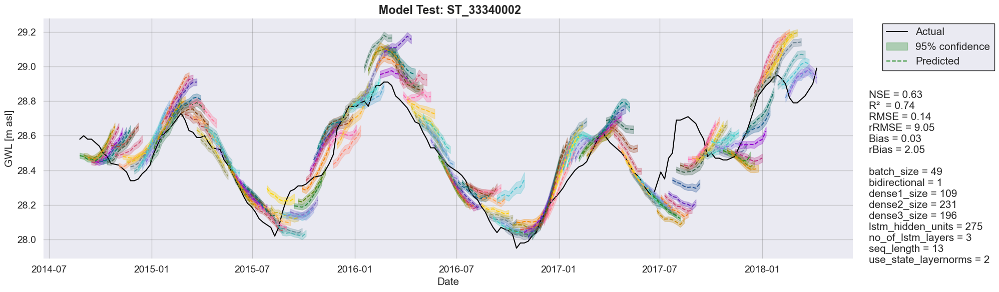

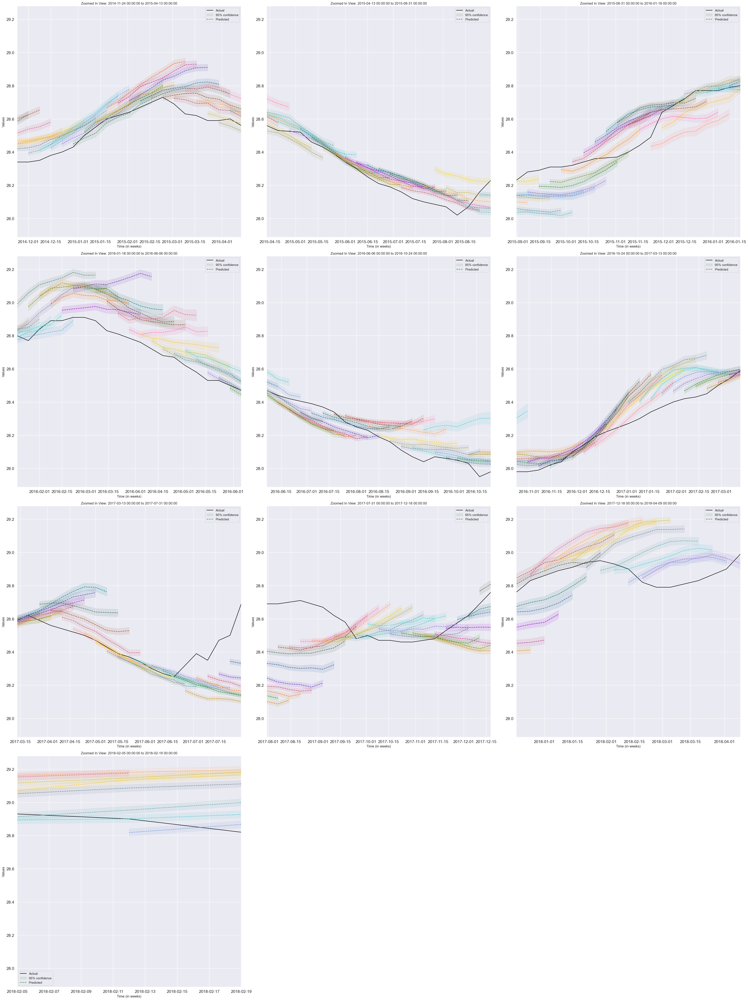

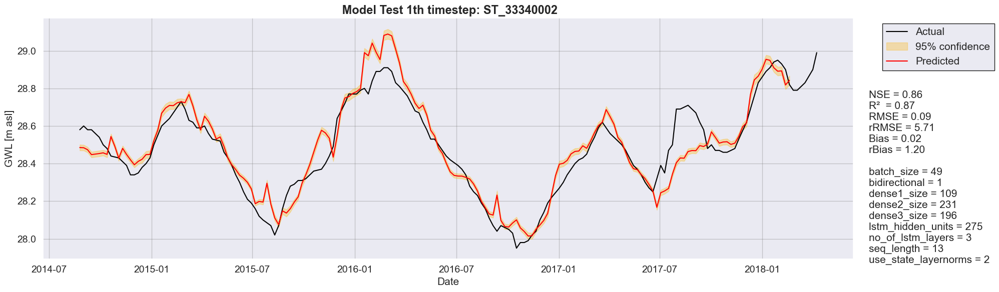

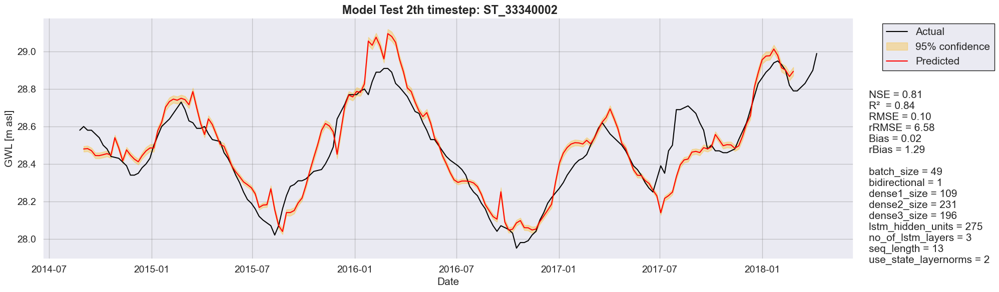

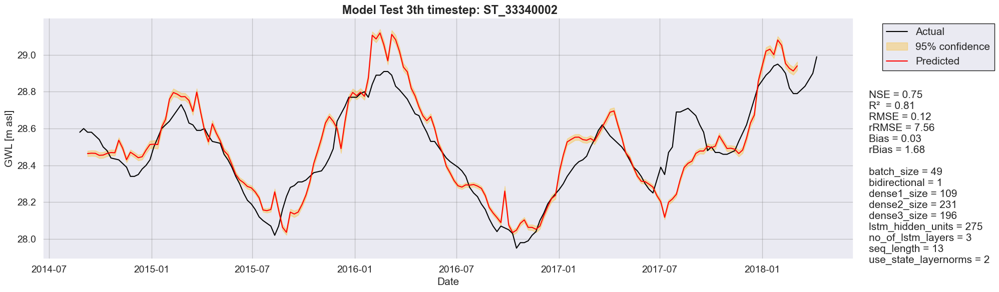

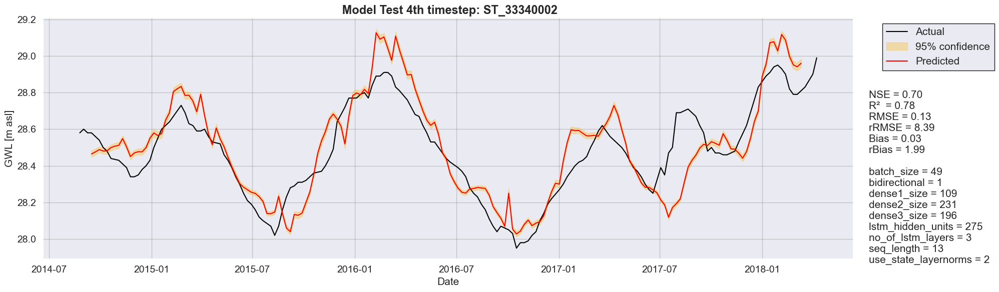

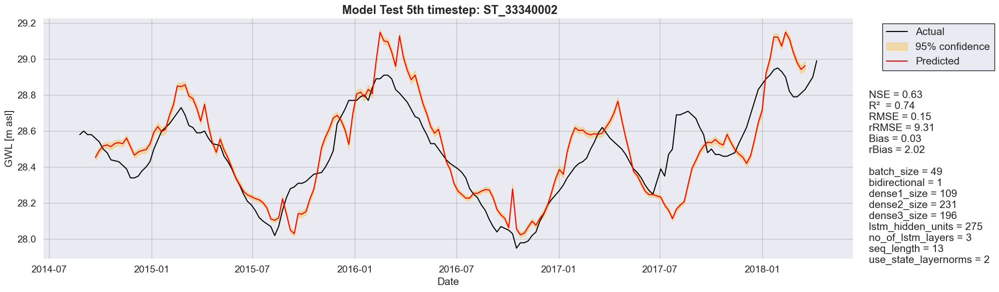

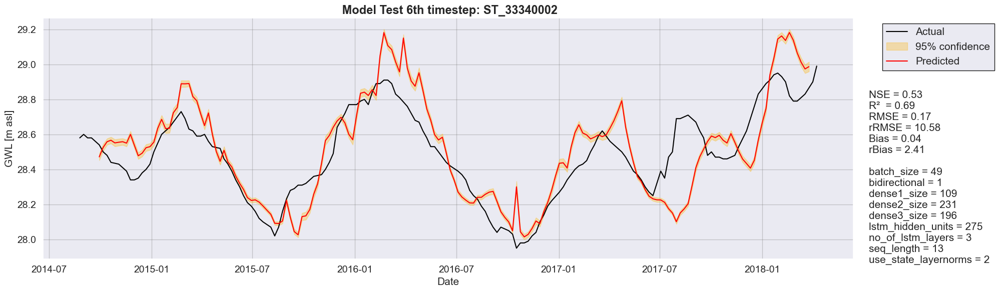

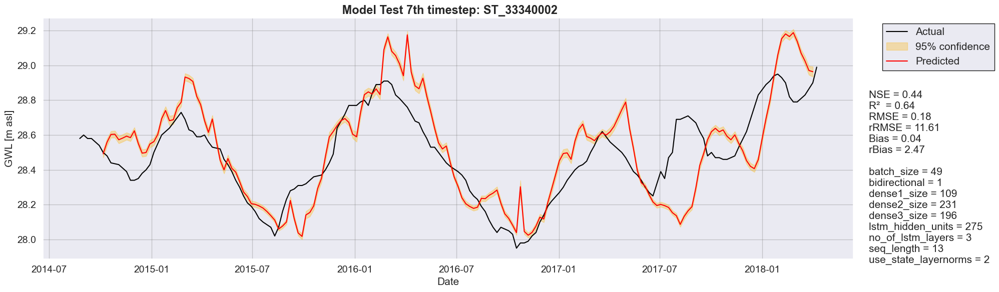

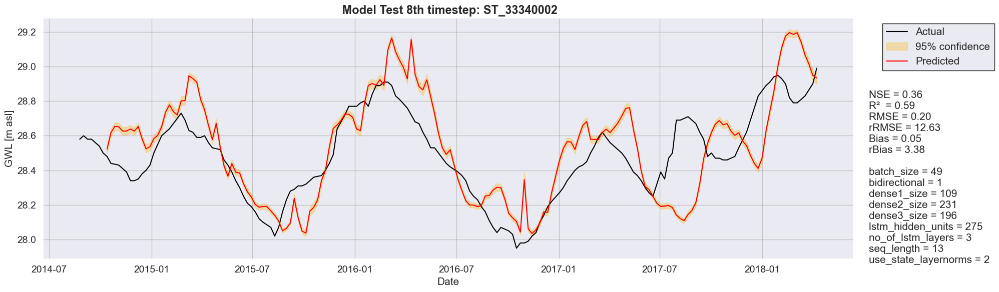

Total time for well of well_no 110 = 0:35:16.974390
Total time for all wells= 0:35:16.980858
(target_well_no:83) BayesOpt-Iteration 1 - ini-Ensemblemember 1


epoch/MAE,█▅▅▄▄▄▄▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁
epoch/MSE,█▄▄▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▅▅▆▆▆▇▇▇▇▇███████████
epoch/RMSE,█▅▅▄▄▄▃▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▂▃▃▃▄▄▄▅▅▅▆▆▆▇▇▇██
epoch/learning_rate,█████▄▄▄▄▄▄▂▂▂▂▂▁▁▁▁▁▁
epoch/loss,█▄▄▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▃█▄▅▃▃▁▃▂▃▃▅▄▄▃▄▄▄▄▄▄▅
epoch/val_MSE,▃█▅▆▃▅▁▃▂▃▃▆▅▅▄▅▅▅▅▅▅▅
epoch/val_NSE,▇▁▄▃▆▄█▆▇▆▆▃▄▄▅▄▄▄▄▄▄▄
epoch/val_RMSE,▃█▅▆▃▅▁▃▂▃▃▆▅▅▄▅▅▅▅▅▅▅


wandb: WARNING Path /home/ishan/Projects/Groundwater Project/Phase 1 work/well_results_B_results/well_83_NW_129660176/optSt_True/prdL_8/exFts_False_GWLinc_True____2024_10_31__20_56_48__225386/wandb__/wandb/ wasn't writable, using system temp directory.


5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step
total elapsed time = 0:35:44.522871
(target_well_no = 83) elapsed time = 0:00:27.542955
(target_well_no:83) BayesOpt-Iteration 2 - ini-Ensemblemember 1


epoch/MAE,█▄▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/MSE,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▇▇▇▇████████████
epoch/RMSE,█▄▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▃▄▄▅▅▆▆▆▇▇██
epoch/learning_rate,███████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,█▃▁▁▂▂▁▂▂▃▂▃▃▃▃▃▄▄
epoch/val_MSE,█▂▁▁▂▂▂▃▃▄▃▄▃▄▅▅▅▆
epoch/val_NSE,▁▇██▇▇▇▆▆▅▆▅▆▅▄▄▄▃
epoch/val_RMSE,█▂▁▁▂▂▂▃▃▄▃▄▄▄▅▅▆▆


5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 143ms/step
total elapsed time = 0:36:13.093300
(target_well_no = 83) elapsed time = 0:00:56.112833
(target_well_no:83) BayesOpt-Iteration 3 - ini-Ensemblemember 1


epoch/MAE,█▄▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
epoch/MSE,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▇▇▇▇██████████████
epoch/RMSE,█▄▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
epoch/learning_rate,█████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,█▄▂▁▁▁▂▃▄▄▃▃▃▃▃▃▃▄▃▃
epoch/val_MSE,█▄▁▁▁▁▂▃▄▄▄▃▄▄▄▄▃▅▄▄
epoch/val_NSE,▁▅████▇▆▅▅▅▆▅▅▅▅▆▄▅▅
epoch/val_RMSE,█▄▁▁▁▁▂▃▄▄▄▄▅▄▄▄▃▅▄▅


5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step
total elapsed time = 0:36:53.098171
(target_well_no = 83) elapsed time = 0:01:36.117762
(target_well_no:83) BayesOpt-Iteration 4 - ini-Ensemblemember 1


epoch/MAE,█▆▅▄▄▃▃▂▂▂▂▁▁▁▁▁
epoch/MSE,█▅▄▃▃▂▂▂▁▁▁▁▁▁▁▁
epoch/NSE,▁▄▅▆▆▇▇▇████████
epoch/RMSE,█▆▅▄▄▃▃▂▂▂▂▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▄▄▅▅▆▆▇▇██
epoch/learning_rate,█████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▅▄▃▃▂▂▂▁▁▁▁▁▁▁▁
epoch/val_MAE,▁▅▃▄▂▇▇▆▇▆█▇▇▇▇▇
epoch/val_MSE,▁▃▃▄▂▆▆▆▇▆█▇▇▇▇▇
epoch/val_NSE,█▆▆▅▇▃▃▃▂▃▁▂▂▂▂▂
epoch/val_RMSE,▁▄▃▄▃▆▇▆▇▆█▇▇▇▇▇


5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step
total elapsed time = 0:37:44.171596
(target_well_no = 83) elapsed time = 0:02:27.191153
(target_well_no:83) BayesOpt-Iteration 5 - ini-Ensemblemember 1


epoch/MAE,█▆▅▄▄▃▃▂▂▂▁▁▁▁▁▁▁▁
epoch/MSE,█▅▄▃▃▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▄▅▆▆▇▇▇██████████
epoch/RMSE,█▆▅▄▄▃▃▂▂▂▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▃▄▄▅▅▆▆▆▇▇██
epoch/learning_rate,███████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▅▄▃▃▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,█▄▁▅▅▃▇▄▂▂▄▂▄▄▄▃▄▃
epoch/val_MSE,▆▃▁▄█▅█▆▅▄▆▅▅▅▅▅▆▅
epoch/val_NSE,▃▆█▅▁▄▁▃▄▅▃▄▄▄▄▄▃▄
epoch/val_RMSE,▆▃▁▄█▆█▇▅▅▆▅▆▅▆▅▆▅


5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 121ms/step
total elapsed time = 0:38:31.407557
(target_well_no = 83) elapsed time = 0:03:14.427140
(target_well_no:83) BayesOpt-Iteration 6 - ini-Ensemblemember 1


epoch/MAE,█▄▄▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/MSE,█▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▆▇▇▇▇▇▇█████████████████████████
epoch/RMSE,█▄▄▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▁▂▂▂▂▂▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▇▇▇▇▇███
epoch/learning_rate,███████████████▄▄▄▄▄▄▄▄▂▂▂▂▂▁▁▁▁▁▁
epoch/loss,█▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▇██▆▅▅▅▃▄▅▃▄▄▄▇▄▂▂▁▃▅▅▅▄▃▄▃▄▄▃▃▄▄▄
epoch/val_MSE,▅▅▅▃▃▄▄▂▃▅▂▄▃▄█▄▂▂▁▃▅▄▄▄▃▄▃▄▃▃▃▃▃▄
epoch/val_NSE,▄▄▄▆▆▅▅▇▆▄▇▅▆▅▁▅▇▇█▆▄▅▅▅▆▅▆▅▆▆▆▆▆▅
epoch/val_RMSE,▅▆▅▄▄▄▄▂▃▅▂▄▃▄█▅▂▂▁▃▅▅▄▄▃▄▃▄▃▃▄▄▄▄


5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 196ms/step
total elapsed time = 0:39:05.999906
(target_well_no = 83) elapsed time = 0:03:49.019470
(target_well_no:83) BayesOpt-Iteration 7 - ini-Ensemblemember 1


epoch/MAE,█▄▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
epoch/MSE,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▇▇▇▇████████████████
epoch/RMSE,█▄▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▂▃▃▃▄▄▄▅▅▅▆▆▆▇▇▇██
epoch/learning_rate,███████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,█▅▃▃▂▂▁▁▂▃▃▃▁▂▂▂▂▂▂▃▂▃
epoch/val_MSE,█▃▂▂▂▁▁▁▂▃▃▃▁▂▂▂▂▂▃▃▂▃
epoch/val_NSE,▁▆▇▇▇███▇▆▆▆█▇▇▇▇▇▆▆▇▆
epoch/val_RMSE,█▄▂▂▂▁▁▁▂▃▃▃▁▂▂▂▂▂▃▃▃▃


5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step
total elapsed time = 0:39:31.427205
(target_well_no = 83) elapsed time = 0:04:14.446820
(target_well_no:83) BayesOpt-Iteration 8 - ini-Ensemblemember 1


epoch/MAE,█▄▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁
epoch/MSE,█▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▇▇▇▇▇▇███████████
epoch/RMSE,█▄▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▃▄▄▅▅▅▆▆▆▇▇██
epoch/learning_rate,████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▅▃▁▂▂▁▁▅▇▇▆▇██▆▅▄▆▆
epoch/val_MSE,▂▁▁▁▁▂▂▅▆▆▆▇██▇▇▇▇▇
epoch/val_NSE,▇████▇▇▄▃▃▃▂▁▁▂▂▂▂▂
epoch/val_RMSE,▂▂▁▁▁▂▂▅▆▆▆▇██▇▇▇▇█


5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step
total elapsed time = 0:40:11.509431
(target_well_no = 83) elapsed time = 0:04:54.529023
(target_well_no:83) BayesOpt-Iteration 9 - ini-Ensemblemember 1


epoch/MAE,█▅▄▄▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/MSE,█▃▃▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▆▆▇▇▇███████████████████
epoch/RMSE,█▅▄▄▃▃▃▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▂▂▃▃▃▄▄▄▄▅▅▅▅▆▆▆▇▇▇▇██
epoch/learning_rate,█████▄▄▄▄▄▄▄▄▄▄▂▂▂▂▂▁▁▁▁▁▁
epoch/loss,█▃▃▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▂▄▄▄▂█▄▄▄▃▁▁▂▃▄▂▂▂▂▂▂▂▁▂▂▂
epoch/val_MSE,▁▂▃▄▂█▃▄▄▂▁▁▂▃▅▂▂▂▂▂▂▂▂▂▂▂
epoch/val_NSE,█▇▆▅▇▁▆▅▅▇██▇▆▄▇▇▇▇▇▇▇▇▇▇▇
epoch/val_RMSE,▁▂▄▄▂█▃▄▄▃▁▁▂▃▅▂▂▂▂▂▃▂▂▂▂▂


5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 253ms/step
total elapsed time = 0:41:39.032815
(target_well_no = 83) elapsed time = 0:06:22.052351
(target_well_no:83) BayesOpt-Iteration 10 - ini-Ensemblemember 1


epoch/MAE,█▅▅▄▃▄▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/MSE,█▄▃▃▂▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▅▆▆▇▆▇▇▇███████████████████████████████
epoch/RMSE,█▅▅▄▃▄▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇██
epoch/learning_rate,██████▄▄▄▄▄▄▄▄▄▄▄▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁
epoch/loss,█▄▃▃▂▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▄▄▃▇▆▅█▃▄▃▃▄▂▃▅▄▄▁▃▂▂▁▂▄▂▁▂▃▃▃▃▃▃▂▂▂▂▃▂▂
epoch/val_MSE,▄▃▄▇▆▄█▃▄▃▂▃▂▃▅▅▅▂▃▃▃▁▂▄▂▁▂▃▃▃▂▂▃▃▂▁▂▃▂▃
epoch/val_NSE,▅▆▅▂▃▅▁▆▅▆▇▆▇▆▄▄▄▇▆▆▆█▇▅▇█▇▆▆▆▇▇▆▆▇█▇▆▇▆
epoch/val_RMSE,▅▃▄▇▆▅█▃▅▄▂▃▂▃▅▅▅▂▃▃▃▁▂▄▂▁▂▃▃▃▃▃▃▃▂▁▂▃▂▃


5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 243ms/step
total elapsed time = 0:42:24.576407
(target_well_no = 83) elapsed time = 0:07:07.596062
(target_well_no:83) BayesOpt-Iteration 11 - ini-Ensemblemember 1


epoch/MAE,█▄▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁
epoch/MSE,█▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▇▇▇▇▇██████████████
epoch/RMSE,█▄▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▂▃▃▃▄▄▅▅▅▆▆▆▇▇▇██
epoch/learning_rate,██████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▅▄▃▃▃▁▃▅▆█▁▂▃▃▄▅▄▃▄▄▃
epoch/val_MSE,▃▃▂▂▂▁▃▅▆█▂▃▄▃▅▆▄▄▄▅▄
epoch/val_NSE,▆▆▇▇▇█▆▄▃▁▇▆▅▆▄▃▅▅▅▄▅
epoch/val_RMSE,▃▃▂▂▂▁▄▆▆█▂▃▄▃▅▆▅▄▅▅▄


5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 188ms/step
total elapsed time = 0:43:14.431596
(target_well_no = 83) elapsed time = 0:07:57.451211
(target_well_no:83) BayesOpt-Iteration 12 - ini-Ensemblemember 1


epoch/MAE,█▅▄▄▃▃▃▃▂▂▂▂▁▁▁▁▁▁
epoch/MSE,█▄▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▅▆▆▇▇▇▇▇█████████
epoch/RMSE,█▅▄▄▃▃▃▃▂▂▂▂▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▃▄▄▅▅▆▆▆▇▇██
epoch/learning_rate,███████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▄▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▃▆▁▃▆▇▆▅██▆▅▇▆▆▇▇▇
epoch/val_MSE,▂▄▁▃▅▄▄▄▇▇▆▆▇▆▇███
epoch/val_NSE,▇▅█▆▄▅▅▅▂▂▃▃▂▃▂▁▁▁
epoch/val_RMSE,▂▄▁▃▅▅▄▅▇▇▆▆▇▆▇███


5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 121ms/step
total elapsed time = 0:43:46.376921
(target_well_no = 83) elapsed time = 0:08:29.396510
(target_well_no:83) BayesOpt-Iteration 13 - ini-Ensemblemember 1


epoch/MAE,█▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
epoch/MSE,█▃▂▂▂▂▂▂▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▇▇▇▇▇▇▇▇▇▇▇▇▇█▇██████████████
epoch/RMSE,█▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▇▇▇▇███
epoch/learning_rate,████████████████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▂▂▂▂▂▂▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,█▆▇▆▄▅▄▆▆▃▄▄▅▅▂▁▇▃▂▄▁▂▃▂▃▃▃▄▃▃▃
epoch/val_MSE,▇▅▆▅▃▄▃▆▅▃▄▃▄▄▂▁█▃▃▅▂▃▄▃▅▄▅▆▄▅▆
epoch/val_NSE,▂▄▃▄▆▅▆▃▄▆▅▆▅▅▇█▁▆▆▄▇▆▅▆▄▅▄▃▅▄▃
epoch/val_RMSE,▇▅▆▅▃▅▃▆▅▃▄▄▄▄▂▁█▃▃▅▂▃▄▃▅▅▅▆▄▅▆


5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 142ms/step
total elapsed time = 0:44:36.750668
(target_well_no = 83) elapsed time = 0:09:19.770340
(target_well_no:83) BayesOpt-Iteration 14 - ini-Ensemblemember 1


epoch/MAE,█▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/MSE,█▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▆▇▇▇▇▇▇████████████████████████████
epoch/RMSE,█▅▄▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇███
epoch/learning_rate,████████████████▄▄▄▄▄▄▄▄▄▄▂▂▂▂▂▁▁▁▁▁▁
epoch/loss,█▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▇█▇▇▇▆▅▄▄▅▄▂▄▃▄▄▃▂▂▃▂▁▁▂▂▃▃▁▃▂▂▂▂▂▂▂▂
epoch/val_MSE,██▇▇▇▆▅▃▅▇▅▂▅▃▇▇▃▂▂▄▃▁▂▂▃▃▅▁▄▃▃▃▃▃▃▃▃
epoch/val_NSE,▁▁▂▂▂▃▄▆▄▂▄▇▄▆▂▂▆▇▇▅▆█▇▇▆▆▄█▅▆▆▆▆▆▆▆▆
epoch/val_RMSE,██▇▇▇▆▅▃▅▇▅▂▅▃▇▇▄▂▂▄▃▁▂▂▃▃▅▁▄▃▃▃▃▃▃▃▃


5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 136ms/step
total elapsed time = 0:45:06.862998
(target_well_no = 83) elapsed time = 0:09:49.882575
(target_well_no:83) BayesOpt-Iteration 15 - ini-Ensemblemember 1


epoch/MAE,█▅▄▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/MSE,█▄▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▅▆▆▇▇▇▇▇▇▇▇██████████████████████
epoch/RMSE,█▅▄▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▁▂▂▂▂▂▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▇▇▇▇▇███
epoch/learning_rate,███████████████████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▄▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,█▅▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▁▂▂▁▁▂
epoch/val_MSE,█▄▃▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▂▁▁▁▁▂▁▂▁▁▁▂
epoch/val_NSE,▁▅▆▇▇▇▇▇█▇████████████▇████▇█▇███▇
epoch/val_RMSE,█▅▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▂▁▂▂▁▂▂▂▂▁▂▂


5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 196ms/step
total elapsed time = 0:45:45.349171
(target_well_no = 83) elapsed time = 0:10:28.368744
(target_well_no:83) BayesOpt-Iteration 16 - ini-Ensemblemember 1


epoch/MAE,█▄▃▃▃▂▂▂▂▂▂▂▂▁▂▂▂▂▁▁▁▁▁
epoch/MSE,█▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▇▇▇▇▇▇▇▇█████████████
epoch/RMSE,█▄▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁
epoch/epoch,▁▁▂▂▂▃▃▃▄▄▄▅▅▅▅▆▆▆▇▇▇██
epoch/learning_rate,████████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,██▇▆▅▂▂▁▄▂▃▃▅▇█▆▆▃▅▇▅▅▆
epoch/val_MSE,▄▆▇▄▃▂▂▁▄▂▃▄▅▇█▇█▄▅▇▇▇▇
epoch/val_NSE,▅▃▂▅▆▇▇█▅▇▆▅▄▂▁▂▁▅▄▂▂▂▂
epoch/val_RMSE,▄▆▇▄▄▂▂▁▄▂▃▄▅▇█▇█▄▅▇▇▇▇


5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 114ms/step
total elapsed time = 0:46:16.432085
(target_well_no = 83) elapsed time = 0:10:59.451700
(target_well_no:83) BayesOpt-Iteration 17 - ini-Ensemblemember 1


epoch/MAE,█▅▄▄▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁
epoch/MSE,█▄▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁
epoch/NSE,▁▅▆▆▆▇▇▇▇▇▇▇▇███████
epoch/RMSE,█▄▄▄▃▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁
epoch/epoch,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
epoch/learning_rate,█████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▄▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁
epoch/val_MAE,█▅▆▆▃▃▅▅▆▇▃▂▁▂▁▂▄▄▃▄
epoch/val_MSE,▇▃▄▄▁▃▄▄▆█▄▁▁▂▂▄▅▅▅▆
epoch/val_NSE,▂▆▅▆█▆▅▅▃▁▅██▇▇▅▄▄▄▃
epoch/val_RMSE,▇▃▄▄▁▃▅▄▆█▄▁▁▂▂▄▅▅▅▆


5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step
total elapsed time = 0:46:55.027847
(target_well_no = 83) elapsed time = 0:11:38.047237
(target_well_no:83) BayesOpt-Iteration 18 - ini-Ensemblemember 1


epoch/MAE,█▄▃▃▃▂▂▂▂▂▁▁▁▁▁▁
epoch/MSE,█▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▆▇▇▇▇▇████████
epoch/RMSE,█▄▃▃▃▂▂▂▂▂▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▄▄▅▅▆▆▇▇██
epoch/learning_rate,█████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁
epoch/val_MAE,▁▅▄▅▃▄▇▄▃▄▃▇▆▇▆█
epoch/val_MSE,▁▄▅▄▄▅▇▅▅▆▅▇▇▇▆█
epoch/val_NSE,█▅▄▅▅▄▂▄▄▃▄▂▂▂▃▁
epoch/val_RMSE,▁▄▅▅▄▆▇▆▅▆▅▇▇▇▆█


5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step
total elapsed time = 0:47:41.838505
(target_well_no = 83) elapsed time = 0:12:24.858065
(target_well_no:83) BayesOpt-Iteration 19 - ini-Ensemblemember 1


epoch/MAE,█▅▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
epoch/MSE,█▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▆▆▆▇▇▇▇▇▇████████████████
epoch/RMSE,█▅▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▂▂▃▃▃▃▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇██
epoch/learning_rate,████████▄▄▄▄▄▄▄▄▂▂▂▂▂▁▁▁▁▁▁
epoch/loss,█▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▆▇▄▃▄▅▄█▁▃▂▁▃▄▅▃▂▄▃▃▄▄▄▃▃▃▃
epoch/val_MSE,▆█▂▂▃▅▄█▂▂▂▁▃▅▇▃▃▄▄▅▆▆▆▅▅▅▅
epoch/val_NSE,▃▁▇▇▆▄▅▁▇▇▇█▆▄▂▆▆▅▅▄▃▃▃▄▄▄▄
epoch/val_RMSE,▆█▂▂▃▅▄█▂▂▂▁▄▅█▃▃▅▄▅▆▆▇▅▅▅▅


5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step
total elapsed time = 0:48:23.102889
(target_well_no = 83) elapsed time = 0:13:06.122522
(target_well_no:83) BayesOpt-Iteration 20 - ini-Ensemblemember 1


epoch/MAE,█▆▅▄▄▃▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/MSE,█▄▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▅▆▆▆▇▇▇▇▇▇▇█████████████████
epoch/RMSE,█▅▅▄▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▁▂▂▂▃▃▃▃▃▄▄▄▅▅▅▅▅▆▆▆▇▇▇▇▇██
epoch/learning_rate,██████████████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▄▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,█▇▆▅▄▂▂▂▂▂▁▁▁▁▂▃▄▃▄▂▃▂▂▃▃▂▃▃▃
epoch/val_MSE,█▆▅▄▃▂▂▂▂▂▁▁▁▁▂▂▄▃▄▂▂▂▂▂▃▂▂▂▂
epoch/val_NSE,▁▃▄▅▆▇▇▇▇▇████▇▇▅▆▅▇▇▇▇▇▆▇▇▇▇
epoch/val_RMSE,█▆▅▅▃▂▂▂▂▂▁▁▁▁▂▃▄▃▄▂▃▃▂▃▃▃▃▃▃


5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 138ms/step
total elapsed time = 0:48:50.969153
(target_well_no = 83) elapsed time = 0:13:33.988585
Phase 1 :- random exploration ; of bayesian optimization on well 83, done. 


beststep 19, current step 21
(target_well_no:83) BayesOpt-Iteration 21 - ini-Ensemblemember 1


epoch/MAE,█▄▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
epoch/MSE,█▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▇▇▇▇▇▇▇▇██████████████
epoch/RMSE,█▄▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▂▃▃▃▃▄▄▄▅▅▅▆▆▆▆▇▇▇██
epoch/learning_rate,█████████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,█▆▄▃▃▃▂▁▁▂▂▄▃▃▃▃▃▃▃▄▃▄▃▃
epoch/val_MSE,█▄▃▂▂▂▂▁▁▂▂▃▃▂▃▃▃▃▃▄▃▄▄▄
epoch/val_NSE,▁▅▆▇▇▇▇██▇▇▆▆▇▆▆▆▆▆▅▆▅▅▅
epoch/val_RMSE,█▅▄▂▂▂▂▁▁▂▂▃▄▃▃▄▃▄▃▄▃▄▄▄


5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 144ms/step
total elapsed time = 0:49:30.000688
(target_well_no = 83) elapsed time = 0:14:13.020124

beststep 21, current step 22
(target_well_no:83) BayesOpt-Iteration 22 - ini-Ensemblemember 1


epoch/MAE,█▄▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/MSE,█▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▇▇▇▇▇█████████████████████████
epoch/RMSE,█▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▇▇▇▇███
epoch/learning_rate,██████████████▄▄▄▄▄▄▂▂▂▂▂▁▁▁▁▁▁
epoch/loss,█▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,█▅▃▃▂▂▃▂▁▁▂▂▃▂▁▁▁▁▁▁▂▁▂▁▁▁▁▁▁▁▁
epoch/val_MSE,█▄▂▂▁▂▂▂▁▁▂▁▂▂▁▁▁▁▁▁▂▁▂▁▁▁▁▁▁▁▁
epoch/val_NSE,▁▅▇▇█▇▇▇██▇█▇▇██████▇█▇████████
epoch/val_RMSE,█▄▂▂▂▂▂▂▁▁▂▁▃▂▁▁▁▁▁▁▂▁▂▁▁▁▁▂▂▂▂


5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 89ms/step
total elapsed time = 0:49:55.336248
(target_well_no = 83) elapsed time = 0:14:38.356120

beststep 21, current step 23
(target_well_no:83) BayesOpt-Iteration 23 - ini-Ensemblemember 1


epoch/MAE,█▄▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁
epoch/MSE,█▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▇▇▇▇▇████████████
epoch/RMSE,█▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▃▄▄▅▅▆▆▆▇▇██
epoch/learning_rate,███████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,█▅▁▁▁▂▁▁▃▄▄▄▄▅▅▅▅▅
epoch/val_MSE,▇▄▁▂▁▂▃▃▄▆▅▆▆█▇▇██
epoch/val_NSE,▂▅█▇█▇▆▆▅▃▄▃▃▁▂▂▁▁
epoch/val_RMSE,▇▄▁▂▁▂▃▃▄▆▆▆▆█▇▇██


5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 117ms/step
total elapsed time = 0:50:23.574155
(target_well_no = 83) elapsed time = 0:15:06.593707

beststep 21, current step 24
(target_well_no:83) BayesOpt-Iteration 24 - ini-Ensemblemember 1


epoch/MAE,█▅▄▄▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
epoch/MSE,█▄▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▅▆▆▇▇▇▇█████████████
epoch/RMSE,█▅▄▄▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▂▃▃▃▄▄▅▅▅▆▆▆▇▇▇██
epoch/learning_rate,██████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▄▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,█▆▅▄▂▁▃▅▄▃▄▄▄▅▄▄▄▄▄▅▅
epoch/val_MSE,█▅▃▂▂▁▂▃▃▂▂▃▃▄▃▄▃▃▄▄▄
epoch/val_NSE,▁▄▆▇▇█▇▆▆▇▆▆▆▅▆▅▆▆▅▅▅
epoch/val_RMSE,█▆▃▂▂▁▂▃▃▃▃▃▃▄▄▄▃▄▄▄▄


5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 200ms/step
total elapsed time = 0:51:21.356022
(target_well_no = 83) elapsed time = 0:16:04.375702

beststep 21, current step 25
(target_well_no:83) BayesOpt-Iteration 25 - ini-Ensemblemember 1


epoch/MAE,█▄▄▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/MSE,█▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▆▇▇▇▇▇████████████████████
epoch/RMSE,█▄▄▃▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇██
epoch/learning_rate,████████▄▄▄▄▄▄▄▄▄▂▂▂▂▂▁▁▁▁▁▁
epoch/loss,█▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▇█▇▂▅▄▇▃▄▂▂▂▁▁▃▂▂▁▂▁▁▂▃▃▂▃▂▂
epoch/val_MSE,▇▆▄▁▅▅█▃▃▂▂▂▁▁▃▂▂▁▂▂▁▂▃▂▂▃▂▂
epoch/val_NSE,▂▃▅█▄▄▁▆▆▇▇▇██▆▇▇█▇▇█▇▆▇▇▆▇▇
epoch/val_RMSE,▇▆▄▁▅▅█▄▄▂▂▂▁▁▃▂▂▁▂▂▁▂▃▂▂▃▂▂


5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step
total elapsed time = 0:52:01.007614
(target_well_no = 83) elapsed time = 0:16:44.027212

beststep 21, current step 26
(target_well_no:83) BayesOpt-Iteration 26 - ini-Ensemblemember 1


epoch/MAE,█▅▄▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁
epoch/MSE,█▄▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▅▆▇▇▇▇▇██████████
epoch/RMSE,█▅▄▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▃▄▄▅▅▆▆▆▇▇██
epoch/learning_rate,███████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▄▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,██▁▃▂▅▄▇▄▄▃▄▂▁▂▁▁▁
epoch/val_MSE,▄▄▁▃▂▄▅█▄▃▃▄▂▂▂▂▂▂
epoch/val_NSE,▅▅█▆▇▅▄▁▅▆▆▅▇▇▇▇▇▇
epoch/val_RMSE,▅▄▁▃▂▄▅█▄▃▃▄▂▂▂▂▂▂


5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step
total elapsed time = 0:52:24.773689
(target_well_no = 83) elapsed time = 0:17:07.793407

beststep 21, current step 27
(target_well_no:83) BayesOpt-Iteration 27 - ini-Ensemblemember 1


epoch/MAE,█▄▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/MSE,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▇▇▇▇██████████████
epoch/RMSE,█▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
epoch/learning_rate,█████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▄█▄▃▂▄▃▄▅▇▁▄▄▂▂▂▃▄▃▃
epoch/val_MSE,▅▇▄▃▁▃▄▅▅█▂▅▅▄▄▄▅▆▆▅
epoch/val_NSE,▄▂▅▆█▆▅▄▄▁▇▄▄▅▅▅▄▃▃▄
epoch/val_RMSE,▅▇▄▃▁▃▄▅▅█▃▅▅▄▄▄▅▆▆▅


5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 252ms/step
total elapsed time = 0:53:26.900676
(target_well_no = 83) elapsed time = 0:18:09.920319

beststep 21, current step 28
(target_well_no:83) BayesOpt-Iteration 28 - ini-Ensemblemember 1


epoch/MAE,█▄▃▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/MSE,█▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▇▇▇▇▇█████████████████████████
epoch/RMSE,█▄▃▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▇▇▇▇███
epoch/learning_rate,████████████████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▆█▇█▇█▆▆▄▄▃▂▂▃▆▁▃▂▃▃▂▃▄▃▂▂▃▂▃▃▂
epoch/val_MSE,▆▇▆█▇█▆▇▅▄▄▃▂▃▆▁▃▂▃▃▃▄▄▃▃▃▃▃▄▄▃
epoch/val_NSE,▃▂▃▁▂▁▃▂▄▅▅▆▇▆▃█▆▇▆▆▆▅▅▆▆▆▆▆▅▅▆
epoch/val_RMSE,▇▇▆█▇█▆▇▅▅▄▃▂▃▇▁▄▃▃▄▃▄▅▄▃▃▄▃▄▄▃


5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step
total elapsed time = 0:54:21.637736
(target_well_no = 83) elapsed time = 0:19:04.657381

beststep 21, current step 29
(target_well_no:83) BayesOpt-Iteration 29 - ini-Ensemblemember 1


epoch/MAE,█▅▄▃▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/MSE,█▄▃▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▅▆▆▆▆▇▇▇▇▇▇▇███████████
epoch/RMSE,█▅▄▄▃▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▂▃▃▃▃▄▄▄▅▅▅▆▆▆▆▇▇▇██
epoch/learning_rate,██████▄▄▄▄▄▄▄▂▂▂▂▂▁▁▁▁▁▁
epoch/loss,█▄▃▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,█▃▄▅▄▃▄▃▂▂▃▃▄▃▁▃▂▂▃▂▂▃▃▃
epoch/val_MSE,█▃▄▆▄▃▃▁▁▂▂▃▃▄▁▃▁▂▃▂▂▄▃▄
epoch/val_NSE,▁▆▅▃▅▆▆██▇▇▆▆▅█▆█▇▆▇▇▅▆▅
epoch/val_RMSE,█▃▅▆▅▃▄▁▁▂▂▃▃▄▁▃▁▂▃▂▂▄▃▄


5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step
total elapsed time = 0:55:01.040347
(target_well_no = 83) elapsed time = 0:19:44.059953

beststep 21, current step 30
(target_well_no:83) BayesOpt-Iteration 30 - ini-Ensemblemember 1


epoch/MAE,█▆▄▄▄▃▃▂▂▂▂▂▁▁▁▁▁
epoch/MSE,█▄▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁
epoch/NSE,▁▅▆▆▆▇▇▇▇▇▇██████
epoch/RMSE,█▅▄▄▄▃▃▃▂▂▂▂▂▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▄▄▅▅▅▆▆▇▇██
epoch/learning_rate,██████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▄▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁
epoch/val_MAE,█▃▃▅▃▅▄▄▂▁▂▅▇▅▅▄▅
epoch/val_MSE,▅▁▂▄▄▆▅▆▄▄▅▇█▇▇▇█
epoch/val_NSE,▄█▇▅▅▃▄▃▅▅▄▂▁▂▂▂▁
epoch/val_RMSE,▆▁▂▄▄▆▅▆▄▄▅▇█▇▇▇█


5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 117ms/step
total elapsed time = 0:55:40.239248
(target_well_no = 83) elapsed time = 0:20:23.258887

beststep 21, current step 31
(target_well_no:83) BayesOpt-Iteration 31 - ini-Ensemblemember 1


epoch/MAE,█▅▅▄▄▄▃▃▃▃▃▂▂▂▂▁▁▁▁▁▁
epoch/MSE,█▄▃▃▃▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▅▆▆▆▆▆▇▇▇▇██████████
epoch/RMSE,█▅▄▄▄▄▄▃▃▃▃▂▂▂▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▂▃▃▃▄▄▅▅▅▆▆▆▇▇▇██
epoch/learning_rate,██████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▄▃▃▃▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,█▅▃▂▃▂▂▂▂▁▁▃▄▄▄▃▂▂▂▂▂
epoch/val_MSE,█▃▁▁▂▁▂▃▃▃▂▄▄▄▄▃▂▃▁▂▂
epoch/val_NSE,▁▆██▇█▇▆▆▆▇▅▅▅▅▆▇▆▇▇▇
epoch/val_RMSE,█▃▁▁▂▁▂▃▄▃▂▄▅▄▄▃▂▃▂▂▂


5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 197ms/step
total elapsed time = 0:56:54.422358
(target_well_no = 83) elapsed time = 0:21:37.441875
Phase 2 :- bayesian exploration ; of bayesian optimization on well 83, done. 


beststep 21, current step 32
(target_well_no:83) BayesOpt-Iteration 32 - ini-Ensemblemember 1


epoch/MAE,█▄▃▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁
epoch/MSE,█▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▇▇▇▇▇▇██████████
epoch/RMSE,█▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▃▄▄▅▅▆▆▆▇▇██
epoch/learning_rate,███████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▃▃▁▄▄▆▆█▇▆▅▃▆▆▆▆▆█
epoch/val_MSE,▁▂▁▄▄▅▅▇▇▅▅▄▇▆▇▇▇█
epoch/val_NSE,█▇█▅▅▄▄▂▂▄▄▅▂▃▂▂▂▁
epoch/val_RMSE,▁▂▁▄▄▅▆▇▇▆▅▄▇▇▇▇▇█


5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 171ms/step
total elapsed time = 0:57:33.101952
(target_well_no = 83) elapsed time = 0:22:16.121513

beststep 21, current step 33
(target_well_no:83) BayesOpt-Iteration 33 - ini-Ensemblemember 1


epoch/MAE,█▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁
epoch/MSE,█▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▇▇▇▇█████████████
epoch/RMSE,█▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▃▄▄▅▅▆▆▆▇▇██
epoch/learning_rate,███████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,█▄▄▃▅▃▆▂▂▃▃▁▁▄▃▅▅▅
epoch/val_MSE,█▂▁▁▃▃▅▄▄▄▃▁▂▄▃▅▅▄
epoch/val_NSE,▁▇██▆▆▄▅▅▅▆█▇▅▆▄▄▅
epoch/val_RMSE,█▂▁▁▃▃▅▄▄▄▃▁▂▄▄▆▆▅


5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step
total elapsed time = 0:58:58.393274
(target_well_no = 83) elapsed time = 0:23:41.413346

beststep 21, current step 34
(target_well_no:83) BayesOpt-Iteration 34 - ini-Ensemblemember 1


epoch/MAE,█▄▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/MSE,█▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▇▇▇▇▇▇▇██████████████████████████
epoch/RMSE,█▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇███
epoch/learning_rate,█████▄▄▄▄▄▄▄▄▄▄▄▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁
epoch/loss,█▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▄▆█▄▅▅▄▄▃▃▃▃▃▃▄▂▄▂▂▁▄█▅▄▄▄▃▄▄▄▄▅▄▄▄
epoch/val_MSE,▂▃▆▃▃▄▃▃▃▃▂▂▃▃▃▂▄▂▂▁▃█▄▃▄▃▃▃▃▄▃▄▃▄▃
epoch/val_NSE,▇▆▃▆▆▅▆▆▆▆▇▇▆▆▆▇▅▇▇█▆▁▅▆▅▆▆▆▆▅▆▅▆▅▆
epoch/val_RMSE,▃▃▆▄▃▅▃▄▃▃▃▂▃▃▃▂▄▂▂▁▄█▄▃▅▃▃▄▄▄▃▄▄▄▃


5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 242ms/step
total elapsed time = 1:00:01.772970
(target_well_no = 83) elapsed time = 0:24:44.792444

beststep 21, current step 35
(target_well_no:83) BayesOpt-Iteration 35 - ini-Ensemblemember 1


epoch/MAE,█▅▄▄▄▄▃▃▃▂▂▂▁▁▁▁▁▁▁
epoch/MSE,█▄▃▃▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▅▆▆▆▆▇▇▇▇█████████
epoch/RMSE,█▅▄▄▄▄▃▃▃▂▂▂▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▃▄▄▅▅▅▆▆▆▇▇██
epoch/learning_rate,████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▄▃▃▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▇▅▃▁▄▁▅▃▅█▆▆▇████▇█
epoch/val_MSE,▂▂▂▁▄▂▄▂▄▇▅▆▇██████
epoch/val_NSE,▇▇▇█▅▇▅▇▅▂▄▃▂▁▁▁▁▁▁
epoch/val_RMSE,▂▂▂▁▄▂▄▂▄▇▅▆▇██████


5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 114ms/step
total elapsed time = 1:00:31.507097
(target_well_no = 83) elapsed time = 0:25:14.526501

beststep 21, current step 36
(target_well_no:83) BayesOpt-Iteration 36 - ini-Ensemblemember 1


epoch/MAE,█▄▄▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁
epoch/MSE,█▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▆▇▇▇▇▇▇▇██████████
epoch/RMSE,█▄▃▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
epoch/learning_rate,█████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▄▃▃▂▁▂▄▄▂▃▂▃▃▃▂██▅▇█
epoch/val_MSE,▃▂▂▂▁▁▃▃▂▃▃▃▄▃▃██▆▇█
epoch/val_NSE,▆▇▇▇██▆▆▇▆▆▆▅▆▆▁▁▃▂▁
epoch/val_RMSE,▄▂▂▂▁▁▃▄▂▄▃▄▄▄▃██▆▇█


5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 173ms/step
total elapsed time = 1:01:10.202652
(target_well_no = 83) elapsed time = 0:25:53.222251

beststep 21, current step 37
(target_well_no:83) BayesOpt-Iteration 37 - ini-Ensemblemember 1


epoch/MAE,█▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/MSE,█▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▇▇▇███████████████
epoch/RMSE,█▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▃▄▄▅▅▅▆▆▆▇▇██
epoch/learning_rate,████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▆▆█▂▇▃▃▃▃▁▁▁▂▁▁▁▃▃▃
epoch/val_MSE,▇▄█▁▆▄▆█▇▇▇█▇▇█▆▇█▇
epoch/val_NSE,▂▅▁█▃▅▃▁▂▂▂▁▂▂▁▃▂▁▂
epoch/val_RMSE,▇▅█▁▆▄▇█▇▇▇█▇▇█▇▇█▇


5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 256ms/step
total elapsed time = 1:02:22.567596
(target_well_no = 83) elapsed time = 0:27:05.586830

beststep 37, current step 38
(target_well_no:83) BayesOpt-Iteration 38 - ini-Ensemblemember 1


epoch/MAE,█▄▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/MSE,█▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▇▇▇▇▇██████████████████████████████
epoch/RMSE,█▄▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇███
epoch/learning_rate,█████████▄▄▄▄▄▄▄▄▄▄▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁
epoch/loss,█▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▅█▆▅▃▄▄▃▅▄▂▃▂▂▁▂▂▃▄▅▁▃▃▂▃▂▃▃▂▃▂▃▃▃▃▃
epoch/val_MSE,▅█▅▄▃▃▃▃▅▅▂▂▂▂▁▂▂▃▄▅▁▃▂▂▂▂▂▂▂▂▂▂▂▂▃▃
epoch/val_NSE,▄▁▄▅▆▆▆▆▄▄▇▇▇▇█▇▇▆▅▄█▆▇▇▇▇▇▇▇▇▇▇▇▇▆▆
epoch/val_RMSE,▅█▆▅▃▃▄▄▅▅▃▃▃▂▁▂▂▃▄▅▁▃▃▂▃▂▃▃▃▃▂▃▃▃▃▃


5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 94ms/step
total elapsed time = 1:02:49.839171
(target_well_no = 83) elapsed time = 0:27:32.858853

beststep 37, current step 39
(target_well_no:83) BayesOpt-Iteration 39 - ini-Ensemblemember 1


epoch/MAE,█▄▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/MSE,█▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▇▇▇████████████
epoch/RMSE,█▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▄▄▅▅▅▆▆▇▇██
epoch/learning_rate,██████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,█▂▃▅▅▄▂▄▄▂▂▂▃▄▁▄▅
epoch/val_MSE,█▁▃▅▅▅▅▆▆▆▅▆▇█▆██
epoch/val_NSE,▁█▆▄▄▄▄▃▃▃▄▃▂▁▃▁▁
epoch/val_RMSE,█▁▃▅▅▅▅▆▆▆▅▆▇█▆██


5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step
total elapsed time = 1:03:32.869504
(target_well_no = 83) elapsed time = 0:28:15.888905

beststep 37, current step 40
(target_well_no:83) BayesOpt-Iteration 40 - ini-Ensemblemember 1


epoch/MAE,█▅▄▄▄▃▃▃▂▂▂▁▁▁▁▁▁
epoch/MSE,█▄▄▃▃▂▂▂▂▁▁▁▁▁▁▁▁
epoch/NSE,▁▅▅▆▆▇▇▇▇████████
epoch/RMSE,█▅▅▄▄▃▃▃▂▂▂▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▄▄▅▅▅▆▆▇▇██
epoch/learning_rate,██████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▄▄▃▃▂▂▂▂▁▁▁▁▁▁▁▁
epoch/val_MAE,▅▃▃▂▄▄▁▂▆▇█▇▅▄▅▅▅
epoch/val_MSE,▁▁▁▃▆▅▂▁▅▅██▆▅▆▆▅
epoch/val_NSE,███▆▃▄▇▇▄▄▁▁▃▄▃▃▄
epoch/val_RMSE,▁▁▁▃▆▅▂▂▆▅██▆▅▆▆▅


5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 198ms/step
total elapsed time = 1:04:37.129970
(target_well_no = 83) elapsed time = 0:29:20.149628

beststep 37, current step 41
(target_well_no:83) BayesOpt-Iteration 41 - ini-Ensemblemember 1


epoch/MAE,█▅▅▄▄▃▃▂▂▂▁▁▁▁▁▁▁▁
epoch/MSE,█▄▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▅▆▆▇▇▇▇██████████
epoch/RMSE,█▅▅▄▃▃▂▂▂▂▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▃▄▄▅▅▆▆▆▇▇██
epoch/learning_rate,███████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▄▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,█▄▁▁▁▃▂▁▂▂▁▁▂▂▂▂▂▂
epoch/val_MSE,█▄▁▁▁▃▂▁▃▂▁▂▂▃▃▃▃▃
epoch/val_NSE,▁▅███▆▇█▆▇█▇▇▆▆▆▆▆
epoch/val_RMSE,█▄▁▂▁▃▂▁▃▂▂▂▂▃▃▃▃▃


5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step
total elapsed time = 1:05:10.447684
(target_well_no = 83) elapsed time = 0:29:53.467425
Phase 3 :- bayesian exploitation ; of bayesian optimization on well 83, done. 


BEST:	{'target': 1.35943160130086, 'params': {'batch_size': 205.76750882249735, 'bidirectional': 0.9854926544750426, 'dense1_size': 200.81649332442308, 'dense2_size': 210.66711667659382, 'dense3_size': 206.6772063106259, 'lstm_hidden_units': 270.0623419212498, 'no_of_lstm_layers': 4.730887454499187, 'seq_length': 44.18504103879826, 'use_state_layernorms': 0.6978209416712112}}
0th sim_test trial, on best model, for well 83 done
1th sim_test trial, on best model, for well 83 done
2th sim_test trial, on best model, for well 83 done
3th sim_test trial, on best model, for well 83 done
Overall performance 
--------------------------------

        NSE        R2      RMSE     rRMSE      Bias     rBias
0  0.776388  0.805822  4.991879  9.232252  1.988326  3.677319


Timestep wise performance

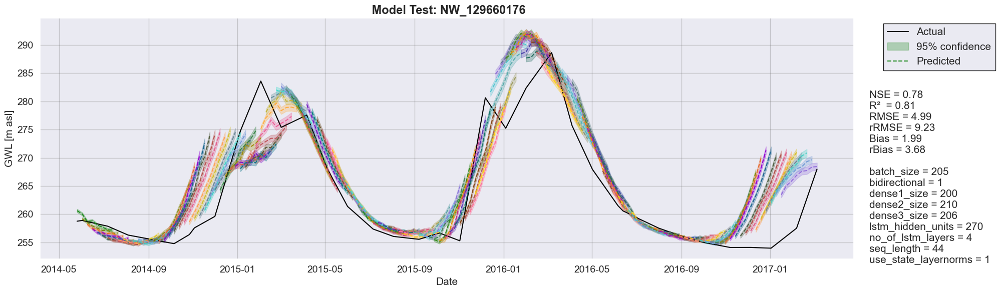

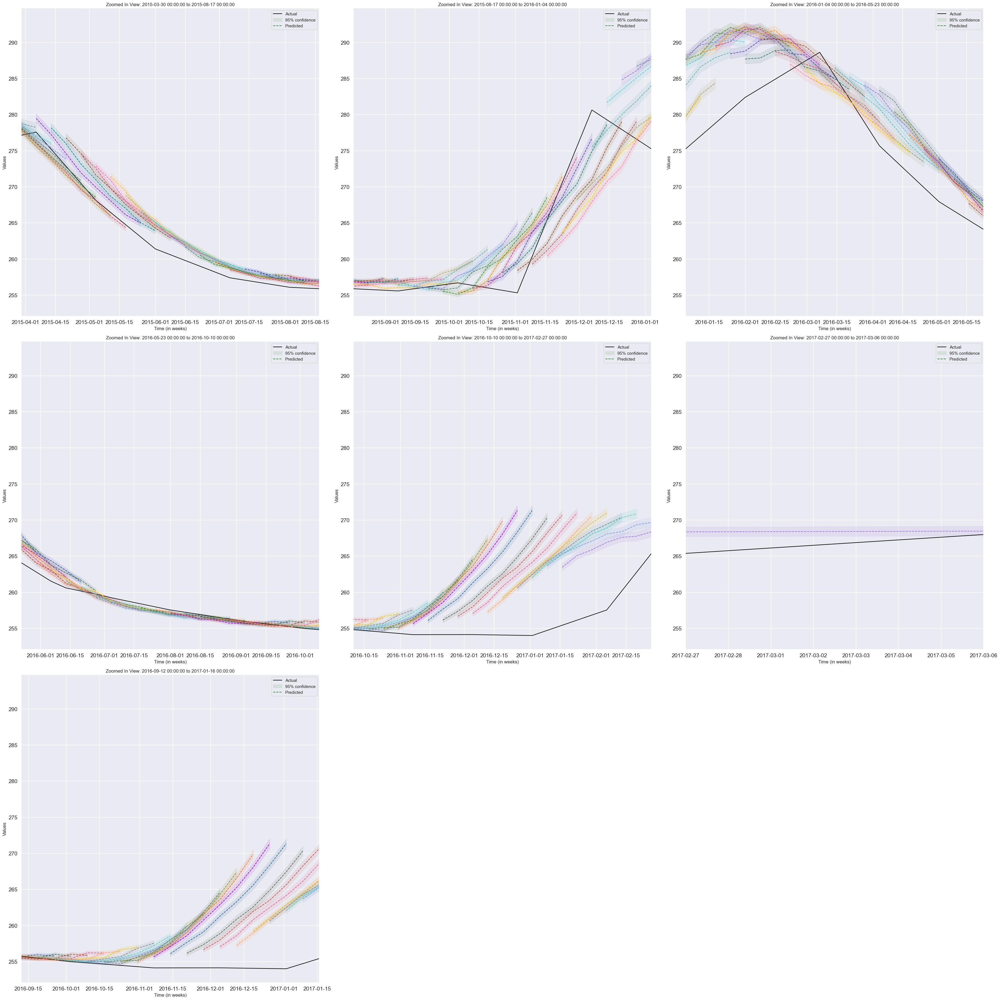

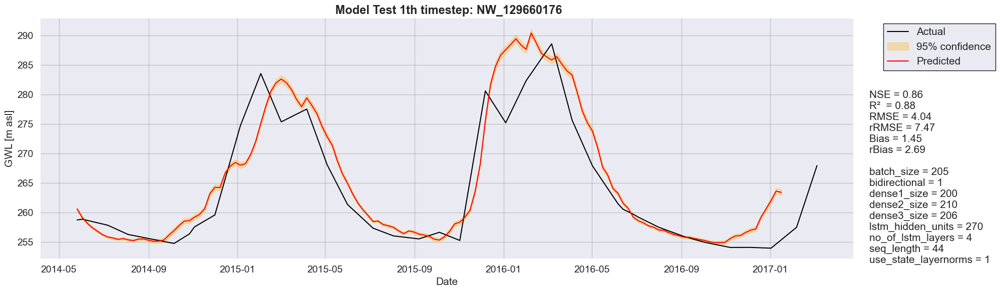

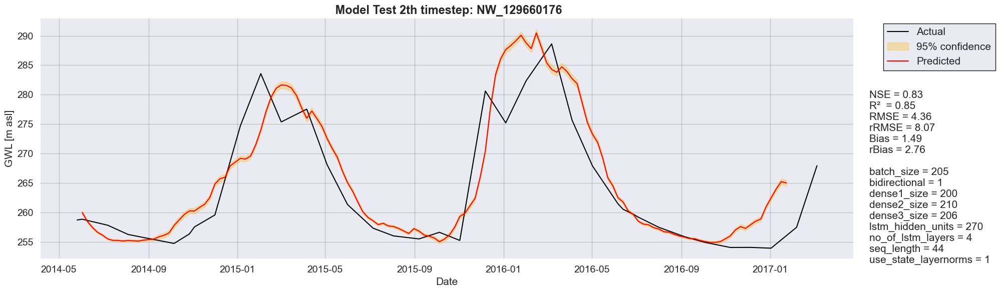

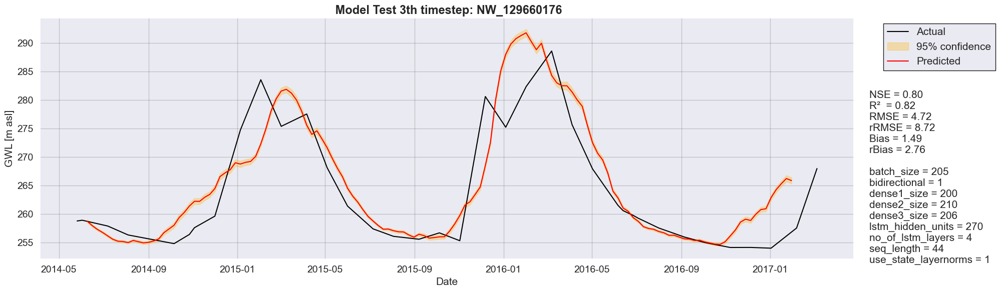

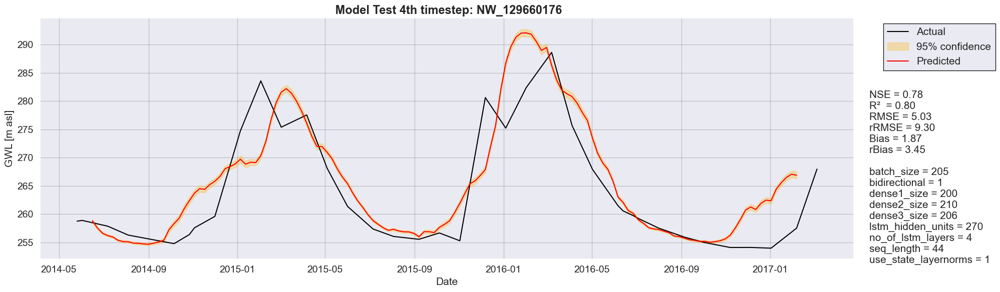

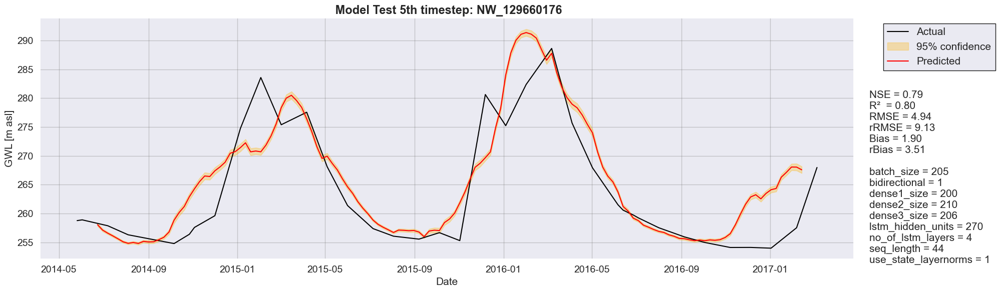

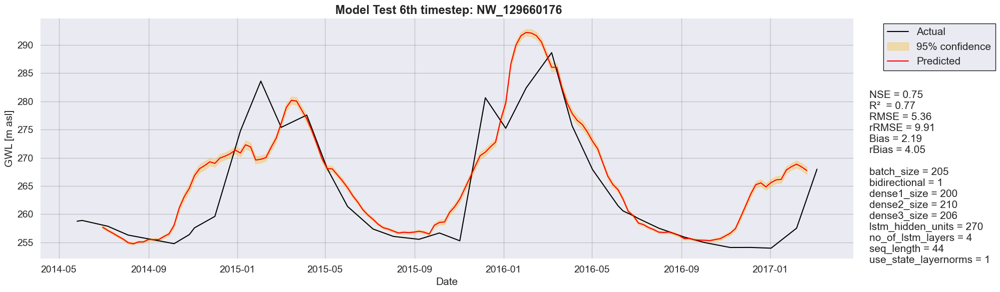

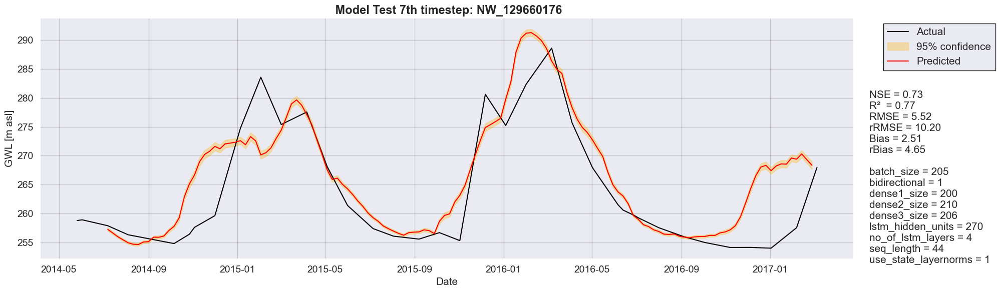

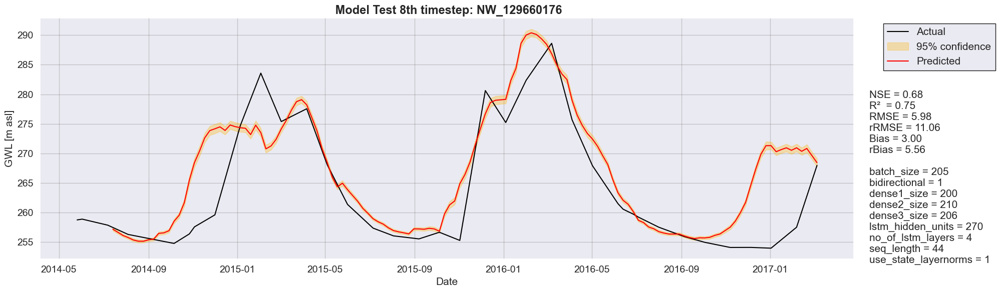

Total time for well of well_no 83 = 0:35:16.181398
Total time for all wells= 1:10:33.162948
(target_well_no:28) BayesOpt-Iteration 1 - ini-Ensemblemember 1


epoch/MAE,█▅▄▄▃▃▃▂▂▂▂▁▁▁▁▁▁▁▁
epoch/MSE,█▄▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▅▆▇▇▇▇████████████
epoch/RMSE,█▅▄▄▃▃▃▂▂▂▂▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▃▄▄▅▅▅▆▆▆▇▇██
epoch/learning_rate,████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▄▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▇▆▂▁▃▆▇▇▆█▇▆█▆▇▆▆▇▇
epoch/val_MSE,▃▂▂▁▃▆██▇▇▆▆▇▆▇▆▆▆▆
epoch/val_NSE,▆▇▇█▆▃▁▁▂▂▃▃▂▃▂▃▃▃▃
epoch/val_RMSE,▄▂▂▁▄▆██▇▇▇▆▇▇▇▆▆▆▆


wandb: WARNING Path /home/ishan/Projects/Groundwater Project/Phase 1 work/well_results_B_results/well_28_BW_16-706-8/optSt_True/prdL_8/exFts_False_GWLinc_True____2024_10_31__21_32_04__424129/wandb__/wandb/ wasn't writable, using system temp directory.


3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 263ms/step
total elapsed time = 1:11:04.491584
(target_well_no = 28) elapsed time = 0:00:31.329096
(target_well_no:28) BayesOpt-Iteration 2 - ini-Ensemblemember 1


epoch/MAE,█▅▄▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁
epoch/MSE,█▄▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▅▆▇▇▇▇████████████
epoch/RMSE,█▅▄▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▃▄▄▅▅▅▆▆▆▇▇██
epoch/learning_rate,████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▄▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,█▇▂▁▂▃▄▄▄▄▄▅▅▅▄▆▆▆▄
epoch/val_MSE,█▇▃▁▂▂▃▃▃▃▃▄▄▄▄▆▆▆▄
epoch/val_NSE,▁▂▆█▇▇▆▆▆▆▆▅▅▅▅▄▄▃▅
epoch/val_RMSE,█▇▃▁▂▂▃▃▃▃▄▄▅▅▄▆▆▆▄


3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 287ms/step
total elapsed time = 1:11:43.017374
(target_well_no = 28) elapsed time = 0:01:09.855218
(target_well_no:28) BayesOpt-Iteration 3 - ini-Ensemblemember 1


epoch/MAE,█▅▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/MSE,█▄▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▅▆▇▇▇▇▇▇▇▇████████████████████████████
epoch/RMSE,█▅▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
epoch/learning_rate,██████████▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▂▂▂▂▂▁▁▁▁▁▁
epoch/loss,█▄▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,█▆▄▄▅▃▄▄▅▄▃▃▄▃▃▃▂▂▂▂▃▂▃▁▁▃▃▂▂▂▃▂▂▃▃▃▃▃▄
epoch/val_MSE,█▅▃▃▄▂▃▃▄▃▃▂▃▂▂▂▂▂▂▂▃▂▃▁▁▃▃▂▂▂▃▃▃▃▃▃▄▃▄
epoch/val_NSE,▁▄▆▆▅▇▆▆▅▆▆▇▆▇▇▇▇▇▇▇▆▇▆██▆▆▇▇▇▆▆▆▆▆▆▅▆▅
epoch/val_RMSE,█▅▃▃▄▂▃▃▄▃▃▃▄▂▂▃▂▂▂▂▃▂▃▁▂▃▃▂▃▂▃▃▃▃▄▃▄▃▄


3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 221ms/step
total elapsed time = 1:12:21.690597
(target_well_no = 28) elapsed time = 0:01:48.528038
(target_well_no:28) BayesOpt-Iteration 4 - ini-Ensemblemember 1


epoch/MAE,█▆▅▅▄▃▃▂▂▁▁▁▁▁▁▁▁
epoch/MSE,█▅▄▄▃▂▂▂▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▄▅▅▆▇▇▇█████████
epoch/RMSE,█▆▅▅▄▃▃▂▂▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▄▄▅▅▅▆▆▇▇██
epoch/learning_rate,██████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▅▄▄▃▂▂▂▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▄▁▁▃▄▇█▆▆▇▇▇▇▇▇▇▇
epoch/val_MSE,▄▁▂▃▃▆█▆▆▆▆▇▇▇▇▇▇
epoch/val_NSE,▅█▇▆▆▃▁▃▃▃▃▂▂▂▂▂▂
epoch/val_RMSE,▄▁▂▄▄▇█▆▇▆▇▇▇▇▇▇▇


3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 179ms/step
total elapsed time = 1:13:04.739181
(target_well_no = 28) elapsed time = 0:02:31.576457
(target_well_no:28) BayesOpt-Iteration 5 - ini-Ensemblemember 1


epoch/MAE,█▆▅▄▄▃▂▂▂▂▁▁▁▁▁▁▁▁
epoch/MSE,█▅▄▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▄▅▆▇▇▇███████████
epoch/RMSE,█▆▅▄▄▃▂▂▂▂▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▃▄▄▅▅▆▆▆▇▇██
epoch/learning_rate,███████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▅▄▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▅█▂▅▁█▇▇▆▅▆▅▆▆▆▅▅▆
epoch/val_MSE,▄▆▁▃▁█▅▇█▇█▇█▇▇▇▇█
epoch/val_NSE,▅▃█▆█▁▄▂▁▂▁▂▁▂▂▂▂▁
epoch/val_RMSE,▄▆▁▄▁█▆▇█▇█▇█▇█▇▇█


3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 227ms/step
total elapsed time = 1:13:38.753078
(target_well_no = 28) elapsed time = 0:03:05.590672
(target_well_no:28) BayesOpt-Iteration 6 - ini-Ensemblemember 1


epoch/MAE,█▄▄▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁
epoch/MSE,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▇▇▇▇██████████████
epoch/RMSE,█▄▄▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
epoch/learning_rate,█████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,█▂▃█▂▆▆▁▃▄▃▄▂▅▃▄▄▄▄▅
epoch/val_MSE,█▁▂▇▁▅▅▁▃▃▃▄▂▄▃▄▄▄▄▅
epoch/val_NSE,▁█▇▂█▄▄█▇▆▆▅▇▅▆▅▅▅▅▄
epoch/val_RMSE,█▂▂▇▁▅▅▁▃▄▃▄▂▄▄▄▄▄▄▅


3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 360ms/step
total elapsed time = 1:14:15.276543
(target_well_no = 28) elapsed time = 0:03:42.114152
(target_well_no:28) BayesOpt-Iteration 7 - ini-Ensemblemember 1


epoch/MAE,█▄▃▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/MSE,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▇▇▇▇█████████████
epoch/RMSE,█▄▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▃▄▄▅▅▅▆▆▆▇▇██
epoch/learning_rate,████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,█▃▂▁▁▂▅▆▅▅▆▄▅▅▄▄▅▄▅
epoch/val_MSE,█▃▁▁▁▁▃▄▃▃▄▃▃▃▃▂▃▃▃
epoch/val_NSE,▁▆████▆▅▆▆▅▆▆▆▆▇▆▆▆
epoch/val_RMSE,█▃▂▁▁▂▃▅▄▃▄▃▃▃▃▃▃▃▃


3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 177ms/step
total elapsed time = 1:14:44.072318
(target_well_no = 28) elapsed time = 0:04:10.909792
(target_well_no:28) BayesOpt-Iteration 8 - ini-Ensemblemember 1


epoch/MAE,█▅▄▃▃▂▂▂▂▂▁▁▁▁▁▁▁
epoch/MSE,█▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▆▇▇▇▇██████████
epoch/RMSE,█▄▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▄▄▅▅▅▆▆▇▇██
epoch/learning_rate,██████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,█▁▃▃▃▄▅▆▆▆▆▇▇▇███
epoch/val_MSE,█▁▃▃▃▄▅▆▅▆▆▇▇▇███
epoch/val_NSE,▁█▆▆▆▅▄▃▄▃▃▂▂▂▁▁▁
epoch/val_RMSE,█▁▃▃▃▄▅▆▆▇▆▇▇▇███


3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 201ms/step
total elapsed time = 1:15:18.515595
(target_well_no = 28) elapsed time = 0:04:45.353141
(target_well_no:28) BayesOpt-Iteration 9 - ini-Ensemblemember 1


epoch/MAE,█▅▄▄▄▃▃▃▂▂▂▂▁▁▁▁▁▁
epoch/MSE,█▃▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▆▆▇▇▇▇██████████
epoch/RMSE,█▄▄▄▄▃▃▃▂▂▂▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▃▄▄▅▅▆▆▆▇▇██
epoch/learning_rate,███████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▄▃▁▁▂▄▄▄▆▅▇▇█▇▇█▇█
epoch/val_MSE,▄▂▁▁▂▅▆▄▅▅▇▇▇▇▇███
epoch/val_NSE,▅▇██▇▄▃▅▄▄▂▂▂▂▂▁▁▁
epoch/val_RMSE,▄▂▁▁▃▆▆▅▆▆███▇▇███


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 513ms/step
total elapsed time = 1:16:11.658475
(target_well_no = 28) elapsed time = 0:05:38.495959
(target_well_no:28) BayesOpt-Iteration 10 - ini-Ensemblemember 1


epoch/MAE,█▄▃▃▃▂▂▂▁▁▁▁▁▁▁▁▁
epoch/MSE,█▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▇▇▇████████████
epoch/RMSE,█▄▃▃▃▂▂▂▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▄▄▅▅▅▆▆▇▇██
epoch/learning_rate,██████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▂▁▃▅▅▇██▇▇▇█▆▆▆▆▆
epoch/val_MSE,▁▁▂▅▄▆██▇▆▇█▅▆▆▆▅
epoch/val_NSE,██▇▄▅▃▁▁▂▃▂▁▄▃▃▃▄
epoch/val_RMSE,▁▁▃▅▅▇██▇▇▇█▆▆▆▆▆


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 510ms/step
total elapsed time = 1:16:55.027156
(target_well_no = 28) elapsed time = 0:06:21.864601
(target_well_no:28) BayesOpt-Iteration 11 - ini-Ensemblemember 1


epoch/MAE,█▄▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁
epoch/MSE,█▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▇▇▇█████████████
epoch/RMSE,█▄▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▃▄▄▅▅▆▆▆▇▇██
epoch/learning_rate,███████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▁▅▁▂▁▂▂▄▃▆▄▅▇▇▆█▇█
epoch/val_MSE,▂▅▁▁▁▂▂▄▃▆▅▅▇▇▆█▇█
epoch/val_NSE,▇▄███▇▇▅▆▃▄▄▂▂▃▁▂▁
epoch/val_RMSE,▂▅▁▁▁▂▃▄▃▇▅▅▇▇▇█▇█


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 384ms/step
total elapsed time = 1:17:42.796394
(target_well_no = 28) elapsed time = 0:07:09.633929
(target_well_no:28) BayesOpt-Iteration 12 - ini-Ensemblemember 1


epoch/MAE,█▅▄▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁
epoch/MSE,█▃▃▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▆▇▇▇█▇████████████
epoch/RMSE,█▄▄▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
epoch/learning_rate,████████▄▄▄▄▄▂▂▂▂▂▁▁
epoch/loss,█▃▃▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▅▃▂▁▁▅▆▆▇▇▆▇▇▆▇▇██▇▇
epoch/val_MSE,▄▂▁▁▁▅▆▆▆▆▆▇▇▆▇▇▇█▇▇
epoch/val_NSE,▅▇███▄▃▃▃▃▃▂▂▃▂▂▂▁▂▂
epoch/val_RMSE,▅▂▁▁▁▅▆▆▆▇▆▇▇▆▇▇▇█▇▇


3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 228ms/step
total elapsed time = 1:18:17.376638
(target_well_no = 28) elapsed time = 0:07:44.213986
(target_well_no:28) BayesOpt-Iteration 13 - ini-Ensemblemember 1


epoch/MAE,█▄▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/MSE,█▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▇▇▇▇▇▇█████████████████████
epoch/RMSE,█▄▃▃▃▃▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▁▂▂▂▃▃▃▃▃▄▄▄▅▅▅▅▅▆▆▆▇▇▇▇▇██
epoch/learning_rate,███████▄▄▄▄▄▄▄▄▄▄▄▂▂▂▂▂▁▁▁▁▁▁
epoch/loss,█▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▅▄▃███▅▅▇▄▄▅▅▁▅▅▃▄▄▅▃▅▃▄▄▄▄▅▄
epoch/val_MSE,▆▅▃█▇▇▄▄▆▃▃▅▄▁▅▆▃▄▄▅▃▆▄▅▅▄▅▅▄
epoch/val_NSE,▃▄▆▁▂▂▅▅▃▆▆▄▅█▄▃▆▅▅▄▆▄▅▄▄▅▄▄▅
epoch/val_RMSE,▆▅▃█▇▇▄▄▆▄▃▅▄▁▅▆▃▄▄▅▄▆▄▅▅▄▅▅▅


3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 291ms/step
total elapsed time = 1:18:54.317287
(target_well_no = 28) elapsed time = 0:08:21.154473
(target_well_no:28) BayesOpt-Iteration 14 - ini-Ensemblemember 1


epoch/MAE,█▄▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁
epoch/MSE,█▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▇▇▇█████████████
epoch/RMSE,█▄▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▃▄▄▅▅▆▆▆▇▇██
epoch/learning_rate,███████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▅▅▁▂▅▂█▅▄▄▄▆▆▆▇▇██
epoch/val_MSE,▆▅▁▂▄▂▇▄▃▄▄▅▆▆▇▇██
epoch/val_NSE,▃▄█▇▅▇▂▅▆▅▅▄▃▃▂▂▁▁
epoch/val_RMSE,▆▅▁▂▄▂▇▅▄▄▄▆▆▆▇▇██


3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 272ms/step
total elapsed time = 1:19:31.478475
(target_well_no = 28) elapsed time = 0:08:58.316707
(target_well_no:28) BayesOpt-Iteration 15 - ini-Ensemblemember 1


epoch/MAE,█▇▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
epoch/MSE,█▆▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▃▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇███████████████
epoch/RMSE,█▇▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
epoch/learning_rate,██████████████████████████████▄▄▄▄▄▂▂▂▂▁
epoch/loss,█▆▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,█▆▅▅▅▄▄▄▄▄▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MSE,█▆▅▄▄▄▃▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_NSE,▁▃▄▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇█████████████████████
epoch/val_RMSE,█▇▆▅▅▄▄▄▄▄▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▂▁▂▁▂▁▁▁▁▁▁


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 386ms/step
total elapsed time = 1:20:14.169801
(target_well_no = 28) elapsed time = 0:09:41.006956
(target_well_no:28) BayesOpt-Iteration 16 - ini-Ensemblemember 1


epoch/MAE,█▄▄▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
epoch/MSE,█▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▆▇▇▇▇▇▇▇▇█████████████
epoch/RMSE,█▄▄▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▂▃▃▃▃▄▄▄▅▅▅▆▆▆▆▇▇▇██
epoch/learning_rate,█████████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▂▃▁▅▅▄▄▂▁▁█▁▁▅▁▄▂▃▂▂▃▂▂▂
epoch/val_MSE,▃▃▂▅▅▃▃▂▁▁█▁▁▅▁▄▂▄▃▃▄▃▃▃
epoch/val_NSE,▆▆▇▄▄▆▆▇██▁██▄█▅▇▅▆▆▅▆▆▆
epoch/val_RMSE,▄▄▂▆▅▃▃▂▁▁█▁▁▅▁▄▂▄▃▃▄▃▃▃


3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 224ms/step
total elapsed time = 1:20:46.496020
(target_well_no = 28) elapsed time = 0:10:13.333319
(target_well_no:28) BayesOpt-Iteration 17 - ini-Ensemblemember 1


epoch/MAE,█▄▃▂▂▂▂▂▂▂▂▂▁▁▁▁
epoch/MSE,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▇▇▇▇██████████
epoch/RMSE,█▄▃▂▂▂▂▂▂▂▂▂▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▄▄▅▅▆▆▇▇██
epoch/learning_rate,█████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▁▆▅▆▇█▅▄▄▆▇▁▃▄▁▃
epoch/val_MSE,▁▆▅▆▇▇▅▄▄▇█▂▃▅▃▄
epoch/val_NSE,█▃▄▃▂▂▄▅▅▂▁▇▆▄▆▅
epoch/val_RMSE,▁▆▅▆█▇▆▅▅▇█▂▃▅▃▄


3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 165ms/step
total elapsed time = 1:21:25.799458
(target_well_no = 28) elapsed time = 0:10:52.637790
(target_well_no:28) BayesOpt-Iteration 18 - ini-Ensemblemember 1


epoch/MAE,█▅▄▃▃▃▂▂▁▂▁▁▁▁▁▁▁▁
epoch/MSE,█▄▃▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▅▆▆▇▇▇███████████
epoch/RMSE,█▅▄▃▃▃▂▂▁▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▃▄▄▅▅▆▆▆▇▇██
epoch/learning_rate,███████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▄▃▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▄▂▁▂▃▃▁▇▅▃▄▄▅▇▆▆▇█
epoch/val_MSE,▃▂▁▂▃▃▂▆▅▃▄▅▅▆▆▆▇█
epoch/val_NSE,▆▇█▇▆▆▇▃▄▆▅▄▄▃▃▃▂▁
epoch/val_RMSE,▄▂▁▂▃▃▂▇▅▃▄▅▅▇▆▆▇█


3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 270ms/step
total elapsed time = 1:22:05.280961
(target_well_no = 28) elapsed time = 0:11:32.118987
(target_well_no:28) BayesOpt-Iteration 19 - ini-Ensemblemember 1


epoch/MAE,█▅▄▃▃▂▂▂▂▂▂▁▁▁▁▁
epoch/MSE,█▄▂▂▂▂▂▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▅▇▇▇▇▇█████████
epoch/RMSE,█▅▃▃▃▃▂▂▂▂▂▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▄▄▅▅▆▆▇▇██
epoch/learning_rate,█████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▄▂▂▂▂▂▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▁▂▅▄▅▂▂▃▃▄▄█▅▆▇▇
epoch/val_MSE,▁▁▄▂▅▂▂▃▃▅▄█▅▆▇▇
epoch/val_NSE,██▅▇▄▇▇▆▆▄▅▁▄▃▂▂
epoch/val_RMSE,▁▁▄▂▅▂▂▃▃▅▅█▆▆█▇


3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 292ms/step
total elapsed time = 1:22:43.608587
(target_well_no = 28) elapsed time = 0:12:10.446194
(target_well_no:28) BayesOpt-Iteration 20 - ini-Ensemblemember 1


epoch/MAE,█▅▄▄▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁
epoch/MSE,█▄▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▅▆▆▇▇▇▇▇▇████████████
epoch/RMSE,█▅▄▄▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▂▃▃▃▄▄▄▅▅▅▆▆▆▇▇▇██
epoch/learning_rate,███████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▄▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,█▄▃▂▂▁▁▃▂▂▃▆▄▆▄▅▅▅▅▅▅▅
epoch/val_MSE,█▄▃▂▂▁▁▂▂▁▂▅▃▅▄▄▄▄▄▄▅▄
epoch/val_NSE,▁▅▆▇▇██▇▇█▇▄▆▄▅▅▅▅▅▅▄▅
epoch/val_RMSE,█▄▃▂▂▁▁▂▂▁▂▆▄▆▄▄▄▅▅▄▅▅


3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 278ms/step
total elapsed time = 1:23:16.455462
(target_well_no = 28) elapsed time = 0:12:43.292941
Phase 1 :- random exploration ; of bayesian optimization on well 28, done. 


beststep 19, current step 21
(target_well_no:28) BayesOpt-Iteration 21 - ini-Ensemblemember 1


epoch/MAE,█▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/MSE,█▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▇▇▇▇██████████████
epoch/RMSE,█▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▃▄▄▅▅▅▆▆▆▇▇██
epoch/learning_rate,████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▇▃▃▁▅▇▅█▇▆▆▆▅▅▅▄▄▄▄
epoch/val_MSE,█▃▃▁▄▅▄▆▆▅▅▅▄▅▅▄▄▄▄
epoch/val_NSE,▁▆▆█▅▄▅▃▄▄▄▄▅▄▄▅▅▅▅
epoch/val_RMSE,█▄▃▁▄▆▄▆▆▅▅▅▅▅▅▄▅▄▄


3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 296ms/step
total elapsed time = 1:23:52.897220
(target_well_no = 28) elapsed time = 0:13:19.735033

beststep 19, current step 22
(target_well_no:28) BayesOpt-Iteration 22 - ini-Ensemblemember 1


epoch/MAE,█▄▄▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁
epoch/MSE,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▇▇▇▇████████████
epoch/RMSE,█▄▃▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▃▄▄▅▅▆▆▆▇▇██
epoch/learning_rate,███████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,█▆▁▂▂▂▁▂▃▃▃▃▄▃▄▄▄▄
epoch/val_MSE,█▅▁▃▂▂▂▃▃▄▄▄▅▄▅▅▅▅
epoch/val_NSE,▁▄█▆▇▇▇▆▆▅▅▅▄▅▄▄▄▄
epoch/val_RMSE,█▆▁▃▃▃▃▄▄▄▅▄▅▅▆▅▅▅


3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 168ms/step
total elapsed time = 1:24:23.811709
(target_well_no = 28) elapsed time = 0:13:50.649302

beststep 19, current step 23
(target_well_no:28) BayesOpt-Iteration 23 - ini-Ensemblemember 1


epoch/MAE,█▄▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁
epoch/MSE,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▇▇▇▇████████████
epoch/RMSE,█▄▃▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▃▄▄▅▅▆▆▆▇▇██
epoch/learning_rate,███████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▇▅▁▃▄▅▄▆▅▆▆█▇▇▇███
epoch/val_MSE,▆▅▁▃▅▅▄▆▅▆▇█▇▇▇███
epoch/val_NSE,▃▄█▆▄▄▅▃▄▃▂▁▂▂▂▁▁▁
epoch/val_RMSE,▇▅▁▃▅▆▄▆▅▇▇█▇▇▇███


3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 229ms/step
total elapsed time = 1:24:57.919031
(target_well_no = 28) elapsed time = 0:14:24.756460

beststep 23, current step 24
(target_well_no:28) BayesOpt-Iteration 24 - ini-Ensemblemember 1


epoch/MAE,█▅▅▄▄▄▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/MSE,█▄▄▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▅▅▆▆▆▇▇▇▇▇▇██████████████
epoch/RMSE,█▅▅▄▄▄▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▂▂▃▃▃▄▄▄▄▅▅▅▅▆▆▆▇▇▇▇██
epoch/learning_rate,███████████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▄▄▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▇█▅▆▆▄▃▂▁▂▁▃▁▃▃▃▅▄▄▅▄▄▅▅▅▅
epoch/val_MSE,██▅▅▆▃▂▂▁▂▁▂▁▃▃▃▄▄▄▅▄▅▄▅▅▅
epoch/val_NSE,▁▁▄▄▃▆▇▇█▇█▇█▆▆▆▅▅▅▄▅▄▅▄▄▄
epoch/val_RMSE,██▅▅▆▃▂▂▁▂▁▃▂▄▃▄▅▄▄▆▅▅▅▆▅▅


3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 366ms/step
total elapsed time = 1:25:39.487428
(target_well_no = 28) elapsed time = 0:15:06.324761

beststep 23, current step 25
(target_well_no:28) BayesOpt-Iteration 25 - ini-Ensemblemember 1


epoch/MAE,█▆▄▄▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/MSE,█▅▃▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▄▆▆▇▇▇████████████████
epoch/RMSE,█▆▅▄▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▂▃▃▃▄▄▄▅▅▅▅▆▆▆▇▇▇██
epoch/learning_rate,████████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▅▃▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,█▅▃▂▁▁▁▁▁▁▂▃▄▂▄▄▃▄▄▃▄▄▄
epoch/val_MSE,█▅▂▁▁▁▁▁▁▁▁▂▂▂▃▂▂▃▃▃▃▃▃
epoch/val_NSE,▁▄▇████████▇▇▇▆▇▇▆▆▆▆▆▆
epoch/val_RMSE,█▅▃▂▁▁▁▁▁▁▂▃▃▂▃▃▃▃▃▃▃▄▃


3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 332ms/step
total elapsed time = 1:26:19.820318
(target_well_no = 28) elapsed time = 0:15:46.657973

beststep 25, current step 26
(target_well_no:28) BayesOpt-Iteration 26 - ini-Ensemblemember 1


epoch/MAE,█▅▄▃▃▂▂▂▂▁▁▁▁▁▁▁▁
epoch/MSE,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▇▇▇▇███████████
epoch/RMSE,█▅▄▃▃▂▂▂▂▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▄▄▅▅▅▆▆▇▇██
epoch/learning_rate,██████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▅▁▃▄▅▅▅▅▆▇▇█▇█▇██
epoch/val_MSE,▄▁▂▃▄▅▄▅▆▆▇▇▇███▇
epoch/val_NSE,▅█▇▆▅▄▅▄▃▃▂▂▂▁▁▁▂
epoch/val_RMSE,▅▁▃▃▄▅▅▅▇▇▇▇▇███▇


3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 139ms/step
total elapsed time = 1:26:52.913201
(target_well_no = 28) elapsed time = 0:16:19.750821

beststep 25, current step 27
(target_well_no:28) BayesOpt-Iteration 27 - ini-Ensemblemember 1


epoch/MAE,█▄▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/MSE,█▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▇▇▇▇▇▇▇▇██████████████████████
epoch/RMSE,█▄▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▁▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▆▇▇▇▇███
epoch/learning_rate,█████████████████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,█▆▆▇▆▇▆▇▅▄▄▃▁▂▂▅▁▄▃▅▃▄▆▅▅▅▅▆▆▆▅▅
epoch/val_MSE,█▅▅▅▅▅▄▅▃▃▃▃▁▂▂▅▁▃▃▅▃▅▅▅▆▅▆▆▆▅▅▅
epoch/val_NSE,▁▄▄▄▄▄▅▄▆▆▆▆█▇▇▄█▆▆▄▆▄▄▄▃▄▃▃▃▄▄▄
epoch/val_RMSE,█▅▅▅▅▅▄▆▄▃▄▄▁▂▂▅▁▃▄▆▃▅▅▅▆▅▆▇▆▆▆▆


3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 267ms/step
total elapsed time = 1:27:34.604134
(target_well_no = 28) elapsed time = 0:17:01.441638

beststep 25, current step 28
(target_well_no:28) BayesOpt-Iteration 28 - ini-Ensemblemember 1


epoch/MAE,█▅▄▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/MSE,█▄▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▅▆▇▇▇██████████████
epoch/RMSE,█▅▄▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
epoch/learning_rate,█████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▄▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▇█▁▃▁▁▄▃▃▂▃▄▅▅▄▄▃▃▃▄
epoch/val_MSE,█▇▁▂▁▂▃▃▂▂▃▄▄▅▃▃▃▂▃▄
epoch/val_NSE,▁▂█▇█▇▆▆▇▇▆▅▅▄▆▆▆▇▆▅
epoch/val_RMSE,██▁▃▁▂▄▃▃▂▃▄▅▅▄▃▃▃▃▄


3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 165ms/step
total elapsed time = 1:28:15.934864
(target_well_no = 28) elapsed time = 0:17:42.772506

beststep 25, current step 29
(target_well_no:28) BayesOpt-Iteration 29 - ini-Ensemblemember 1


epoch/MAE,█▅▄▃▃▂▂▂▂▂▁▁▁▁▁▁
epoch/MSE,█▄▃▃▂▂▂▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▅▆▆▇▇▇█████████
epoch/RMSE,█▄▄▃▃▂▂▂▂▂▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▄▄▅▅▆▆▇▇██
epoch/learning_rate,█████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▄▃▃▂▂▂▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▁▆▆▅▆█▅▃▄▃▄▇▆▆▆▆
epoch/val_MSE,▁▅▆▅▆█▄▃▃▂▄▇▆▅▆▇
epoch/val_NSE,█▄▃▄▃▁▅▆▆▇▅▂▃▄▃▂
epoch/val_RMSE,▁▅▆▅▆█▄▃▄▃▄▇▆▆▆▇


3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 229ms/step
total elapsed time = 1:29:06.271336
(target_well_no = 28) elapsed time = 0:18:33.108794

beststep 25, current step 30
(target_well_no:28) BayesOpt-Iteration 30 - ini-Ensemblemember 1


epoch/MAE,█▆▅▄▃▂▂▂▁▁▁▁▁▁▁▁▁
epoch/MSE,█▄▄▃▂▂▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▅▅▆▇▇███████████
epoch/RMSE,█▆▅▄▃▂▂▂▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▄▄▅▅▅▆▆▇▇██
epoch/learning_rate,██████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▄▄▃▂▂▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▂▁▃▇▇█▇▇▆▇▆▇▇▆▇▇▇
epoch/val_MSE,▁▁▃█▅▇▆▅▅▆▆▆▆▅▅▆▅
epoch/val_NSE,██▆▁▄▂▃▄▄▃▃▃▃▄▄▃▄
epoch/val_RMSE,▁▁▃█▆▇▆▆▅▆▆▆▆▆▆▆▆


3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 370ms/step
total elapsed time = 1:29:46.333557
(target_well_no = 28) elapsed time = 0:19:13.171080

beststep 25, current step 31
(target_well_no:28) BayesOpt-Iteration 31 - ini-Ensemblemember 1


epoch/MAE,█▄▃▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁
epoch/MSE,█▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▇▇▇▇▇███████████
epoch/RMSE,█▄▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▃▄▄▅▅▆▆▆▇▇██
epoch/learning_rate,███████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▄▃▁▅▄▆█▆█▅▇▄▆▆▆▄▆▅
epoch/val_MSE,▅▃▁▅▄▆▇▆█▆█▅▇▆▆▅▇▅
epoch/val_NSE,▄▆█▄▅▃▂▃▁▃▁▄▂▃▃▄▂▄
epoch/val_RMSE,▅▃▁▅▄▆▇▆█▆█▅▇▆▆▅▇▅


3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 370ms/step
total elapsed time = 1:30:27.968745
(target_well_no = 28) elapsed time = 0:19:54.806238
Phase 2 :- bayesian exploration ; of bayesian optimization on well 28, done. 


beststep 25, current step 32
(target_well_no:28) BayesOpt-Iteration 32 - ini-Ensemblemember 1


epoch/MAE,█▄▃▃▃▃▂▂▂▁▁▁▁▁▁▁
epoch/MSE,█▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▇▇▇▇▇██████████
epoch/RMSE,█▄▃▃▂▂▂▂▂▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▄▄▅▅▆▆▇▇██
epoch/learning_rate,█████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▁▃▄▂▄▂▇▆▄▅▆▆▇██▇
epoch/val_MSE,▁▂▃▂▄▃▆▆▄▅▅▆▇██▇
epoch/val_NSE,█▇▆▇▅▆▃▃▅▄▄▃▂▁▁▂
epoch/val_RMSE,▁▂▃▂▅▃▇▆▄▅▆▆▇██▇


3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 298ms/step
total elapsed time = 1:31:09.703042
(target_well_no = 28) elapsed time = 0:20:36.540179

beststep 25, current step 33
(target_well_no:28) BayesOpt-Iteration 33 - ini-Ensemblemember 1


epoch/MAE,█▄▄▃▃▂▂▂▂▁▁▁▁▁▁▁▁
epoch/MSE,█▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▇▇▇████████████
epoch/RMSE,█▄▄▃▃▂▂▂▂▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▄▄▅▅▅▆▆▇▇██
epoch/learning_rate,██████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▅▁▁▃▇██▅▆▇▅▇▅▇▅▆▆
epoch/val_MSE,▄▁▂▂▇█▇▄▅▇▅▆▄▆▅▅▅
epoch/val_NSE,▅█▇▇▂▁▂▅▄▃▅▃▅▃▄▄▄
epoch/val_RMSE,▅▁▂▂▇█▇▄▆▇▅▆▄▆▅▆▅


3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 218ms/step
total elapsed time = 1:31:44.437053
(target_well_no = 28) elapsed time = 0:21:11.274506

beststep 25, current step 34
(target_well_no:28) BayesOpt-Iteration 34 - ini-Ensemblemember 1


epoch/MAE,█▄▃▃▃▂▂▂▂▁▁▁▁▁▁▁▁
epoch/MSE,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▇▇▇▇███████████
epoch/RMSE,█▄▃▃▃▂▂▂▂▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▄▄▅▅▅▆▆▇▇██
epoch/learning_rate,██████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,█▁▄▂▃▃▃▃▆▄▄▃▄▅▅▅▅
epoch/val_MSE,█▁▄▁▂▂▂▂▅▃▃▂▄▄▄▄▄
epoch/val_NSE,▁█▅█▇▇▇▇▄▆▆▇▅▅▅▅▅
epoch/val_RMSE,█▁▄▁▂▂▂▃▅▃▄▃▄▄▄▅▅


3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 374ms/step
total elapsed time = 1:32:35.368246
(target_well_no = 28) elapsed time = 0:22:02.205885

beststep 25, current step 35
(target_well_no:28) BayesOpt-Iteration 35 - ini-Ensemblemember 1


epoch/MAE,█▅▄▄▄▄▃▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
epoch/MSE,█▄▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▅▆▆▆▇▇▇▇▇▇▇███████████████
epoch/RMSE,█▅▄▄▄▄▃▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▂▂▃▃▃▃▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇██
epoch/learning_rate,████████████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▄▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,██▄▄▄▃▂▂▂▂▂▁▂▂▂▂▃▂▃▃▃▃▃▃▃▃▃
epoch/val_MSE,█▇▄▃▃▂▁▁▁▁▁▁▂▁▁▂▃▁▃▂▃▃▃▃▃▃▃
epoch/val_NSE,▁▂▅▆▆▇██████▇██▇▆█▆▇▆▆▆▆▆▆▆
epoch/val_RMSE,█▇▄▃▃▂▁▁▁▁▁▁▂▁▁▂▃▁▃▃▃▄▃▃▃▃▃


3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 218ms/step
total elapsed time = 1:33:09.205715
(target_well_no = 28) elapsed time = 0:22:36.043034

beststep 25, current step 36
(target_well_no:28) BayesOpt-Iteration 36 - ini-Ensemblemember 1


epoch/MAE,█▅▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁
epoch/MSE,█▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▆▆▇▇▇▇▇▇█████████
epoch/RMSE,█▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▃▄▄▅▅▅▆▆▆▇▇██
epoch/learning_rate,████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
epoch/val_MAE,█▂▅▁▄▃▂▄▁▇▅▃▆▅▇▇▇██
epoch/val_MSE,█▂▃▁▃▄▄▅▂▇▆▅▇▇▆▇▇▇█
epoch/val_NSE,▁▇▆█▆▅▅▄▇▂▃▅▂▂▃▂▂▂▁
epoch/val_RMSE,█▂▄▁▃▅▄▅▂▇▆▅▇▇▆▇▇▇█


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 475ms/step
total elapsed time = 1:34:02.134268
(target_well_no = 28) elapsed time = 0:23:28.971708

beststep 25, current step 37
(target_well_no:28) BayesOpt-Iteration 37 - ini-Ensemblemember 1


epoch/MAE,█▅▄▄▃▂▂▂▂▁▁▁▁▁▁▁▁
epoch/MSE,█▃▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▆▇▇▇███████████
epoch/RMSE,█▄▄▄▃▂▂▂▂▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▄▄▅▅▅▆▆▇▇██
epoch/learning_rate,██████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▃▁▃▄▄▅▆▆▇█▇██████
epoch/val_MSE,▂▁▃▂▃▄▅▅▇█▇██████
epoch/val_NSE,▇█▆▇▆▅▄▄▂▁▂▁▁▁▁▁▁
epoch/val_RMSE,▃▁▃▃▃▅▆▆▇█▇██████


3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 297ms/step
total elapsed time = 1:34:43.021006
(target_well_no = 28) elapsed time = 0:24:09.858493

beststep 25, current step 38
(target_well_no:28) BayesOpt-Iteration 38 - ini-Ensemblemember 1


epoch/MAE,█▅▄▃▃▂▂▂▂▁▁▁▁▁▁▁▁
epoch/MSE,█▃▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▆▇▇▇███████████
epoch/RMSE,█▅▄▃▃▂▂▂▂▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▄▄▅▅▅▆▆▇▇██
epoch/learning_rate,██████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▃▁▃▄▃▄▄▇▇▇▆▇█████
epoch/val_MSE,▃▁▃▃▃▄▄▇▆▇▆▇▇████
epoch/val_NSE,▆█▆▆▆▅▅▂▃▂▃▂▂▁▁▁▁
epoch/val_RMSE,▃▁▃▄▃▄▅▇▇▇▇▇█████


3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 169ms/step
total elapsed time = 1:35:16.548283
(target_well_no = 28) elapsed time = 0:24:43.385666

beststep 25, current step 39
(target_well_no:28) BayesOpt-Iteration 39 - ini-Ensemblemember 1


epoch/MAE,█▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
epoch/MSE,█▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▇▇▇▇▇▇██████████████
epoch/RMSE,█▄▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▂▃▃▃▄▄▄▅▅▅▆▆▆▇▇▇██
epoch/learning_rate,███████████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,█▄▅▄▁▂▁▂▂▁▄▄▄▄▄▂▃▃▄▄▃▃
epoch/val_MSE,█▄▄▃▁▂▁▂▂▂▃▃▄▄▃▂▃▃▄▄▂▃
epoch/val_NSE,▁▅▅▆█▇█▇▇▇▆▆▅▅▆▇▆▆▅▅▇▆
epoch/val_RMSE,█▄▅▃▁▂▁▂▃▂▄▃▄▄▄▂▃▃▄▄▃▃


3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 173ms/step
total elapsed time = 1:35:56.939666
(target_well_no = 28) elapsed time = 0:25:23.777411

beststep 25, current step 40
(target_well_no:28) BayesOpt-Iteration 40 - ini-Ensemblemember 1


epoch/MAE,█▄▄▃▃▃▂▂▂▁▁▁▁▁▁▁
epoch/MSE,█▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▆▇▇▇▇█████████
epoch/RMSE,█▄▄▃▃▃▂▂▂▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▄▄▅▅▆▆▇▇██
epoch/learning_rate,█████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▁▄▅▄▆▆▇███▇▆▇▇▇▇
epoch/val_MSE,▁▅▅▄▇▇▆▇██▇▇▇▇▇▇
epoch/val_NSE,█▄▄▅▂▂▃▂▁▁▂▂▂▂▂▂
epoch/val_RMSE,▁▅▆▅▇▇▇███▇▇█▇▇▇


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 390ms/step
total elapsed time = 1:36:51.673770
(target_well_no = 28) elapsed time = 0:26:18.511250

beststep 25, current step 41
(target_well_no:28) BayesOpt-Iteration 41 - ini-Ensemblemember 1


epoch/MAE,█▄▃▃▃▂▂▂▁▁▁▁▁▁▁▁
epoch/MSE,█▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁
epoch/NSE,▁▆▇▇▇███████████
epoch/RMSE,█▄▃▃▃▂▂▂▁▁▁▁▁▁▁▁
epoch/epoch,▁▁▂▂▃▃▄▄▅▅▆▆▇▇██
epoch/learning_rate,█████▄▄▄▄▄▂▂▂▂▂▁
epoch/loss,█▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁
epoch/val_MAE,▁▄▇▃▃▆▆██▇▇▇▇███
epoch/val_MSE,▁▄▆▃▃▆▆█▇▇▇▇▇███
epoch/val_NSE,█▅▃▆▆▃▃▁▂▂▂▂▂▁▁▁
epoch/val_RMSE,▁▄▆▃▃▆▇██▇▇▇▇███


3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 355ms/step
total elapsed time = 1:37:40.574607
(target_well_no = 28) elapsed time = 0:27:07.412152
Phase 3 :- bayesian exploitation ; of bayesian optimization on well 28, done. 


BEST:	{'target': 1.6134087600573506, 'params': {'batch_size': 112.52818995844774, 'bidirectional': 1.1523933198156164, 'dense1_size': 71.48599276186887, 'dense2_size': 88.69672690567924, 'dense3_size': 109.26970184643243, 'lstm_hidden_units': 251.75710182335678, 'no_of_lstm_layers': 3.3744549945786515, 'seq_length': 47.742025296853775, 'use_state_layernorms': 0.4977076773163437}}
0th sim_test trial, on best model, for well 28 done
1th sim_test trial, on best model, for well 28 done
2th sim_test trial, on best model, for well 28 done
3th sim_test trial, on best model, for well 28 done
Overall performance 
--------------------------------

      NSE        R2     RMSE     rRMSE      Bias     rBias
0  0.8486  0.925518  0.36105  9.187022  0.164695  4.190725


Timestep wise performance 

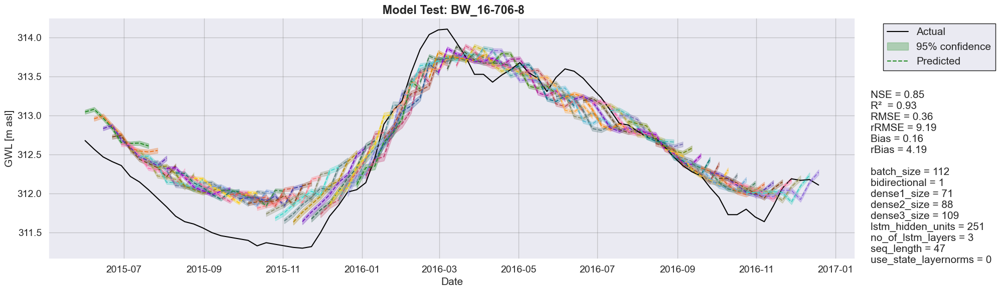



An error occurred: index 87 is out of bounds for axis 0 with size 82
Traceback (most recent call last):
  File "/tmp/ipykernel_1578338/1869235064.py", line 274, in <module>
    ax_zoom.set_xlim(dates[start_zoom], dates[end_zoom])  # Use datetime index for x-limits
                     ~~~~~^^^^^^^^^^^^
  File "/home/ishan/miniconda3/envs/gw_tf/lib/python3.11/site-packages/pandas/core/indexes/base.py", line 5389, in __getitem__
    return getitem(key)
           ^^^^^^^^^^^^
  File "/home/ishan/miniconda3/envs/gw_tf/lib/python3.11/site-packages/pandas/core/arrays/datetimelike.py", line 381, in __getitem__
    result = cast("Union[Self, DTScalarOrNaT]", super().__getitem__(key))
                                                ^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ishan/miniconda3/envs/gw_tf/lib/python3.11/site-packages/pandas/core/arrays/_mixins.py", line 284, in __getitem__
    result = self._ndarray[key]
             ~~~~~~~~~~~~~^^^^^
IndexError: index 87 is out of bounds for axis 

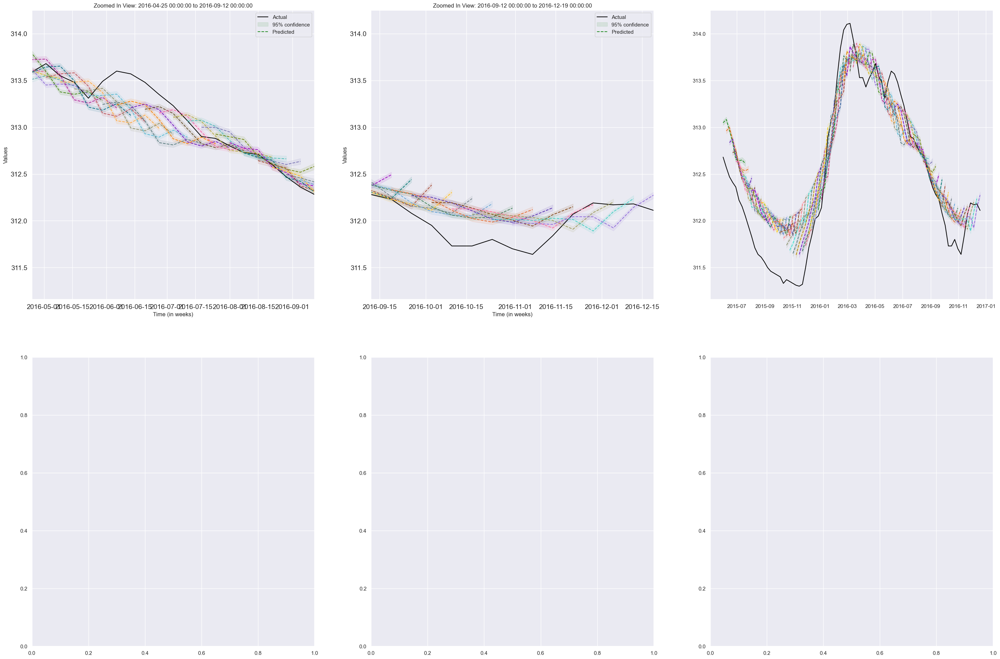

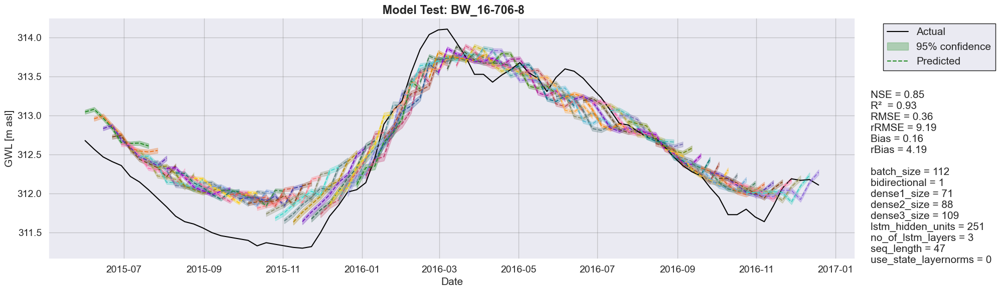

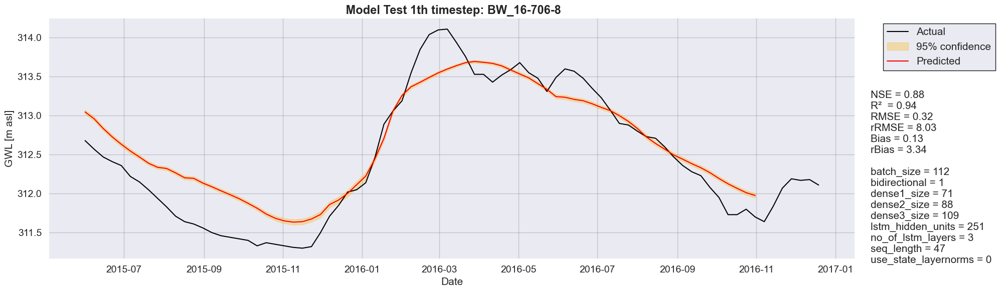

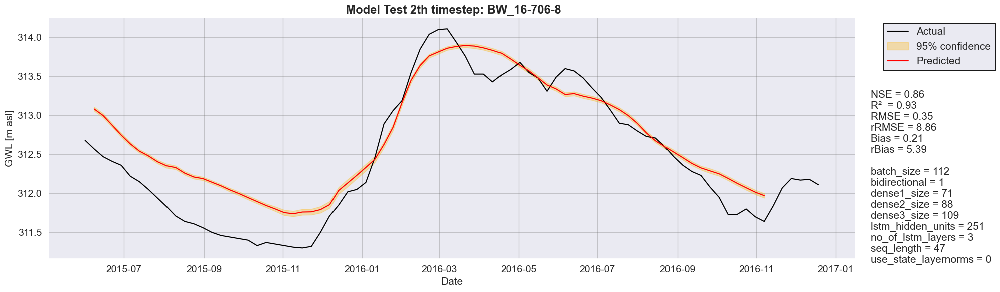

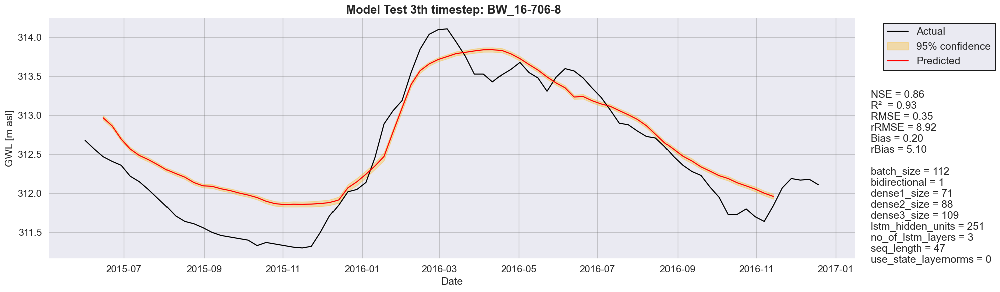

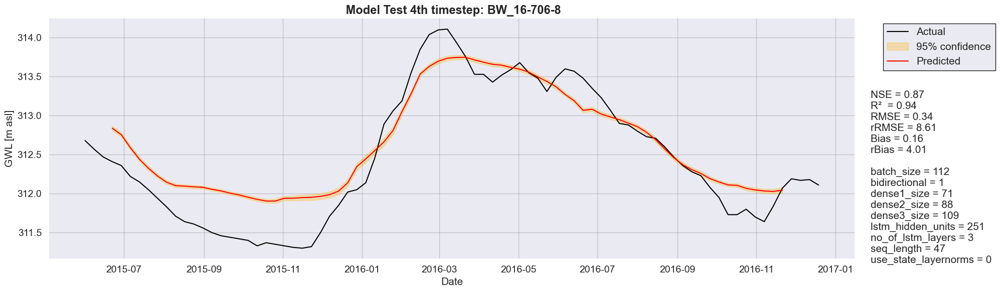

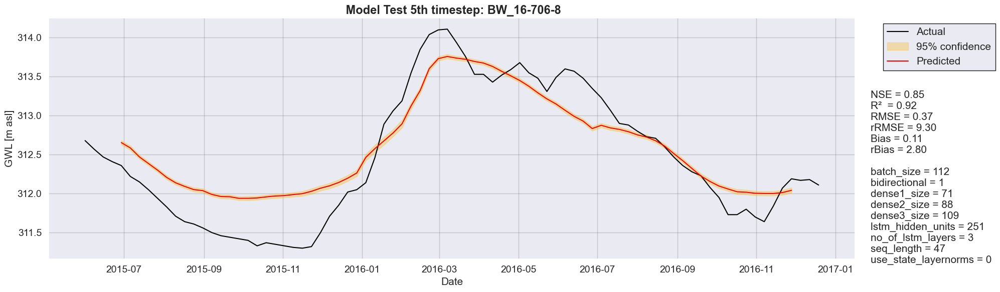

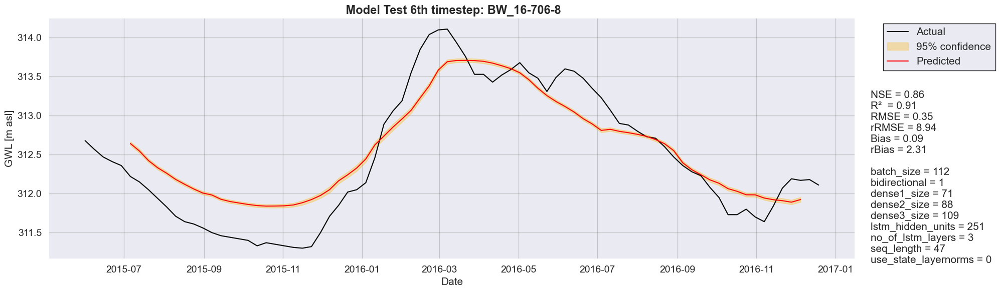

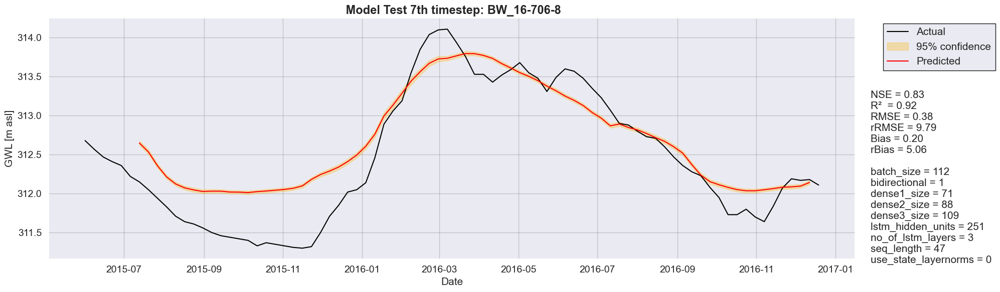

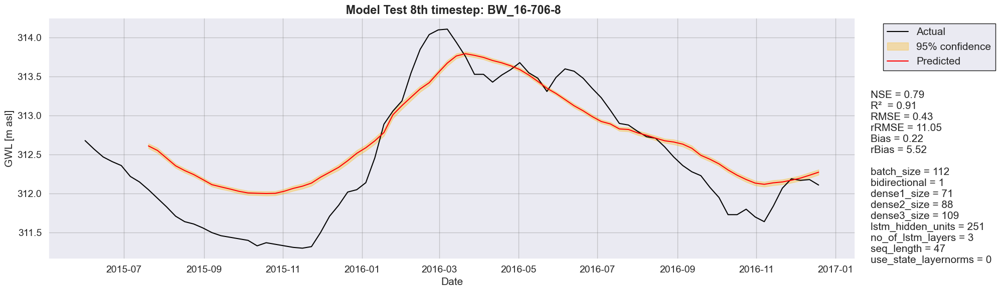

Total time for well of well_no 28 = 0:30:18.705201
Total time for all wells= 1:40:51.868853


wandb: Appending key for api.wandb.ai to your netrc file: /home/ishan/.netrc


In [4]:

# =============================================================================
#### START OF MAIN CODE
# =============================================================================

#'''

bayes_sweep = Sweep()
bayes_sweep.time_total_process = datetime.datetime.now()
time_total_process = bayes_sweep.time_total_process

pathGW = fr"{DATA_FOLDER}/GWData"
pathHYRAS = fr"{DATA_FOLDER}/HYRAS"

well_list_file = fr"{DATA_FOLDER}/ListOfWellsGermany.txt"
#load a list of all sites
well_list = pd.read_csv(well_list_file, sep = ' ', decimal = '.')

# if True:
# for target_well_no in range(15,20): # Loop to test the code
# for target_well_no in range(118): # loop all 118 sites
for target_well_no in [110, 83, 28]: # 102 x, 82 x, 103 x, 94 x, 110, 83, 28
# longest = 102, smallest = 28
    for GLOBAL_SETTINGS['prediction_length'] in [8]:
            try:
                global_settings = copy.deepcopy(GLOBAL_SETTINGS)
                global_settings.update({'target_well_no': target_well_no})

                bayes_sweep.time_single_well = datetime.datetime.now()
                time_single_well = bayes_sweep.time_single_well
                set_seed(123)

                # data, Well_ID = load_GW_and_HYRAS_Data(target_well_no)
                Well_ID = well_list.ID[target_well_no]

                pathResults = (f'{RESULT_FOLDER}/well_{target_well_no}_{Well_ID}/'
                                +'optSt_'+str(global_settings['optimize_state_managment'])+'/'
                                +'prdL_'+str(global_settings['prediction_length'])+'/'
                                +'exFts_'+str(global_settings['extra_features_enabled'])
                                +'_GWLinc_'+str(global_settings['include_GWL_as_feature'])
                                +'____'+datetime.datetime.now().strftime("%Y_%m_%d__%H_%M_%S__%f")
                                )

                global_settings.update({
                                        'target_well': target_well_no,
                                        'wellID'     : Well_ID,
                                        'pathResults': pathResults
                                })
                os.makedirs(pathResults, exist_ok = True)

                with open(f'{pathResults}/GLOBAL_SETTINGS.json', 'w') as json_file:
                        json.dump(global_settings, json_file, indent=4)

                with open(f'{pathResults}/OPTIMIZATION_BOUNDS.json', 'w') as json_file:
                        json.dump(OPTIMIZATION_BOUNDS, json_file, indent=4)

                with open(f'{pathResults}/BAYES_CONFIG.json', 'w') as json_file:
                        json.dump(BAYES_CONFIG, json_file, indent=4)

                if not global_settings['disable_wandb']:
                        project_name = (f'well_results_{BASE_PROJECT}_well_{target_well_no}_'
                                        +'optSt_'+str(global_settings['optimize_state_managment'])+'_'
                                        +'prdL_'+str(global_settings['prediction_length'])+'_'
                                        +'exFts_'+str(global_settings['extra_features_enabled'])
                                        +'_GWLinc_'+str(global_settings['include_GWL_as_feature'])
                                        +'____'+datetime.datetime.now().strftime("%Y_%m_%d__%H_%M_%S__%f")
                                        )

                        # For logging in wandb
                        global_settings.update({
                                                'project_name': project_name,
                                                'OPTIMIZATION_BOUNDS': OPTIMIZATION_BOUNDS,
                                                'BAYES_CONFIG': BAYES_CONFIG
                                                })

                # =============================================================================
                #### SETTING PARAMETER BOUNDS AND OPTIMIZER
                # =============================================================================

                pbounds = OPTIMIZATION_BOUNDS

                bayes_sweep.optimizer = BayesianOptimization(f= bayesOpt_function_wrapper(global_settings), #optimized function
                                                        pbounds=pbounds, #parameter bounds
                                                        random_state=1,
                                                        verbose = 0 # verbose = 1 prints only when a maximum is observed, verbose = 0 is silent, verbose = 2 prints everything
                                                        )
                optimizer = bayes_sweep.optimizer

                logger = newJSONLogger(path=fr"{pathResults}/logs_{target_well_no}.json")
                optimizer.subscribe(Events.OPTIMIZATION_STEP, logger)

                # =============================================================================
                #### STARTING BAYESIAN OPTIMIZATION
                # =============================================================================

                bayes_config = BAYES_CONFIG

                optimizer.maximize(
                                init_points= bayes_config['phase1']['steps'], #steps of random exploration (random starting points before bayesopt(?))
                                n_iter=0, # steps of bayesian optimization
                                acquisition_function = UtilityFunction(kind='ei', xi=bayes_config['phase1']['xi'])
                                # ei  = expected improvmenet (probably the most common acquisition function)
                                )

                # optimize while improvement during last 10 steps
                current_step = len(optimizer.res)
                beststep = False
                step = -1
                while not beststep:
                        step = step + 1
                        beststep = optimizer.res[step] == optimizer.max #search for best iteration

                print(f"Phase 1 :- random exploration ; of bayesian optimization on well {target_well_no}, done.",
                        "\n================================================================================================\n",
                        "================================================================================================\n")

                while current_step < (bayes_config['phase2']['steps'] + bayes_config['phase1']['steps']):
                        current_step = len(optimizer.res)
                        beststep = False
                        step = -1
                        while not beststep:
                                step = step + 1
                                beststep = optimizer.res[step] == optimizer.max
                        print("\nbeststep {}, current step {}".format(step+1, current_step+1))
                        optimizer.maximize(
                                        init_points=0, 
                                        n_iter=1, 
                                        acquisition_function = UtilityFunction(kind='ei', xi=bayes_config['phase2']['xi'])
                                        )
                                
                print(f"Phase 2 :- bayesian exploration ; of bayesian optimization on well {target_well_no}, done.",
                        "\n================================================================================================\n",
                        "================================================================================================\n")

                while current_step < (bayes_config['phase3']['steps'] + bayes_config['phase2']['steps'] + bayes_config['phase1']['steps']):
                        current_step = len(optimizer.res)
                        beststep = False
                        step = -1
                        while not beststep:
                                step = step + 1
                                beststep = optimizer.res[step] == optimizer.max

                        print("\nbeststep {}, current step {}".format(step+1, current_step+1))
                        optimizer.maximize(
                                        init_points=0, 
                                        n_iter=1, 
                                        acquisition_function = UtilityFunction(kind='ei', xi=bayes_config['phase3']['xi'])
                                        )

                print(f"Phase 3 :- bayesian exploitation ; of bayesian optimization on well {target_well_no}, done.",
                        "\n================================================================================================\n",
                        "================================================================================================\n")

                print("\nBEST:\t{}".format(optimizer.max))


                ## HERE THE BEST HYPERPARAMETERS VALUES ARE RECEIVED AND THEN PASSED TO THE "simulate_testset" FUNCTION
                # best_params = {k: int(v) for k, v in optimizer.max.get("params").items()}
                best_params = {}
                for key, value in optimizer.max.get("params").items():

                        if key in ['bidirectional', 'state_management']:
                                if -0.5 <= value < 0.5:
                                        value = False
                                elif 0.5 <= value <= 1.5:
                                        value = True
                                best_params.update({key: value})

                        elif key == 'use_state_layernorms':
                                if -0.5 <= value < 0.5:
                                        value = 0
                                elif 0.5 <= value < 1.5:
                                        value = 1
                                elif 1.5 <= value <= 2.5:
                                        value = 2
                                best_params.update({key: value})

                        else:
                                best_params.update({key: int(value)})

                #run test set simulations
                t1_test = datetime.datetime.now()
                (scores, scores_per_timestep, 
                TestData, sim, obs, 
                inimax, sim_members, Well_ID, errors,
                sim_members_uncertainty, sim_uncertainty) = simulate_testset(Well_ID, best_params, global_settings)

                t2_test = datetime.datetime.now()
                f = open(fr'{pathResults}/timelog_{Well_ID}.txt', "w")
                print("Time [s] for Test-Eval (10 inis)\n{}\n".format(t2_test-t1_test), file = f)


                TestData['Date'] = TestData.index
                TestData['Date']=pd.to_datetime(TestData['Date'])
                TestData.set_index('Date', inplace=True)
                dates = TestData.index
                actual = TestData['GWL']
                predictions = sim
                y_err = unumpy.std_devs(sim_uncertainty)

                prediction_length = global_settings['prediction_length']
                seq_length = global_settings['seq_length']
                total_points = len(predictions) + prediction_length - 1

                # Create the main figure and axis
                fig, ax = plt.subplots(figsize=(20, 6))
                ax = plot_graph(ax, dates, actual, predictions, y_err, global_settings, 0.3)
                ax.set_title(" Model Test: "+Well_ID, size=17,fontweight = 'bold')
                ax.set_ylabel('GWL [m asl]', size=15)
                ax.set_xlabel('Date',size=15)
                ax.legend(fontsize=15,bbox_to_anchor=(1.18, 1),loc='upper right',fancybox = False, framealpha = 1, edgecolor = 'k')
                
                ax.grid(visible=True, which='major', color='#666666', alpha = 0.3, linestyle='-')
                # Set tick font sizes
                ax.tick_params(axis='x', labelsize=14)  # X-axis tick font size
                ax.tick_params(axis='y', labelsize=14)  # Y-axis tick font size


                # WITHIN THE "s" VARIABLE IN THE ".format" THE LAST ONES ARE THE HYPERPARAMETERS' VALUES THAT YOU WANT TO SAVE/SEE
                # Start of the string
                s = """NSE = {:.2f}\nR²  = {:.2f}\nRMSE = {:.2f}\nrRMSE = {:.2f}\nBias = {:.2f}\nrBias = {:.2f}\n""".format(
                scores.NSE[0],scores.R2[0],scores.RMSE[0],scores.rRMSE[0],scores.Bias[0],scores.rBias[0]
                )

                # Add each parameter to the string
                for key, value in best_params.items():
                        s += "\n{} = {:d}".format(key, value)

                fig.text(0.872, 0.11, s, bbox=dict(facecolor='white'),fontsize = 15)
                plt.tight_layout()
                plt.savefig(fr'{pathResults}/Test_{Well_ID}_complete_graph.png', dpi=300)
                plt.show()


                # Assuming predictions is your numpy array
                num_samples = len(predictions)
                window_size = 20  # Fixed window size

                # Calculate the number of full zoom plots needed
                full_zoom_plots = num_samples // window_size
                # Check for any leftover portion
                has_remainder = num_samples % window_size > 0

                # Total number of zoom plots needed (including any remainder)
                num_zoom_plots = full_zoom_plots + (1 if has_remainder else 0)

                # Determine the layout for subplots
                n_cols = 3  # Fixed number of columns
                n_rows = (num_zoom_plots + n_cols - 1) // n_cols  # Calculate number of rows needed

                fig_zoom, axes_zoom = plt.subplots(n_rows, n_cols, figsize=(12 * n_cols, 12 * n_rows))
                axes_zoom = axes_zoom.flatten()

                # Identify the boundaries for the first and last sub-curves
                first_start_idx = seq_length
                last_end_idx = (len(predictions) + seq_length + prediction_length * (prediction_length != 1) - 1)

                # Define zoom levels (you can customize this if needed)
                zoom_levels = [window_size for _ in range(full_zoom_plots)]  # Fixed window size

                # Generate the zoom ranges within the safe boundaries
                zoom_ranges = generate_safe_zoom_ranges(first_start_idx, last_end_idx, zoom_levels)

                # Include the leftover portion if it exists
                if has_remainder:
                        leftover_start = full_zoom_plots * window_size
                        zoom_ranges.append((leftover_start, len(predictions) - 1))  # Last segment

                # Make sure zoom ranges do not exceed index limits
                for ax_zoom, (start_zoom, end_zoom) in zip(axes_zoom, zoom_ranges):
                        # Ensure end_zoom is within bounds of TestData.index
                        end_zoom = min(end_zoom, len(dates) - 1)  # Prevent out-of-bounds

                        ax_zoom = plot_graph(ax_zoom, dates, actual, predictions, y_err, global_settings, 0.1)
                        ax_zoom.set_xlim(dates[start_zoom], dates[end_zoom])  # Use datetime index for x-limits
                        ax_zoom.set_xlabel('Time (in weeks)')
                        ax_zoom.set_ylabel('Values')
                        ax_zoom.set_title(f'Zoomed In View: {TestData.index[start_zoom]} to {TestData.index[end_zoom]}')

                        # Set tick font sizes
                        ax_zoom.tick_params(axis='x', labelsize=14)
                        ax_zoom.tick_params(axis='y', labelsize=14)

                        ax_zoom.legend()

                # Hide any unused subplots if num_zoom_plots is less than the total subplot space
                for i in range(num_zoom_plots, len(axes_zoom)):
                        fig_zoom.delaxes(axes_zoom[i])

                # Adjust layout and show the plot
                plt.tight_layout()
                plt.savefig(fr'{pathResults}/Test_{Well_ID}_zoomed_views.png', dpi=300)
                plt.show()

                confidence_interval_alpha = 0.3

                for timestep in range(global_settings['prediction_length']):
                        err = y_err[:,timestep]
                        pred = predictions[:,timestep]
                        # Create the main figure and axis
                        fig, ax = plt.subplots(figsize=(20, 6))

                        # Plot the actual data
                        ax.plot(dates, actual, label='Actual', color='black')

                        start_idx = 0 + timestep #+ global_settings['seq_length']
                        end_idx = len(predictions) + timestep #+  global_settings['seq_length']
                        x_values = dates[start_idx:end_idx]
                        # if len(x_values) != len(pred):
                        #         # Slice pred to match the length of x_values
                        #         pred = pred[:len(x_values)]
                        #         err = err[:len(x_values)]
                        ax.fill_between(x_values, pred - err, pred + err, label ='95% confidence',
                                                alpha=confidence_interval_alpha, linewidth = 1, facecolor = (1,0.7,0,0.5), edgecolor = (1,0.7,0,0.7))
                        ax.plot(x_values, pred, label="Predicted", color='red')

                        ax.set_title(f" Model Test {timestep+1}th timestep: "+Well_ID, size=17,fontweight = 'bold')
                        ax.set_ylabel('GWL [m asl]', size=15)
                        ax.set_xlabel('Date',size=15)
                        ax.legend(fontsize=15,bbox_to_anchor=(1.18, 1),loc='upper right',fancybox = False, framealpha = 1, edgecolor = 'k')
                        ax.grid(visible=True, which='major', color='#666666', alpha = 0.3, linestyle='-')
                        # Set tick font sizes
                        ax.tick_params(axis='x', labelsize=14)  # X-axis tick font size
                        ax.tick_params(axis='y', labelsize=14)  # Y-axis tick font size


                        # WITHIN THE "s" VARIABLE IN THE ".format" THE LAST ONES ARE THE HYPERPARAMETERS' VALUES THAT YOU WANT TO SAVE/SEE
                        # Start of the string
                        s = """NSE = {:.2f}\nR²  = {:.2f}\nRMSE = {:.2f}\nrRMSE = {:.2f}\nBias = {:.2f}\nrBias = {:.2f}\n""".format(
                                scores_per_timestep.NSE[timestep], 
                                scores_per_timestep.R2[timestep], 
                                scores_per_timestep.RMSE[timestep], 
                                scores_per_timestep.rRMSE[timestep], 
                                scores_per_timestep.Bias[timestep], 
                                scores_per_timestep.rBias[timestep]
                        )

                        # Add each parameter to the string
                        for key, value in best_params.items():
                                s += "\n{} = {:d}".format(key, value)

                        fig.text(0.872, 0.11, s, bbox=dict(facecolor='white'),fontsize = 15)
                        plt.tight_layout()
                        plt.savefig(fr'{pathResults}/Test_{Well_ID}_{timestep+1}th_timestep_graph.png', dpi=300)
                        plt.show()


                # print log summary file
                f = open(fr'{pathResults}/log_summary_{Well_ID}.txt', "w")
                print("\nBEST:\n\n"+s+"\n", file = f)
                print("best iteration = {}".format(step+1), file = f)
                print("max iteration = {}\n".format(len(optimizer.res)), file = f)
                for i, res in enumerate(optimizer.res):
                        print("Iteration {}: \t{}".format(i+1, res), file = f)
                f.close()

                # #print sim data
                # data = TestData
                # printdf = pd.DataFrame(data=sim_members,index=data.index)
                # printdf.to_csv(fr'{pathResults}/ensemble_member_values_{Well_ID}.txt',sep=';')

                # printdf = pd.DataFrame(data=sim_members_uncertainty,index=data.index)
                # printdf.to_csv(fr'{pathResults}/ensemble_member_errors_{Well_ID}.txt',sep=';')

                # printdf = pd.DataFrame(data=np.c_[sim,y_err],index=data.index)
                # printdf = printdf.rename(columns={0: 'Sim', 1:'Sim_Error'})
                # printdf.to_csv(fr'{pathResults}/ensemble_mean_values_{Well_ID}.txt',sep=';', float_format = '%.6f')

                print(f"Total time for well of well_no {target_well_no} = {datetime.datetime.now()-time_single_well}")
                print(f"Total time for all wells= {datetime.datetime.now()-time_total_process}")
                #'''
            except Exception as e:
                print('\n\n================================')
                print(f"An error occurred: {e}")
                # Capture and print the traceback directly
                tb_str = traceback.format_exc()
                print(tb_str)
                print('================================\n\n')
                
                if True:
                        TestData['Date'] = TestData.index
                        TestData['Date']=pd.to_datetime(TestData['Date'])
                        TestData.set_index('Date', inplace=True)
                        dates = TestData.index
                        actual = TestData['GWL']
                        predictions = sim
                        y_err = unumpy.std_devs(sim_uncertainty)

                        prediction_length = global_settings['prediction_length']
                        seq_length = global_settings['seq_length']
                        total_points = len(predictions) + prediction_length - 1

                        # Create the main figure and axis
                        fig, ax = plt.subplots(figsize=(20, 6))
                        ax = plot_graph(ax, dates, actual, predictions, y_err, global_settings, 0.3)
                        ax.set_title(" Model Test: "+Well_ID, size=17,fontweight = 'bold')
                        ax.set_ylabel('GWL [m asl]', size=15)
                        ax.set_xlabel('Date',size=15)
                        ax.legend(fontsize=15,bbox_to_anchor=(1.18, 1),loc='upper right',fancybox = False, framealpha = 1, edgecolor = 'k')
                        
                        ax.grid(visible=True, which='major', color='#666666', alpha = 0.3, linestyle='-')
                        # Set tick font sizes
                        ax.tick_params(axis='x', labelsize=14)  # X-axis tick font size
                        ax.tick_params(axis='y', labelsize=14)  # Y-axis tick font size


                        # WITHIN THE "s" VARIABLE IN THE ".format" THE LAST ONES ARE THE HYPERPARAMETERS' VALUES THAT YOU WANT TO SAVE/SEE
                        # Start of the string
                        s = """NSE = {:.2f}\nR²  = {:.2f}\nRMSE = {:.2f}\nrRMSE = {:.2f}\nBias = {:.2f}\nrBias = {:.2f}\n""".format(
                        scores.NSE[0],scores.R2[0],scores.RMSE[0],scores.rRMSE[0],scores.Bias[0],scores.rBias[0]
                        )

                        # Add each parameter to the string
                        for key, value in best_params.items():
                                s += "\n{} = {:d}".format(key, value)

                        fig.text(0.872, 0.11, s, bbox=dict(facecolor='white'),fontsize = 15)
                        plt.tight_layout()
                        plt.savefig(fr'{pathResults}/Test_{Well_ID}_complete_graph.png', dpi=300)
                        plt.show()

                        confidence_interval_alpha = 0.3

                        for timestep in range(global_settings['prediction_length']):
                                err = y_err[:,timestep]
                                pred = predictions[:,timestep]
                                # Create the main figure and axis
                                fig, ax = plt.subplots(figsize=(20, 6))

                                # Plot the actual data
                                ax.plot(dates, actual, label='Actual', color='black')

                                start_idx = 0 + timestep #+ global_settings['seq_length']
                                end_idx = len(predictions) + timestep #+  global_settings['seq_length']
                                x_values = dates[start_idx:end_idx]
                                # if len(x_values) != len(pred):
                                #         # Slice pred to match the length of x_values
                                #         pred = pred[:len(x_values)]
                                #         err = err[:len(x_values)]
                                ax.fill_between(x_values, pred - err, pred + err, label ='95% confidence',
                                                        alpha=confidence_interval_alpha, linewidth = 1, facecolor = (1,0.7,0,0.5), edgecolor = (1,0.7,0,0.7))
                                ax.plot(x_values, pred, label="Predicted", color='red')

                                ax.set_title(f" Model Test {timestep+1}th timestep: "+Well_ID, size=17,fontweight = 'bold')
                                ax.set_ylabel('GWL [m asl]', size=15)
                                ax.set_xlabel('Date',size=15)
                                ax.legend(fontsize=15,bbox_to_anchor=(1.18, 1),loc='upper right',fancybox = False, framealpha = 1, edgecolor = 'k')
                                ax.grid(visible=True, which='major', color='#666666', alpha = 0.3, linestyle='-')
                                # Set tick font sizes
                                ax.tick_params(axis='x', labelsize=14)  # X-axis tick font size
                                ax.tick_params(axis='y', labelsize=14)  # Y-axis tick font size


                                # WITHIN THE "s" VARIABLE IN THE ".format" THE LAST ONES ARE THE HYPERPARAMETERS' VALUES THAT YOU WANT TO SAVE/SEE
                                # Start of the string
                                s = """NSE = {:.2f}\nR²  = {:.2f}\nRMSE = {:.2f}\nrRMSE = {:.2f}\nBias = {:.2f}\nrBias = {:.2f}\n""".format(
                                        scores_per_timestep.NSE[timestep], 
                                        scores_per_timestep.R2[timestep], 
                                        scores_per_timestep.RMSE[timestep], 
                                        scores_per_timestep.rRMSE[timestep], 
                                        scores_per_timestep.Bias[timestep], 
                                        scores_per_timestep.rBias[timestep]
                                )

                                # Add each parameter to the string
                                for key, value in best_params.items():
                                        s += "\n{} = {:d}".format(key, value)

                                fig.text(0.872, 0.11, s, bbox=dict(facecolor='white'),fontsize = 15)
                                plt.tight_layout()
                                plt.savefig(fr'{pathResults}/Test_{Well_ID}_{timestep+1}th_timestep_graph.png', dpi=300)
                                plt.show()


                        # print log summary file
                        try:
                                f = open(fr'{pathResults}/log_summary_{Well_ID}.txt', "w")
                                print("\nBEST:\n\n"+s+"\n", file = f)
                                print("best iteration = {}".format(step+1), file = f)
                                print("max iteration = {}\n".format(len(optimizer.res)), file = f)
                                for i, res in enumerate(optimizer.res):
                                        print("Iteration {}: \t{}".format(i+1, res), file = f)
                                f.close()
                        except Exception as e:
                                pass

                        print(f"Total time for well of well_no {target_well_no} = {datetime.datetime.now()-time_single_well}")
                        print(f"Total time for all wells= {datetime.datetime.now()-time_total_process}")
                        #'''



wandb_logout()

In [5]:
if False:
                best_params = {}
                for key, value in optimizer.max.get("params").items():

                        if key in ['bidirectional', 'state_management']:
                                if -0.5 <= value < 0.5:
                                        value = False
                                elif 0.5 <= value <= 1.5:
                                        value = True
                                best_params.update({key: value})

                        elif key == 'use_state_layernorms':
                                if -0.5 <= value < 0.5:
                                        value = 0
                                elif 0.5 <= value < 1.5:
                                        value = 1
                                elif 1.5 <= value <= 2.5:
                                        value = 2
                                best_params.update({key: value})

                        else:
                                best_params.update({key: int(value)})

                #run test set simulations
                t1_test = datetime.datetime.now()
                (scores, scores_per_timestep, 
                TestData, sim, obs, 
                inimax, sim_members, Well_ID, errors,
                sim_members_uncertainty, sim_uncertainty) = simulate_testset(Well_ID, best_params, global_settings)

                t2_test = datetime.datetime.now()
                f = open(fr'{pathResults}/timelog_{Well_ID}.txt', "w")
                print("Time [s] for Test-Eval (10 inis)\n{}\n".format(t2_test-t1_test), file = f)


                TestData['Date'] = TestData.index
                TestData['Date']=pd.to_datetime(TestData['Date'])
                TestData.set_index('Date', inplace=True)
                dates = TestData.index
                actual = TestData['GWL']
                predictions = sim
                y_err = unumpy.std_devs(sim_uncertainty)

                prediction_length = global_settings['prediction_length']
                seq_length = global_settings['seq_length']
                total_points = len(predictions) + prediction_length - 1

                # Create the main figure and axis
                fig, ax = plt.subplots(figsize=(20, 6))
                ax = plot_graph(ax, dates, actual, predictions, y_err, global_settings, 0.3)
                ax.set_title(" Model Test: "+Well_ID, size=17,fontweight = 'bold')
                ax.set_ylabel('GWL [m asl]', size=15)
                ax.set_xlabel('Date',size=15)
                ax.legend(fontsize=15,bbox_to_anchor=(1.18, 1),loc='upper right',fancybox = False, framealpha = 1, edgecolor = 'k')
                
                ax.grid(visible=True, which='major', color='#666666', alpha = 0.3, linestyle='-')
                # Set tick font sizes
                ax.tick_params(axis='x', labelsize=14)  # X-axis tick font size
                ax.tick_params(axis='y', labelsize=14)  # Y-axis tick font size


                # WITHIN THE "s" VARIABLE IN THE ".format" THE LAST ONES ARE THE HYPERPARAMETERS' VALUES THAT YOU WANT TO SAVE/SEE
                # Start of the string
                s = """NSE = {:.2f}\nR²  = {:.2f}\nRMSE = {:.2f}\nrRMSE = {:.2f}\nBias = {:.2f}\nrBias = {:.2f}\n""".format(
                scores.NSE[0],scores.R2[0],scores.RMSE[0],scores.rRMSE[0],scores.Bias[0],scores.rBias[0]
                )

                # Add each parameter to the string
                for key, value in best_params.items():
                        s += "\n{} = {:d}".format(key, value)

                fig.text(0.872, 0.11, s, bbox=dict(facecolor='white'),fontsize = 15)
                plt.tight_layout()
                plt.savefig(fr'{pathResults}/Test_{Well_ID}_complete_graph.png', dpi=300)
                plt.show()


                # Assuming predictions is your numpy array
                num_samples = len(predictions)
                window_size = 20  # Fixed window size

                # Calculate the number of full zoom plots needed
                full_zoom_plots = num_samples // window_size
                # Check for any leftover portion
                has_remainder = num_samples % window_size > 0

                # Total number of zoom plots needed (including any remainder)
                num_zoom_plots = full_zoom_plots + (1 if has_remainder else 0)

                # Determine the layout for subplots
                n_cols = 3  # Fixed number of columns
                n_rows = (num_zoom_plots + n_cols - 1) // n_cols  # Calculate number of rows needed

                fig_zoom, axes_zoom = plt.subplots(n_rows, n_cols, figsize=(12 * n_cols, 12 * n_rows))
                axes_zoom = axes_zoom.flatten()

                # Identify the boundaries for the first and last sub-curves
                first_start_idx = seq_length
                last_end_idx = (len(predictions) + seq_length + prediction_length * (prediction_length != 1) - 1)

                # Define zoom levels (you can customize this if needed)
                zoom_levels = [window_size for _ in range(full_zoom_plots)]  # Fixed window size

                # Generate the zoom ranges within the safe boundaries
                zoom_ranges = generate_safe_zoom_ranges(first_start_idx, last_end_idx, zoom_levels)

                # Include the leftover portion if it exists
                if has_remainder:
                        leftover_start = full_zoom_plots * window_size
                        zoom_ranges.append((leftover_start, len(predictions) - 1))  # Last segment

                # Make sure zoom ranges do not exceed index limits
                for ax_zoom, (start_zoom, end_zoom) in zip(axes_zoom, zoom_ranges):
                        # Ensure end_zoom is within bounds of TestData.index
                        end_zoom = min(end_zoom, len(dates) - 1)  # Prevent out-of-bounds

                        ax_zoom = plot_graph(ax_zoom, dates, actual, predictions, y_err, global_settings, 0.1)
                        ax_zoom.set_xlim(dates[start_zoom], dates[end_zoom])  # Use datetime index for x-limits
                        ax_zoom.set_xlabel('Time (in weeks)')
                        ax_zoom.set_ylabel('Values')
                        ax_zoom.set_title(f'Zoomed In View: {TestData.index[start_zoom]} to {TestData.index[end_zoom]}')

                        # Set tick font sizes
                        ax_zoom.tick_params(axis='x', labelsize=14)
                        ax_zoom.tick_params(axis='y', labelsize=14)

                        ax_zoom.legend()

                # Hide any unused subplots if num_zoom_plots is less than the total subplot space
                for i in range(num_zoom_plots, len(axes_zoom)):
                        fig_zoom.delaxes(axes_zoom[i])

                # Adjust layout and show the plot
                plt.tight_layout()
                plt.savefig(fr'{pathResults}/Test_{Well_ID}_zoomed_views.png', dpi=300)
                plt.show()

                confidence_interval_alpha = 0.3

                for timestep in range(global_settings['prediction_length']):
                        err = y_err[:,timestep]
                        pred = predictions[:,timestep]
                        # Create the main figure and axis
                        fig, ax = plt.subplots(figsize=(20, 6))

                        # Plot the actual data
                        ax.plot(dates, actual, label='Actual', color='black')

                        start_idx = 0 + timestep #+ global_settings['seq_length']
                        end_idx = len(predictions) + timestep #+  global_settings['seq_length']
                        x_values = dates[start_idx:end_idx]
                        # if len(x_values) != len(pred):
                        #         # Slice pred to match the length of x_values
                        #         pred = pred[:len(x_values)]
                        #         err = err[:len(x_values)]
                        ax.fill_between(x_values, pred - err, pred + err, label ='95% confidence',
                                                alpha=confidence_interval_alpha, linewidth = 1, facecolor = (1,0.7,0,0.5), edgecolor = (1,0.7,0,0.7))
                        ax.plot(x_values, pred, label="Predicted", color='red')

                        ax.set_title(f" Model Test {timestep+1}th timestep: "+Well_ID, size=17,fontweight = 'bold')
                        ax.set_ylabel('GWL [m asl]', size=15)
                        ax.set_xlabel('Date',size=15)
                        ax.legend(fontsize=15,bbox_to_anchor=(1.18, 1),loc='upper right',fancybox = False, framealpha = 1, edgecolor = 'k')
                        ax.grid(visible=True, which='major', color='#666666', alpha = 0.3, linestyle='-')
                        # Set tick font sizes
                        ax.tick_params(axis='x', labelsize=14)  # X-axis tick font size
                        ax.tick_params(axis='y', labelsize=14)  # Y-axis tick font size


                        # WITHIN THE "s" VARIABLE IN THE ".format" THE LAST ONES ARE THE HYPERPARAMETERS' VALUES THAT YOU WANT TO SAVE/SEE
                        # Start of the string
                        s = """NSE = {:.2f}\nR²  = {:.2f}\nRMSE = {:.2f}\nrRMSE = {:.2f}\nBias = {:.2f}\nrBias = {:.2f}\n""".format(
                                scores_per_timestep.NSE[timestep], 
                                scores_per_timestep.R2[timestep], 
                                scores_per_timestep.RMSE[timestep], 
                                scores_per_timestep.rRMSE[timestep], 
                                scores_per_timestep.Bias[timestep], 
                                scores_per_timestep.rBias[timestep]
                        )

                        # Add each parameter to the string
                        for key, value in best_params.items():
                                s += "\n{} = {:d}".format(key, value)

                        fig.text(0.872, 0.11, s, bbox=dict(facecolor='white'),fontsize = 15)
                        plt.tight_layout()
                        plt.savefig(fr'{pathResults}/Test_{Well_ID}_{timestep+1}th_timestep_graph.png', dpi=300)
                        plt.show()


                # print log summary file
                f = open(fr'{pathResults}/log_summary_{Well_ID}.txt', "w")
                print("\nBEST:\n\n"+s+"\n", file = f)
                print("best iteration = {}".format(step+1), file = f)
                print("max iteration = {}\n".format(len(optimizer.res)), file = f)
                for i, res in enumerate(optimizer.res):
                        print("Iteration {}: \t{}".format(i+1, res), file = f)
                f.close()

                # #print sim data
                # data = TestData
                # printdf = pd.DataFrame(data=sim_members,index=data.index)
                # printdf.to_csv(fr'{pathResults}/ensemble_member_values_{Well_ID}.txt',sep=';')

                # printdf = pd.DataFrame(data=sim_members_uncertainty,index=data.index)
                # printdf.to_csv(fr'{pathResults}/ensemble_member_errors_{Well_ID}.txt',sep=';')

                # printdf = pd.DataFrame(data=np.c_[sim,y_err],index=data.index)
                # printdf = printdf.rename(columns={0: 'Sim', 1:'Sim_Error'})
                # printdf.to_csv(fr'{pathResults}/ensemble_mean_values_{Well_ID}.txt',sep=';', float_format = '%.6f')

                print(f"Total time for well of well_no {target_well_no} = {datetime.datetime.now()-time_single_well}")
                print(f"Total time for all wells= {datetime.datetime.now()-time_total_process}")

In [ ]:
if False:

                TestData['Date'] = TestData.index
                TestData['Date']=pd.to_datetime(TestData['Date'])
                TestData.set_index('Date', inplace=True)
                dates = TestData.index
                actual = TestData['GWL']
                predictions = sim
                y_err = unumpy.std_devs(sim_uncertainty)

                prediction_length = global_settings['prediction_length']
                seq_length = global_settings['seq_length']
                total_points = len(predictions) + prediction_length - 1

                # Create the main figure and axis
                fig, ax = plt.subplots(figsize=(20, 6))
                ax = plot_graph(ax, dates, actual, predictions, y_err, global_settings, 0.3)
                ax.set_title(" Model Test: "+Well_ID, size=17,fontweight = 'bold')
                ax.set_ylabel('GWL [m asl]', size=15)
                ax.set_xlabel('Date',size=15)
                ax.legend(fontsize=15,bbox_to_anchor=(1.18, 1),loc='upper right',fancybox = False, framealpha = 1, edgecolor = 'k')
                
                ax.grid(visible=True, which='major', color='#666666', alpha = 0.3, linestyle='-')
                # Set tick font sizes
                ax.tick_params(axis='x', labelsize=14)  # X-axis tick font size
                ax.tick_params(axis='y', labelsize=14)  # Y-axis tick font size


                # WITHIN THE "s" VARIABLE IN THE ".format" THE LAST ONES ARE THE HYPERPARAMETERS' VALUES THAT YOU WANT TO SAVE/SEE
                # Start of the string
                s = """NSE = {:.2f}\nR²  = {:.2f}\nRMSE = {:.2f}\nrRMSE = {:.2f}\nBias = {:.2f}\nrBias = {:.2f}\n""".format(
                scores.NSE[0],scores.R2[0],scores.RMSE[0],scores.rRMSE[0],scores.Bias[0],scores.rBias[0]
                )

                # Add each parameter to the string
                for key, value in best_params.items():
                        s += "\n{} = {:d}".format(key, value)

                fig.text(0.872, 0.11, s, bbox=dict(facecolor='white'),fontsize = 15)
                plt.tight_layout()
                plt.savefig(fr'{pathResults}/Test_{Well_ID}_complete_graph.png', dpi=300)
                plt.show()


                # # Assuming predictions is your numpy array
                # num_samples = len(predictions)
                # window_size = 20  # Fixed window size

                # # Calculate the number of full zoom plots needed
                # full_zoom_plots = num_samples // window_size
                # # Check for any leftover portion
                # has_remainder = num_samples % window_size > 0

                # # Total number of zoom plots needed (including any remainder)
                # num_zoom_plots = full_zoom_plots + (1 if has_remainder else 0)

                # # Determine the layout for subplots
                # n_cols = 3  # Fixed number of columns
                # n_rows = (num_zoom_plots + n_cols - 1) // n_cols  # Calculate number of rows needed

                # fig_zoom, axes_zoom = plt.subplots(n_rows, n_cols, figsize=(12 * n_cols, 12 * n_rows))
                # axes_zoom = axes_zoom.flatten()

                # # Identify the boundaries for the first and last sub-curves
                # first_start_idx = seq_length
                # last_end_idx = (len(predictions) + seq_length + prediction_length * (prediction_length != 1) - 1)

                # # Define zoom levels (you can customize this if needed)
                # zoom_levels = [window_size for _ in range(full_zoom_plots)]  # Fixed window size

                # # Generate the zoom ranges within the safe boundaries
                # zoom_ranges = generate_safe_zoom_ranges(first_start_idx, last_end_idx, zoom_levels)

                # # Include the leftover portion if it exists
                # if has_remainder:
                #         leftover_start = full_zoom_plots * window_size
                #         zoom_ranges.append((leftover_start, len(predictions) - 1))  # Last segment

                # # Make sure zoom ranges do not exceed index limits
                # for ax_zoom, (start_zoom, end_zoom) in zip(axes_zoom, zoom_ranges):
                #         # Ensure end_zoom is within bounds of TestData.index
                #         end_zoom = min(end_zoom, len(dates) - 1)  # Prevent out-of-bounds

                #         ax_zoom = plot_graph(ax_zoom, dates, actual, predictions, y_err, global_settings, 0.1)
                #         ax_zoom.set_xlim(dates[start_zoom], dates[end_zoom])  # Use datetime index for x-limits
                #         ax_zoom.set_xlabel('Time (in weeks)')
                #         ax_zoom.set_ylabel('Values')
                #         ax_zoom.set_title(f'Zoomed In View: {TestData.index[start_zoom]} to {TestData.index[end_zoom]}')

                #         # Set tick font sizes
                #         ax_zoom.tick_params(axis='x', labelsize=14)
                #         ax_zoom.tick_params(axis='y', labelsize=14)

                #         ax_zoom.legend()

                # # Hide any unused subplots if num_zoom_plots is less than the total subplot space
                # for i in range(num_zoom_plots, len(axes_zoom)):
                #         fig_zoom.delaxes(axes_zoom[i])

                # # Adjust layout and show the plot
                # plt.tight_layout()
                # # plt.savefig(fr'{pathResults}/Test_{Well_ID}_zoomed_views.png', dpi=300)
                # plt.show()

                confidence_interval_alpha = 0.3

                for timestep in range(global_settings['prediction_length']):
                        err = y_err[:,timestep]
                        pred = predictions[:,timestep]
                        # Create the main figure and axis
                        fig, ax = plt.subplots(figsize=(20, 6))

                        # Plot the actual data
                        ax.plot(dates, actual, label='Actual', color='black')

                        start_idx = 0 + timestep #+ global_settings['seq_length']
                        end_idx = len(predictions) + timestep #+  global_settings['seq_length']
                        x_values = dates[start_idx:end_idx]
                        # if len(x_values) != len(pred):
                        #         # Slice pred to match the length of x_values
                        #         pred = pred[:len(x_values)]
                        #         err = err[:len(x_values)]
                        ax.fill_between(x_values, pred - err, pred + err, label ='95% confidence',
                                                alpha=confidence_interval_alpha, linewidth = 1, facecolor = (1,0.7,0,0.5), edgecolor = (1,0.7,0,0.7))
                        ax.plot(x_values, pred, label="Predicted", color='red')

                        ax.set_title(f" Model Test {timestep+1}th timestep: "+Well_ID, size=17,fontweight = 'bold')
                        ax.set_ylabel('GWL [m asl]', size=15)
                        ax.set_xlabel('Date',size=15)
                        ax.legend(fontsize=15,bbox_to_anchor=(1.18, 1),loc='upper right',fancybox = False, framealpha = 1, edgecolor = 'k')
                        ax.grid(visible=True, which='major', color='#666666', alpha = 0.3, linestyle='-')
                        # Set tick font sizes
                        ax.tick_params(axis='x', labelsize=14)  # X-axis tick font size
                        ax.tick_params(axis='y', labelsize=14)  # Y-axis tick font size


                        # WITHIN THE "s" VARIABLE IN THE ".format" THE LAST ONES ARE THE HYPERPARAMETERS' VALUES THAT YOU WANT TO SAVE/SEE
                        # Start of the string
                        s = """NSE = {:.2f}\nR²  = {:.2f}\nRMSE = {:.2f}\nrRMSE = {:.2f}\nBias = {:.2f}\nrBias = {:.2f}\n""".format(
                                scores_per_timestep.NSE[timestep], 
                                scores_per_timestep.R2[timestep], 
                                scores_per_timestep.RMSE[timestep], 
                                scores_per_timestep.rRMSE[timestep], 
                                scores_per_timestep.Bias[timestep], 
                                scores_per_timestep.rBias[timestep]
                        )

                        # Add each parameter to the string
                        for key, value in best_params.items():
                                s += "\n{} = {:d}".format(key, value)

                        fig.text(0.872, 0.11, s, bbox=dict(facecolor='white'),fontsize = 15)
                        plt.tight_layout()
                        plt.savefig(fr'{pathResults}/Test_{Well_ID}_{timestep+1}th_timestep_graph.png', dpi=300)
                        plt.show()


                # print log summary file
                # f = open(fr'{pathResults}/log_summary_{Well_ID}.txt', "w")
                # print("\nBEST:\n\n"+s+"\n", file = f)
                # print("best iteration = {}".format(step+1), file = f)
                # print("max iteration = {}\n".format(len(optimizer.res)), file = f)
                # for i, res in enumerate(optimizer.res):
                #         print("Iteration {}: \t{}".format(i+1, res), file = f)
                # f.close()

                # #print sim data
                # data = TestData
                # printdf = pd.DataFrame(data=sim_members,index=data.index)
                # printdf.to_csv(fr'{pathResults}/ensemble_member_values_{Well_ID}.txt',sep=';')

                # printdf = pd.DataFrame(data=sim_members_uncertainty,index=data.index)
                # printdf.to_csv(fr'{pathResults}/ensemble_member_errors_{Well_ID}.txt',sep=';')

                # printdf = pd.DataFrame(data=np.c_[sim,y_err],index=data.index)
                # printdf = printdf.rename(columns={0: 'Sim', 1:'Sim_Error'})
                # printdf.to_csv(fr'{pathResults}/ensemble_mean_values_{Well_ID}.txt',sep=';', float_format = '%.6f')

                print(f"Total time for well of well_no {target_well_no} = {datetime.datetime.now()-time_single_well}")
                print(f"Total time for all wells= {datetime.datetime.now()-time_total_process}")
                #'''

